In [2]:
import tensorflow as tf
import numpy as np

In [3]:
HISTORY_TIMES = [1, 3, 7, 15, 31, 47, 63, 95, 127]

PIECES = 256

ADDITIONAL_INPUT_SIZE = 6

In [4]:
tf.reset_default_graph()

# Training Parameters
learning_rate = tf.constant(0.001, dtype=tf.float32)
batch_size = 1
voices = 5
epsilon = 1e-06

# Network Parameters
num_input = 12 + ADDITIONAL_INPUT_SIZE      # dimension of one input at moment
num_hidden_local = 100
num_hidden_read = 100
#num_hidden_trans = 100
num_hidden_aggreg = 100
num_hidden_voicegen = 40
num_output = 12      # output dimension
num_hidden_decoder = 100
num_decoder_output = 88

# tf graph input
X = tf.placeholder(dtype=tf.float32, shape=[batch_size, None, num_input])
History = tf.placeholder(dtype=tf.float32, shape=[batch_size, None, len(HISTORY_TIMES), num_output])

with tf.variable_scope("local"):
    local_lstm = tf.contrib.rnn.MultiRNNCell([tf.contrib.rnn.LSTMCell(num_hidden_local, forget_bias=1.0)])
    local_lstm_outputs, _ = tf.nn.dynamic_rnn(local_lstm, X[:, :-1], dtype=tf.float32)

with tf.variable_scope("global"):
    read_lstm = tf.contrib.rnn.MultiRNNCell([tf.contrib.rnn.LSTMCell(num_hidden_read, forget_bias=1.0)])
    read_lstm_outputs, _ = tf.nn.dynamic_rnn(read_lstm, X[:, :-1], dtype=tf.float32)
read_index = tf.nn.softmax(tf.layers.dense(read_lstm_outputs, len(HISTORY_TIMES), activation=None))
read = tf.reduce_mean(tf.expand_dims(read_index, 3) * History[:, :-1], axis=2)

#with tf.variable_scope("trans"):
#    trans_lstm = tf.contrib.rnn.MultiRNNCell([tf.contrib.rnn.LSTMCell(num_hidden_trans, forget_bias=1.0)])
#    trans_lstm_outputs, _ = tf.nn.dynamic_rnn(trans_lstm, X[:, :-1], dtype=tf.float32)
#trans = tf.layers.dense(trans_lstm_outputs, num_output*num_output)
#trans_read = tf.squeeze(tf.matmul(tf.reshape(trans, [batch_size, -1, num_output, num_output]), tf.expand_dims(read, 3)), 3)

with tf.variable_scope("aggreg"):
    aggreg_lstm = tf.contrib.rnn.MultiRNNCell([tf.contrib.rnn.LSTMCell(num_hidden_aggreg, forget_bias=1.0)])
    aggreg_lstm_outputs, _ = tf.nn.dynamic_rnn(aggreg_lstm, tf.concat([read, local_lstm_outputs], axis=2), dtype=tf.float32)

# сюда будем складывать вероятности, с которым генерится каждый голос
voices_proba = []
# сюда сложим итоговую вероятность, с которой каждая нота хоть раз засэмплировалась, для сравнения с истиной в Loss-е
p = tf.zeros([batch_size, tf.shape(X)[1] - 1, num_output], dtype=tf.float32)
# вспомогательный расчёт (1 - p1)(1 - p2)...
neg_p = tf.ones([batch_size, tf.shape(X)[1] - 1, num_output], dtype=tf.float32)

# если этот флаг true, то на вход уже даны результаты сэмплирования из распределений голосов в truly_sampled_notes
was_sampled_notes_given = tf.placeholder(tf.bool)
truly_sampled_notes = tf.zeros([voices, batch_size, tf.shape(X)[1] - 2, num_output], dtype=tf.float32)
# сюда для удобства складываем то, что сэмплируется для каждого голоса
sampled_notes_by_voices = []
# результат сэмплирования (просто объединение элементов sampled_notes_by_voices)
sampled_notes = tf.zeros([batch_size, tf.shape(X)[1] - 1, num_output], dtype=tf.float32)

loss_op = tf.Variable(0.0, dtype=tf.float32)

for v in range(voices):
    # пихаем в персональный микролстм
    with tf.variable_scope("voicegen" + str(v)):
        voicegen_lstm = tf.contrib.rnn.MultiRNNCell([tf.contrib.rnn.LSTMCell(num_hidden_voicegen, forget_bias=1.0)])
        voicegen_lstm_outputs, _ = tf.nn.dynamic_rnn(voicegen_lstm, tf.concat([aggreg_lstm_outputs, sampled_notes], axis=2), dtype=tf.float32)
    
        # линейно преобразуем к 13 числам и берём софтмакс. Это распределение, из которого надо сэмплировать очередную ноту
        voices_proba.append(tf.nn.softmax(tf.layers.dense(voicegen_lstm_outputs, (num_output+1), activation=None)))
    
    # вероятность нот быть засэмплированными увеличивается на (1 - p_1)(1 - p_2)...(1 - p_(v-1))p_v
    p += neg_p * voices_proba[-1][:,:,:-1]
    neg_p *= tf.stop_gradient(1 - voices_proba[-1][:,:,:-1])
    
    # зануляем те вероятности, которые, согласно правильному ответу, не могли засэмплироваться.
    aposter = tf.where(tf.cast(tf.concat([X[:, 1:, :num_output], tf.ones([batch_size, tf.shape(X)[1] - 1, 1])], axis=2), tf.bool), 
                       voices_proba[-1], tf.zeros([batch_size, tf.shape(X)[1] - 1, num_output+1], dtype=tf.float32))
    # сэмплируем для каждого батча и момента времени (из-за этого понадобилось два решэйпа) и преобразуем в one-hot
    sampled = tf.one_hot(
            # tf.multinomial is not working with 2D-batches...
            tf.reshape(tf.multinomial(logits=tf.reshape(tf.log(aposter), [-1, num_output+1]), num_samples=1), 
                                       [batch_size, -1]), depth=num_output)
    # мы либо знаем, какая нота сгенерилась в этом голосе, по входу, либо берём те, что сгенерировались сейчас
    sampled_notes_by_voices.append(tf.cond(was_sampled_notes_given, 
                                           lambda: tf.concat([truly_sampled_notes[v], sampled[:, -1:]], axis=1), 
                                           lambda: sampled))
    
    # итого мы засэмплировали ноту, если засэмплировали её раньше, или засэмплировали сейчас.
    sampled_notes = tf.stop_gradient(tf.where(tf.cast(sampled_notes, tf.bool), sampled_notes, sampled_notes_by_voices[-1]))
    # если мы обучаемся, already_sampled совпадает с sampled_notes. Иначе нужно использовать те результаты сэмплирования, которые дают
    
    # если мы засэмплировали ноту, то не надо, чтобы последующие голоса "увеличивали вероятность её появления", тем самым снижали лосс
    # поэтому дальнейшие слагаемые-добавки к p для уже засэмплированных нот домножаются на 0, иначе на 1
    #neg_p *= 1 - sampled_notes
                             
clip_p = tf.clip_by_value(p, epsilon, 1 - epsilon)

ce = -tf.log(clip_p) * X[:, 1:, :num_output] - tf.log(1 - clip_p) * (1 - X[:, 1:, :num_output])
loss_op += tf.reduce_mean(ce)

DecodedX = tf.placeholder(dtype=tf.float32, shape=[batch_size, None, num_decoder_output])
DecoderInput = tf.concat([DecodedX[:, :-1], X[:, 1:, -ADDITIONAL_INPUT_SIZE:],
                          tf.cond(was_sampled_notes_given, lambda: sampled_notes, lambda: X[:, 1:, :-ADDITIONAL_INPUT_SIZE])], axis=2)
with tf.variable_scope("decoder"):
    decoder_lstm = tf.contrib.rnn.MultiRNNCell([tf.contrib.rnn.LSTMCell(num_hidden_decoder, forget_bias=1.0)])
    decoder_lstm_outputs, _ = tf.nn.dynamic_rnn(decoder_lstm, tf.concat([DecodedX[:, :-1], X[:, 1:]], axis=2), dtype=tf.float32)

decoder_p = tf.layers.dense(decoder_lstm_outputs, num_decoder_output, activation=None)

decoder_ce = tf.nn.sigmoid_cross_entropy_with_logits(logits=decoder_p, labels=DecodedX[:, 1:])
loss_op += tf.reduce_mean(decoder_ce * 
            tf.tile(tf.cond(was_sampled_notes_given, lambda: sampled_notes, lambda: X[:, 1:, :-ADDITIONAL_INPUT_SIZE]), [1,1,8])[:,:,:num_decoder_output])
    
# define optimizer
optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate)
gvs = optimizer.compute_gradients(loss_op)
capped_gvs = [(tf.clip_by_value(grad, -1., 1.), var) for grad, var in gvs]
train_op = optimizer.apply_gradients(capped_gvs)

#optimizing
#train_op = tf.contrib.layers.optimize_loss(
#                loss_op, tf.train.get_global_step(), optimizer=optimizer, learning_rate=learning_rate)

init = tf.global_variables_initializer()

In [5]:
# Start training
config = tf.ConfigProto(log_device_placement=True)  # to output is variable on gpu or cpu
config.gpu_options.per_process_gpu_memory_fraction = 0.6  # BlasGEMM launch failed error fix (seems like not enopugh memory on gpu)
sess = tf.Session(config = config)
saver = tf.train.Saver()

In [6]:
# Run the initializer
sess.run(init)

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline

def drawNotes(song, scale=(None, None)):
    if scale[0] is None:
        scale = (song.shape[0] / 10, song.shape[1] / 10)
    
    plt.figure(figsize=scale)
    plt.imshow(song.T, aspect='auto', origin='lower')
    plt.xlabel("time")
    plt.xticks(np.arange(0, song.shape[0], 4))
    plt.show()

In [8]:
songs = np.load("CM_dataset.npy")

In [9]:
counter = np.ones((ADDITIONAL_INPUT_SIZE))
times = [counter.copy()]
for i in range(10000):
    j = 0
    while j < ADDITIONAL_INPUT_SIZE and counter[j] == 0:
        counter[j] = 1
        j += 1
    if j < ADDITIONAL_INPUT_SIZE:
        counter[j] = 0
    times.append(counter.copy())
times = np.array(times)

In [10]:
def transform(song, stack_zeros=True):    
    wh = song[:, :12]
    for i in range(1,7):
        wh = np.logical_or(wh, song[:, 12*i:12*i+12])
    
    temp = wh.copy()
    for t in HISTORY_TIMES:
        h = np.roll(temp, t, axis=0)
        h[:t] = 0
        wh = np.concatenate([wh, h], axis=1)
          
    wh = np.concatenate([wh, times[:song.shape[0]]], axis=1)
            
    return wh

hsongs = []
decoded = []
for song in songs:
    t = transform(song)
    for i in range(0, t.shape[0] - PIECES, 32):
        hsongs.append(t[i:i+PIECES])
        decoded.append(song[i:i+PIECES])
hsongs = np.array(hsongs)
decoded = np.array(decoded)

In [11]:
def generateBatch():
    indexes = np.random.choice(np.arange(len(hsongs)), batch_size)
    batch, decoded_batch = hsongs[indexes], decoded[indexes]    
    tbatch = batch[:, :, :-ADDITIONAL_INPUT_SIZE].reshape((batch_size, PIECES, -1, 12))
    to_roll = np.random.randint(-6, 6)
    if to_roll > 0:
        decoded_batch[:, :, -to_roll:] = 0
    else:
        decoded_batch[:, :, :-to_roll] = 0
    tbatch = np.roll(tbatch, to_roll, axis=3)
    decoded_batch = np.roll(decoded_batch, to_roll, axis=2)
    ans = np.concatenate([tbatch.reshape((batch_size, PIECES, -1)), batch[:, :, -ADDITIONAL_INPUT_SIZE:]], axis=2)
    return (np.concatenate([ans[:, :, :12], ans[:, :, -ADDITIONAL_INPUT_SIZE:]], axis=2), 
            ans[:, :, 12:-ADDITIONAL_INPUT_SIZE].reshape(batch_size, PIECES, len(HISTORY_TIMES), 12), decoded_batch)

In [12]:
saver.restore(sess, "./tmp/100-100-100 HistoryUserScheme LSTM collapsed CM_dataset songs by fragments 9-history 6-times 5-40LSTMconditionalvoices 100-decoder lr=0.01.ckpt")

INFO:tensorflow:Restoring parameters from ./tmp/100-100-100 HistoryUserScheme LSTM collapsed CM_dataset songs by fragments 9-history 6-times 5-40LSTMconditionalvoices 100-decoder lr=0.01.ckpt


0.101625  mean for last:  0.110806


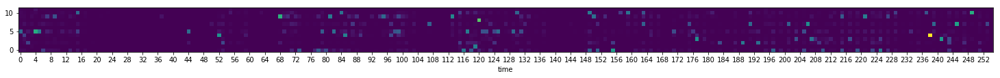

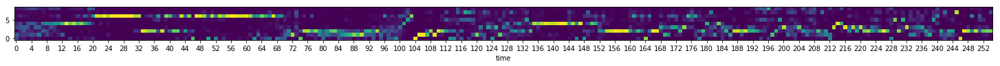

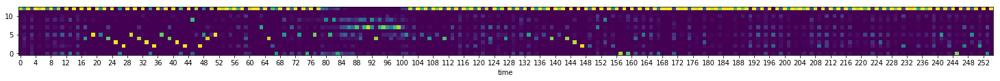

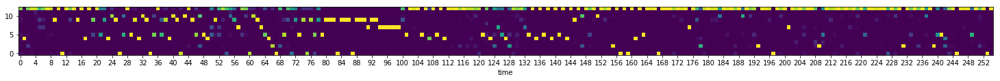

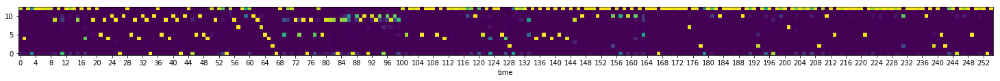

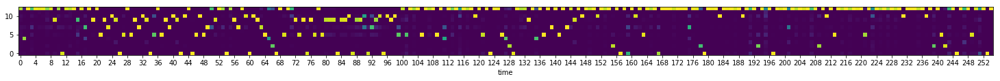

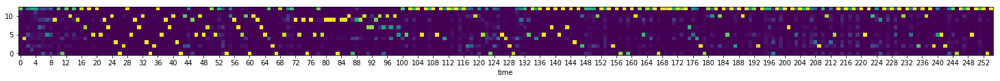

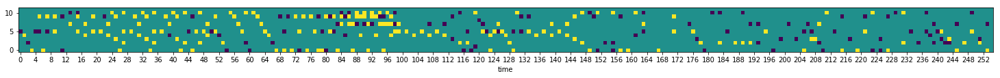

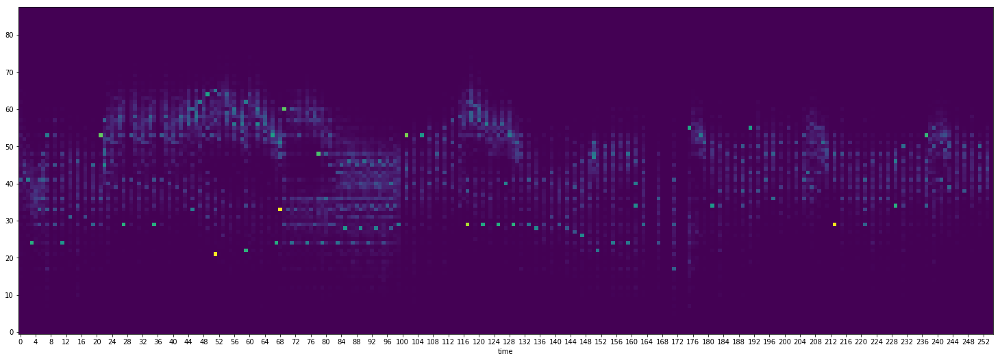

0.12282  mean for last:  0.112287


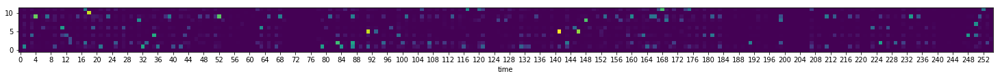

0.108873  mean for last:  0.111614


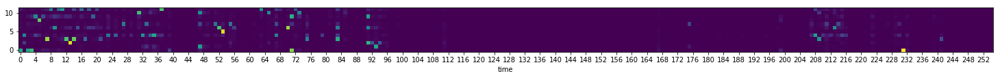

0.110581  mean for last:  0.11361


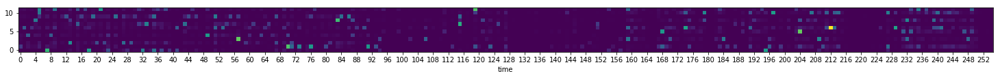

0.108123  mean for last:  0.113104


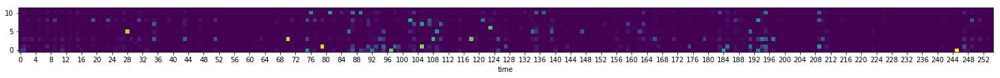

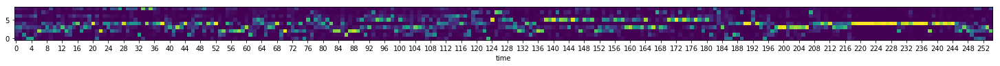

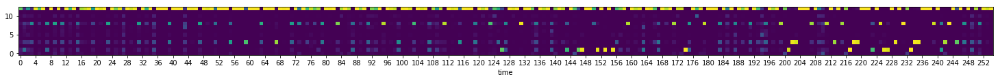

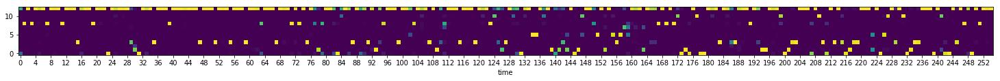

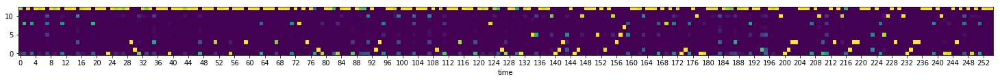

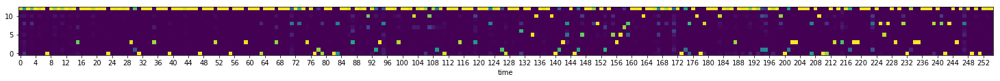

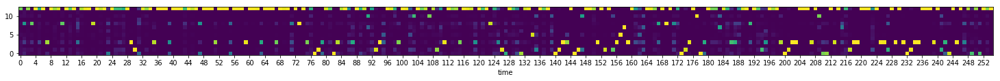

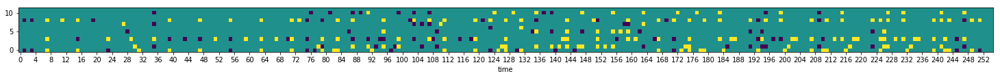

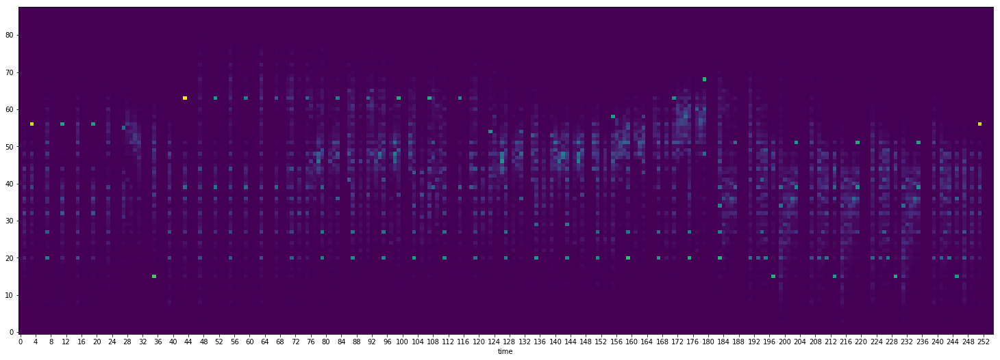

0.11632  mean for last:  0.111908


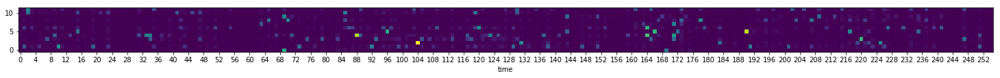

0.115678  mean for last:  0.112603


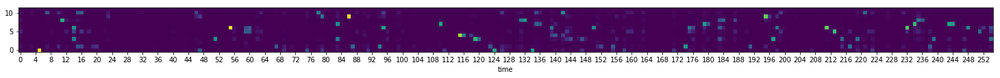

0.114036  mean for last:  0.11241


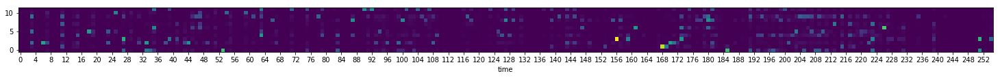

0.111237  mean for last:  0.112566


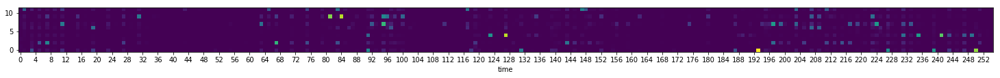

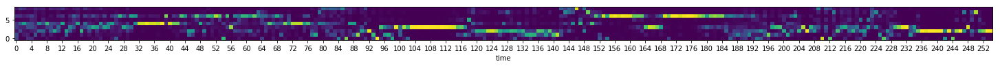

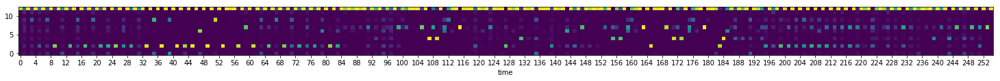

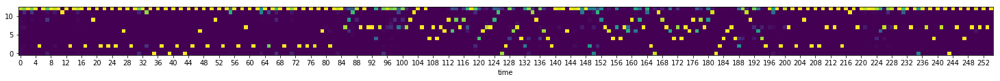

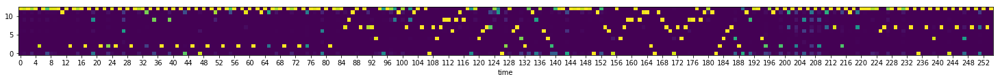

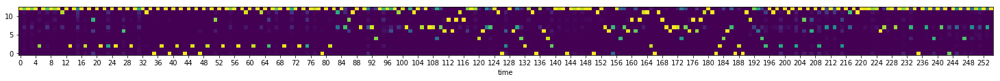

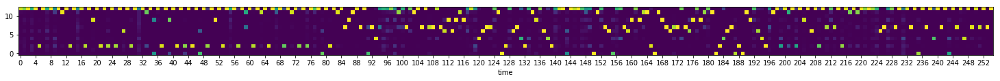

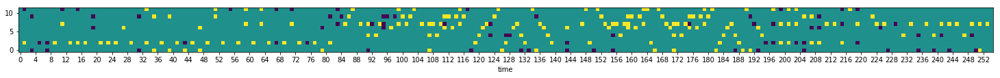

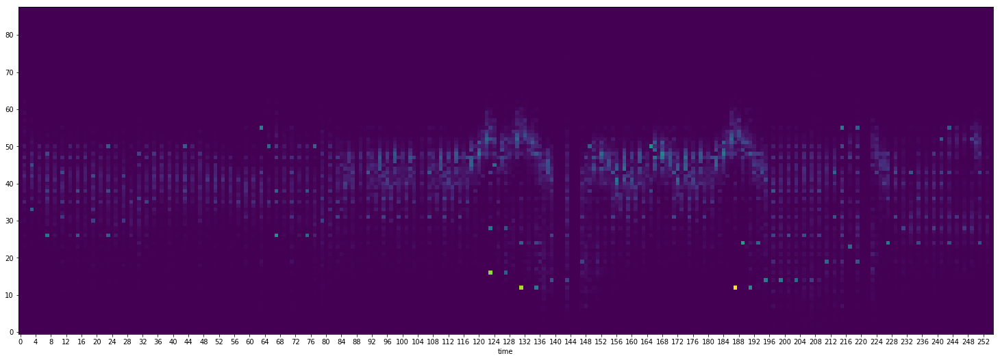

0.111229  mean for last:  0.112097


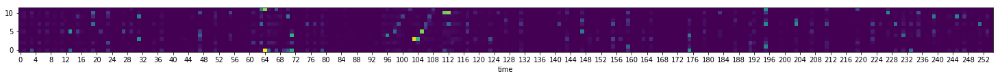

0.102562  mean for last:  0.110967


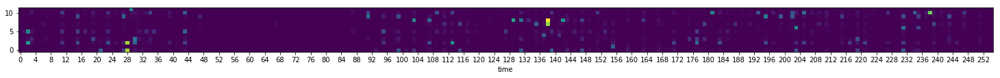

0.10697  mean for last:  0.111204


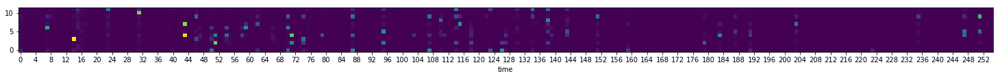

0.111105  mean for last:  0.111382


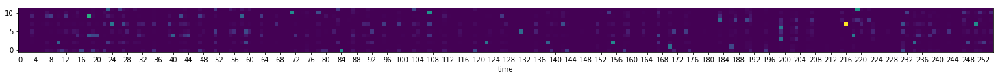

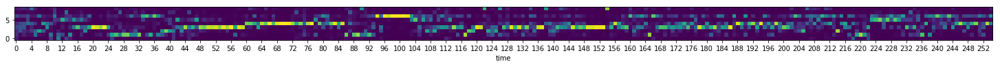

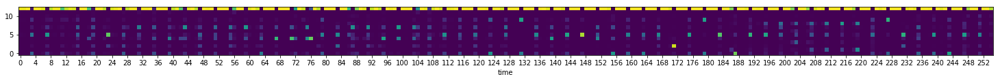

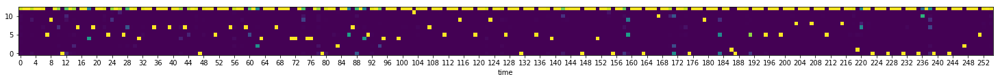

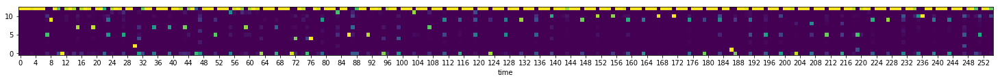

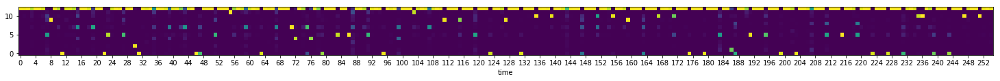

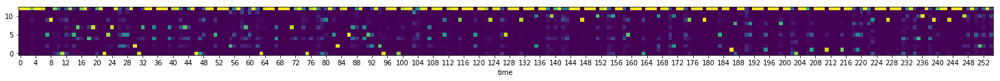

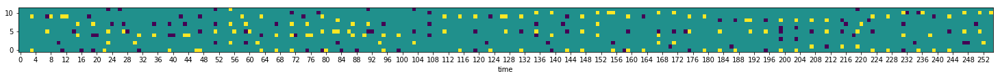

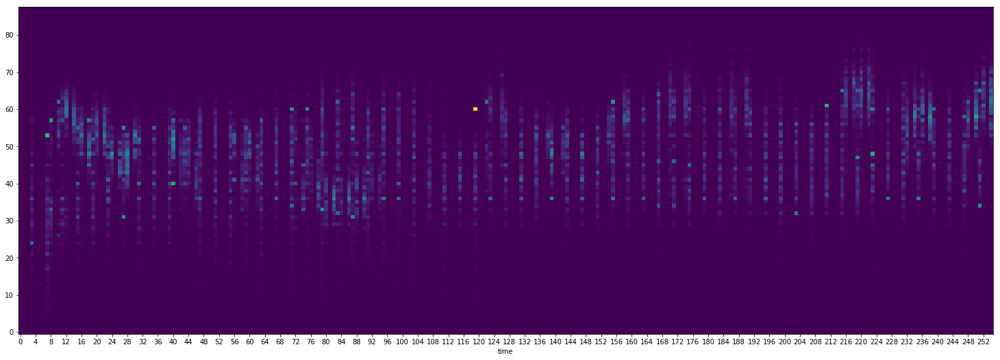

0.105313  mean for last:  0.111502


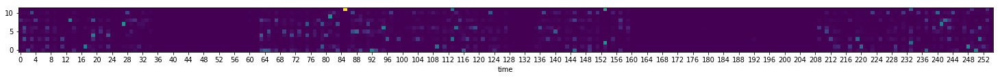

0.111791  mean for last:  0.111503


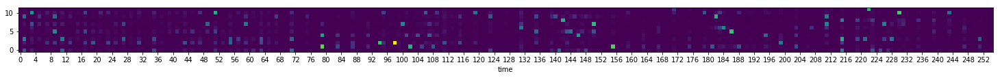

0.112505  mean for last:  0.111297


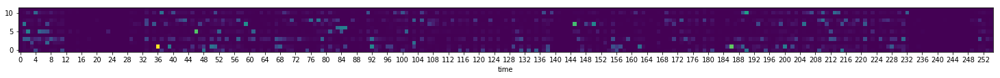

0.116836  mean for last:  0.111455


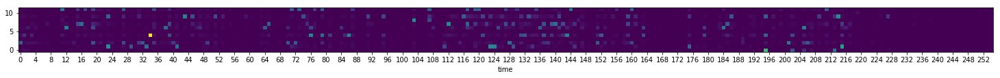

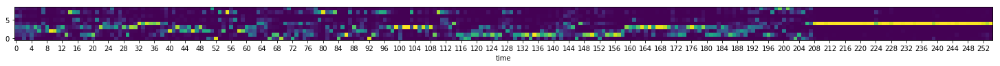

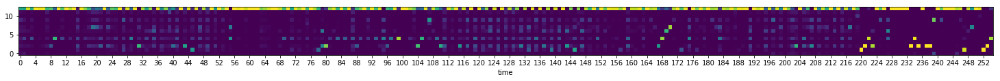

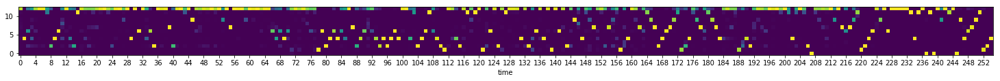

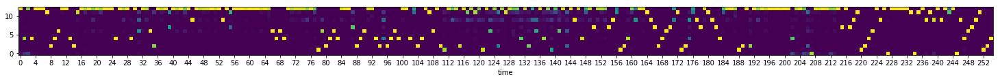

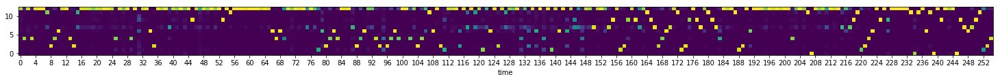

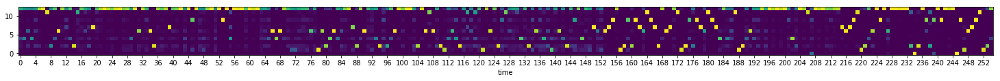

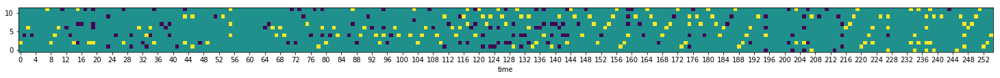

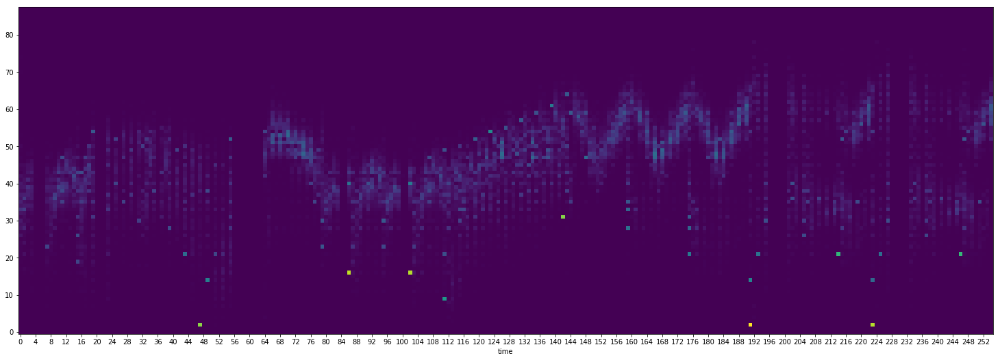

0.109528  mean for last:  0.111375


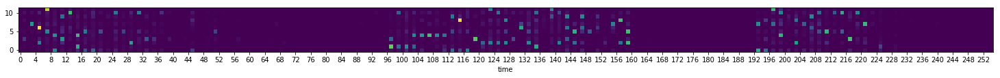

0.111626  mean for last:  0.111049


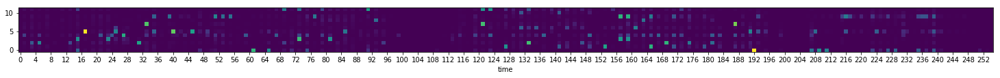

0.106688  mean for last:  0.110201


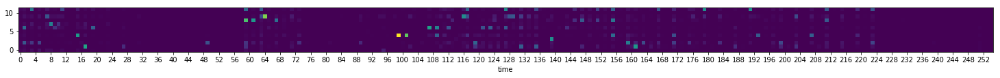

0.103351  mean for last:  0.110087


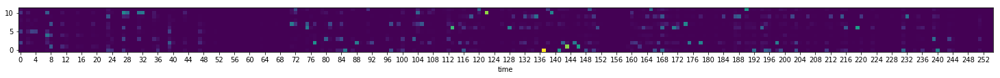

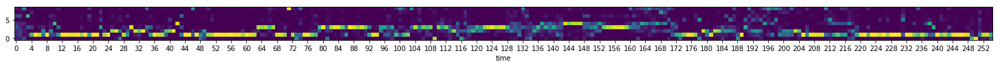

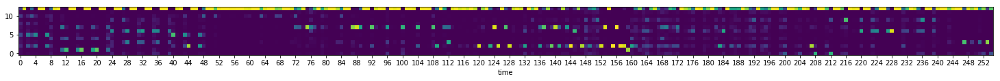

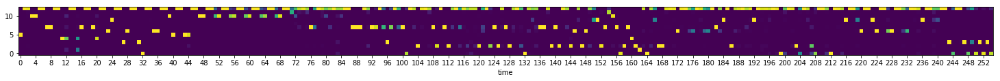

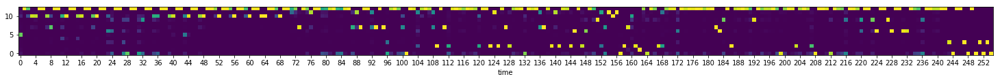

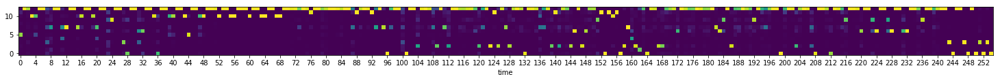

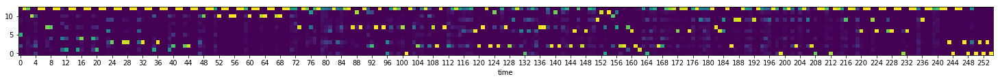

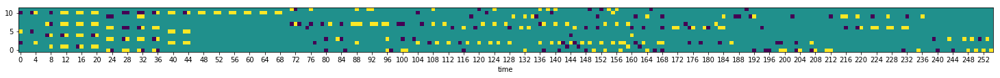

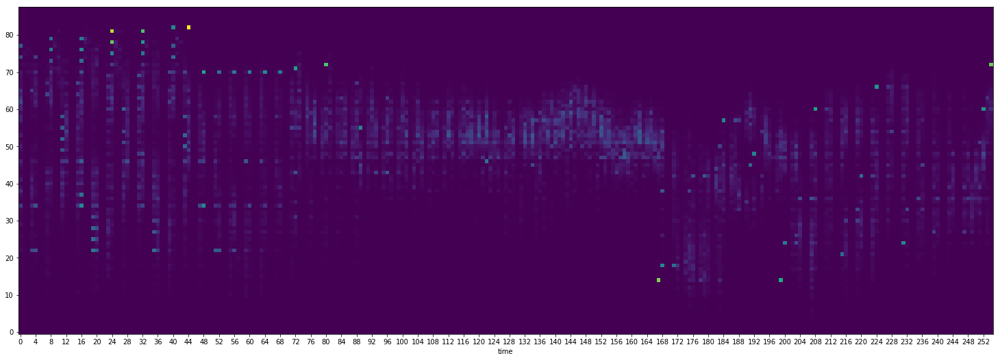

0.11019  mean for last:  0.111939


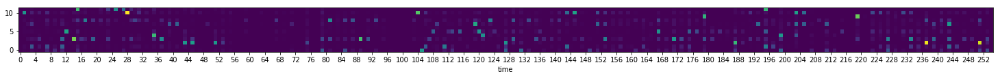

0.111148  mean for last:  0.110975


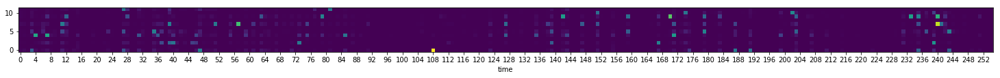

0.115558  mean for last:  0.112603


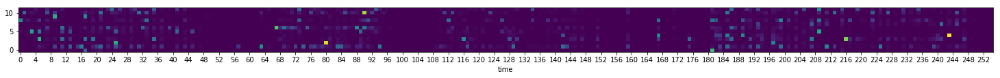

0.113791  mean for last:  0.111009


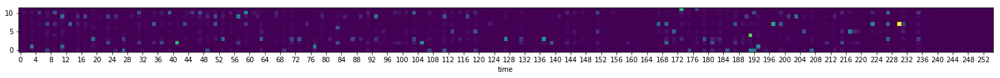

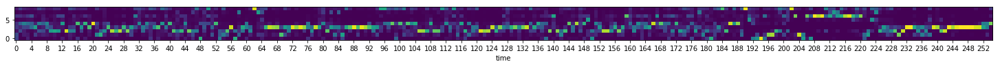

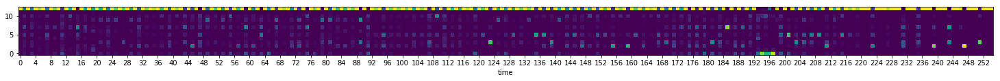

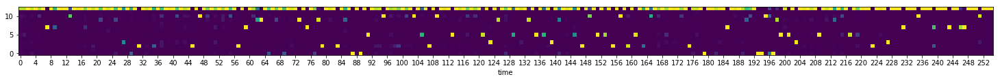

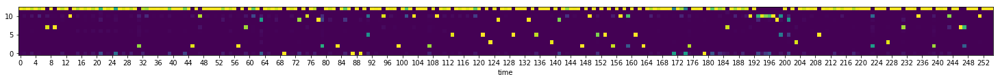

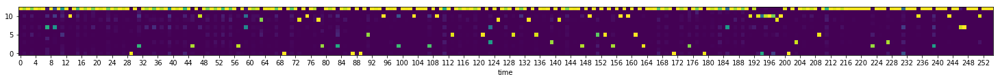

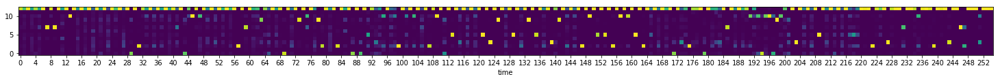

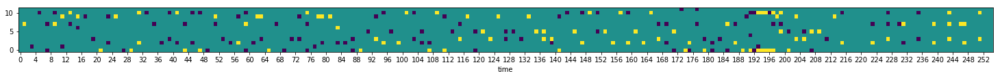

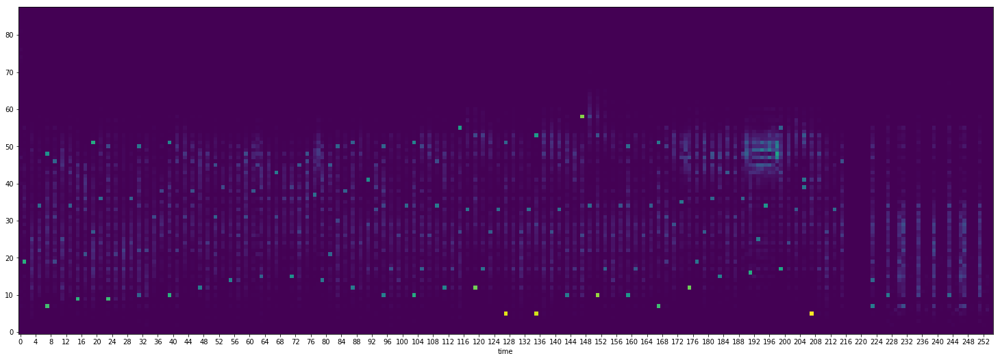

0.124969  mean for last:  0.111296


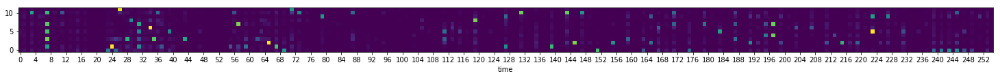

0.114509  mean for last:  0.111183


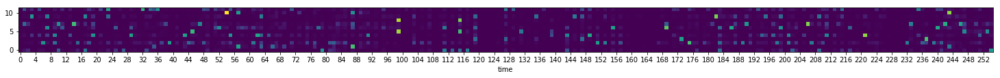

0.113233  mean for last:  0.110633


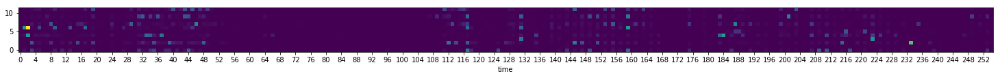

0.110702  mean for last:  0.111858


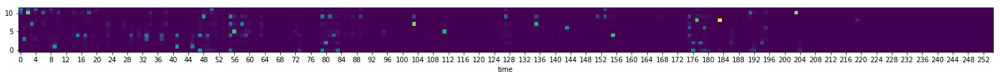

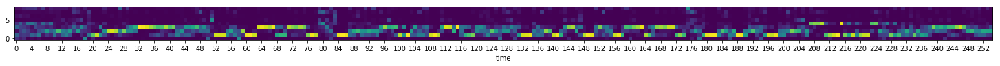

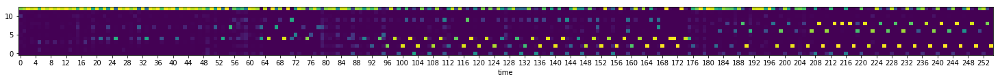

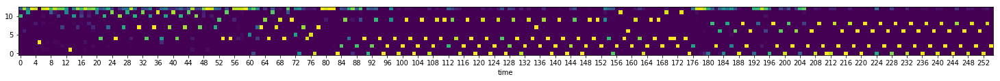

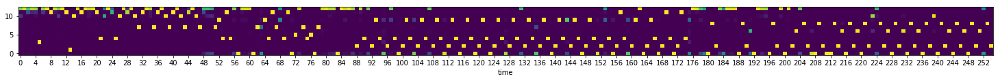

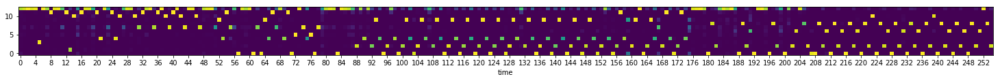

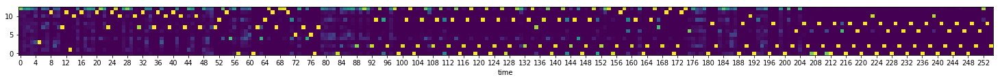

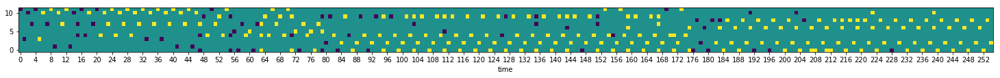

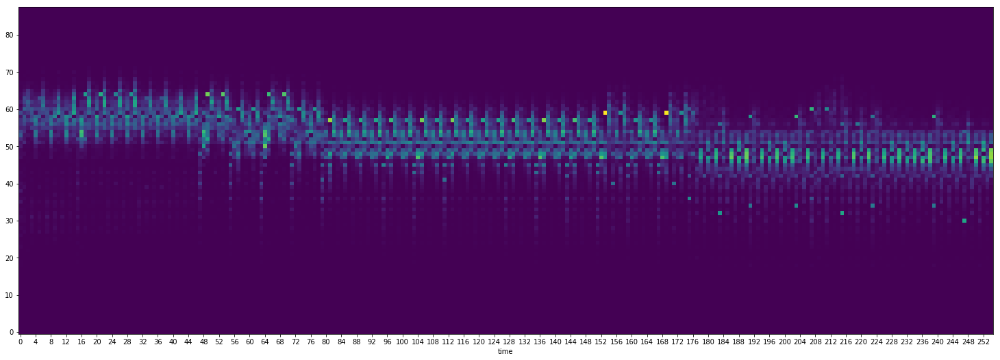

0.113111  mean for last:  0.111266


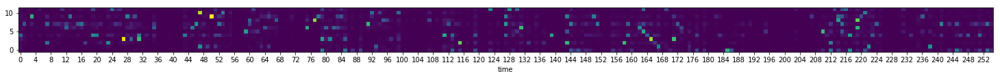

0.114851  mean for last:  0.110875


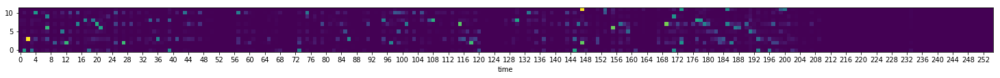

0.11089  mean for last:  0.111309


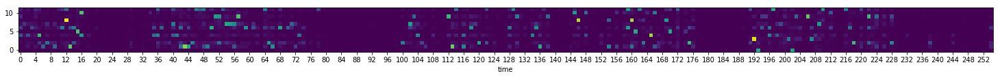

0.113273  mean for last:  0.111249


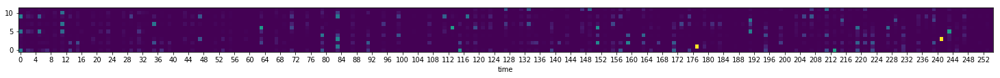

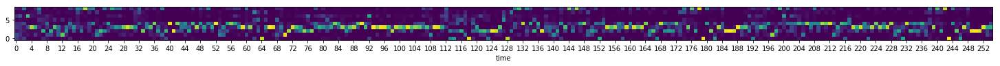

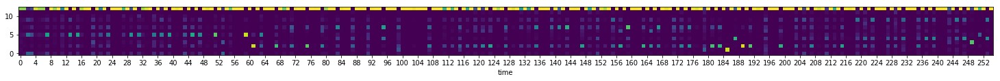

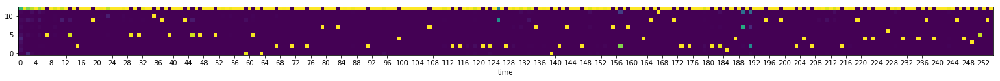

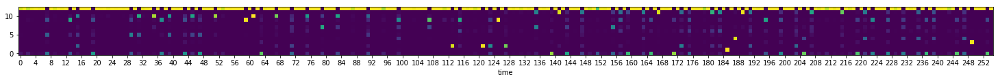

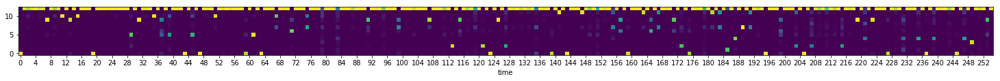

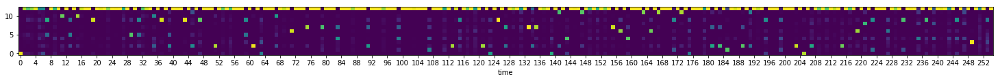

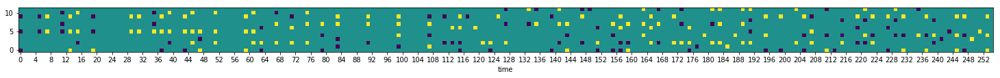

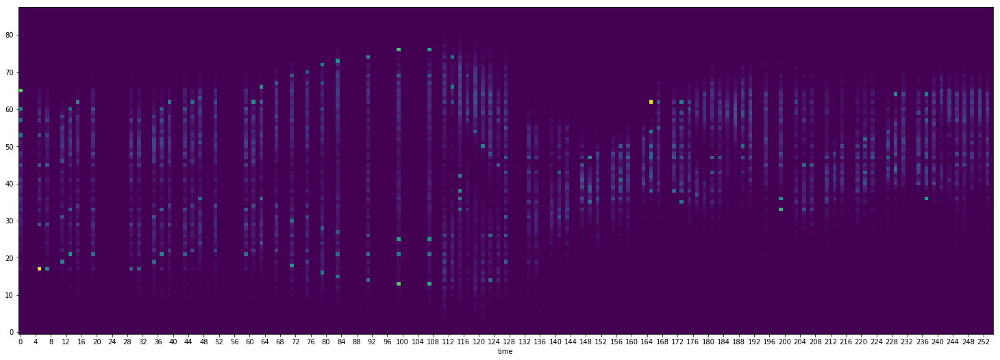

0.114122  mean for last:  0.109923


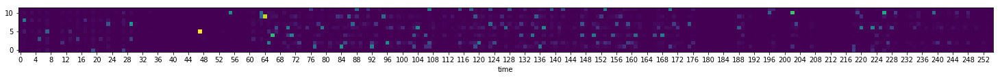

0.11053  mean for last:  0.110329


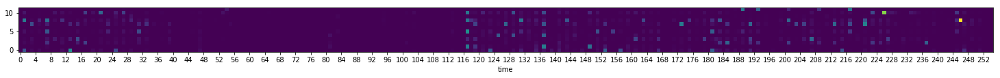

0.11177  mean for last:  0.110643


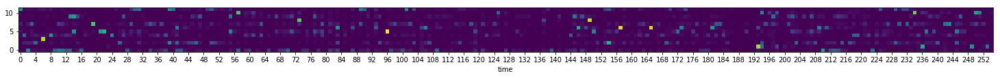

0.119174  mean for last:  0.110386


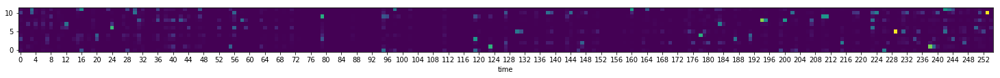

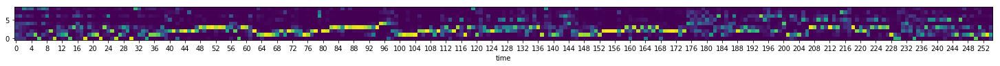

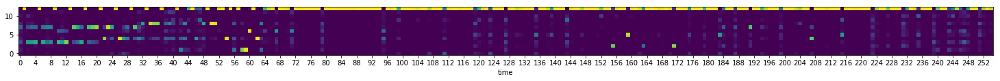

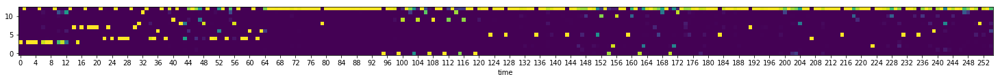

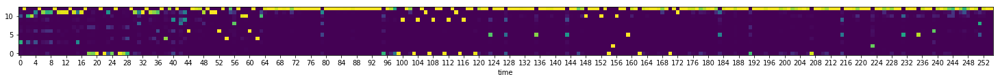

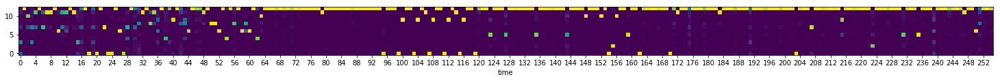

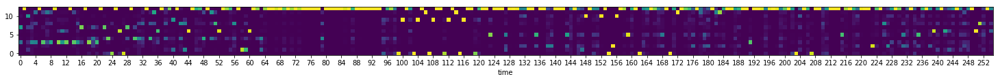

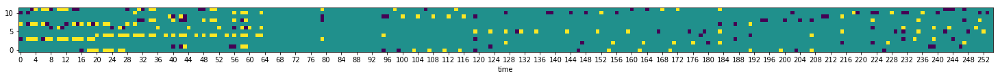

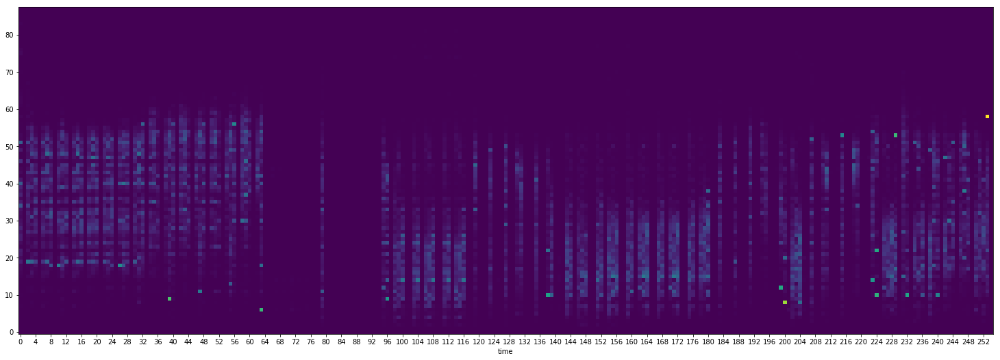

0.110628  mean for last:  0.111023


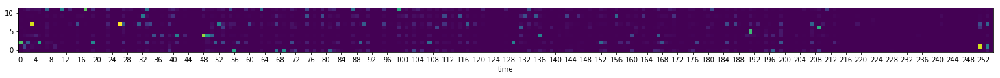

0.111467  mean for last:  0.110171


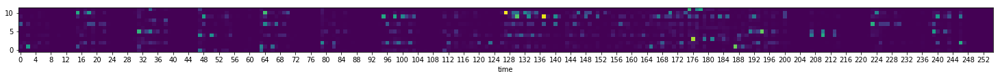

0.105983  mean for last:  0.110984


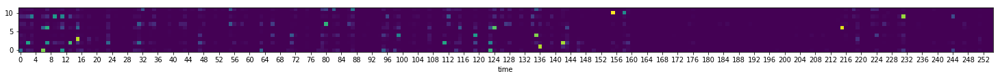

0.108499  mean for last:  0.109096


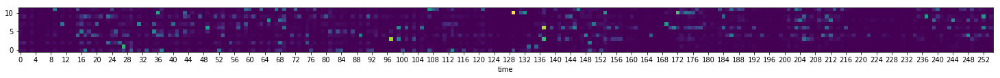

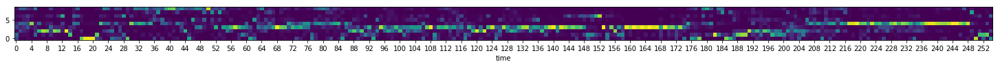

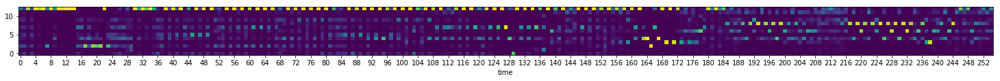

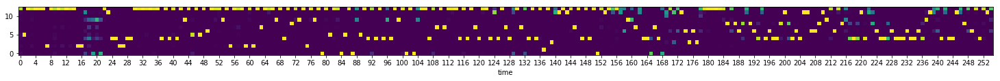

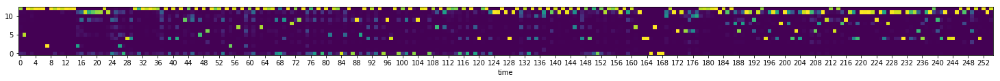

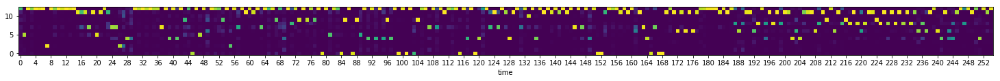

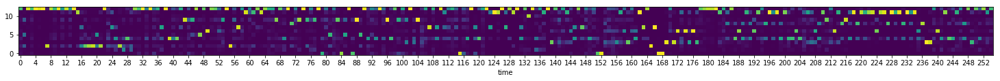

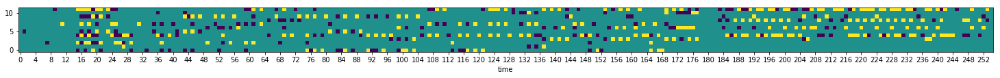

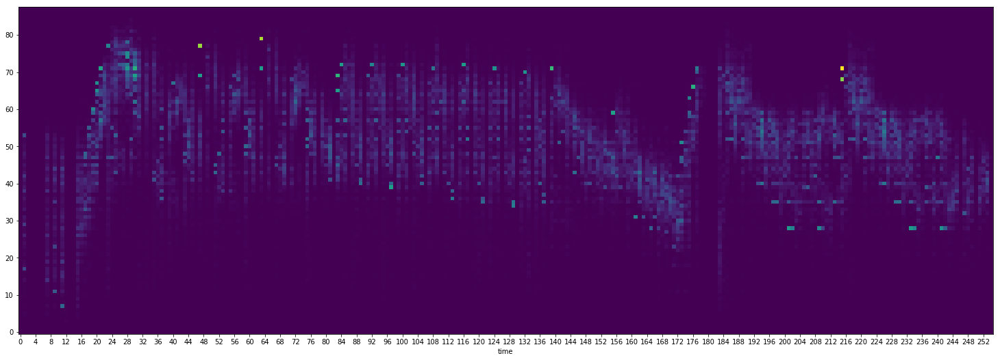

0.114528  mean for last:  0.11021


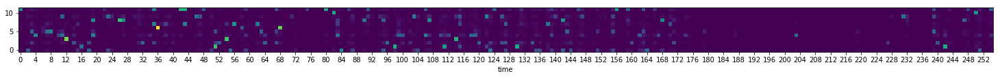

0.11443  mean for last:  0.112111


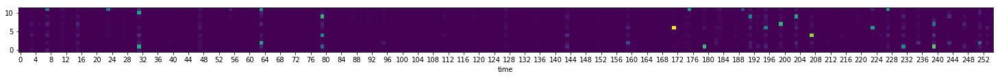

0.104919  mean for last:  0.110294


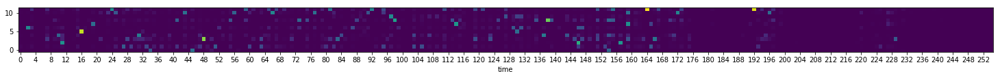

0.106464  mean for last:  0.110375


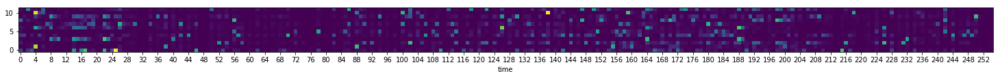

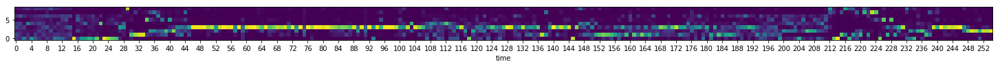

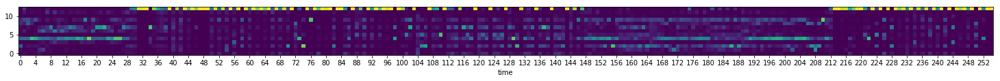

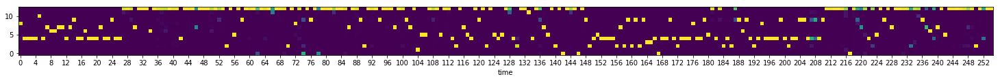

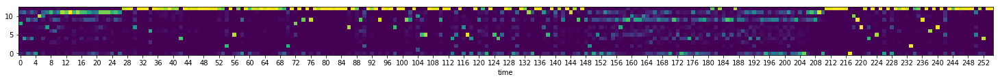

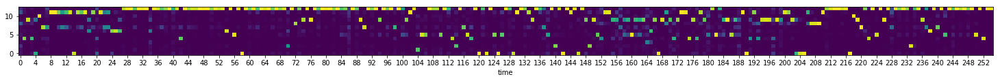

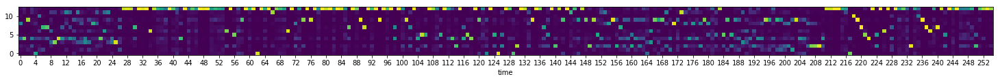

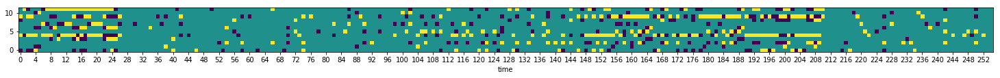

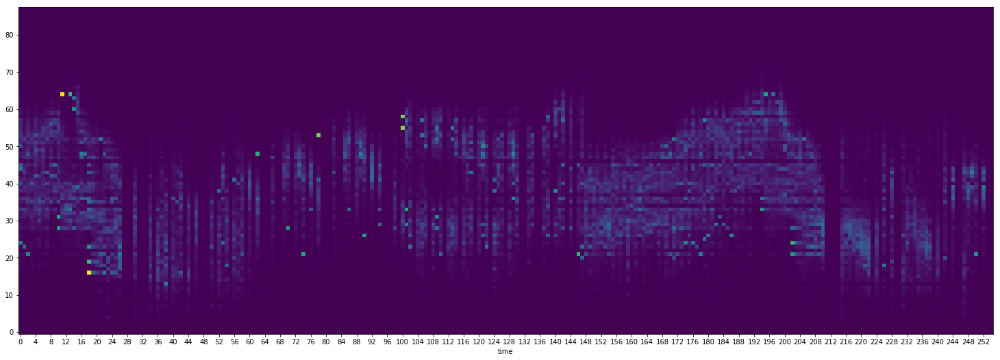

0.10913  mean for last:  0.110558


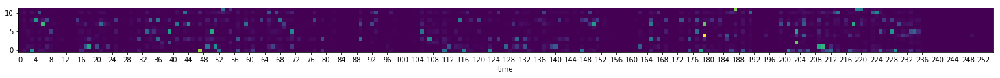

0.103897  mean for last:  0.111071


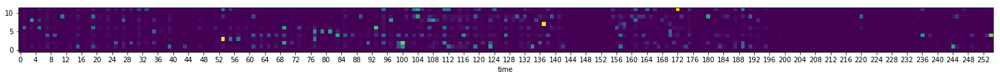

0.122343  mean for last:  0.110067


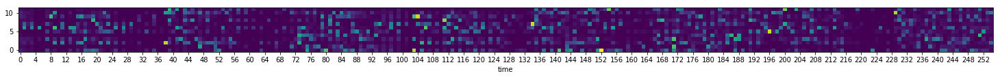

0.11023  mean for last:  0.110776


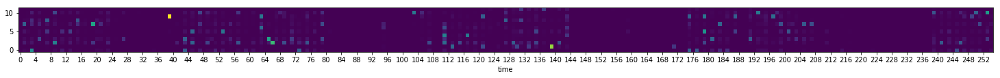

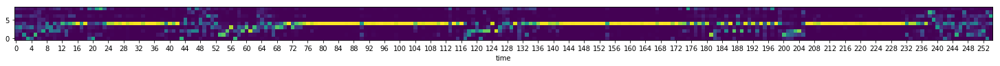

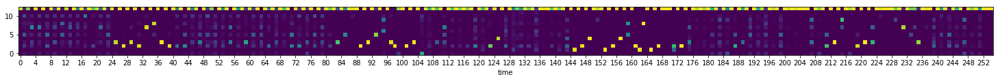

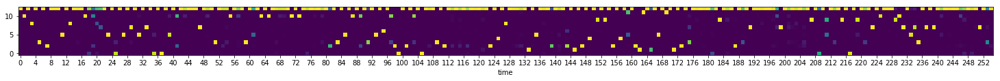

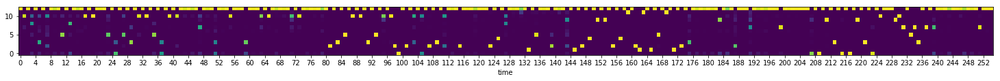

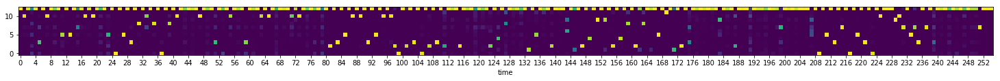

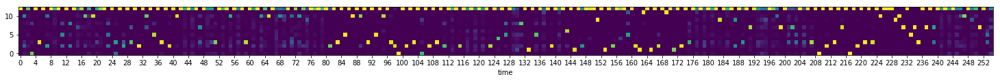

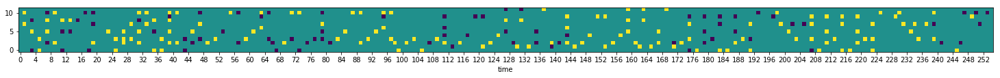

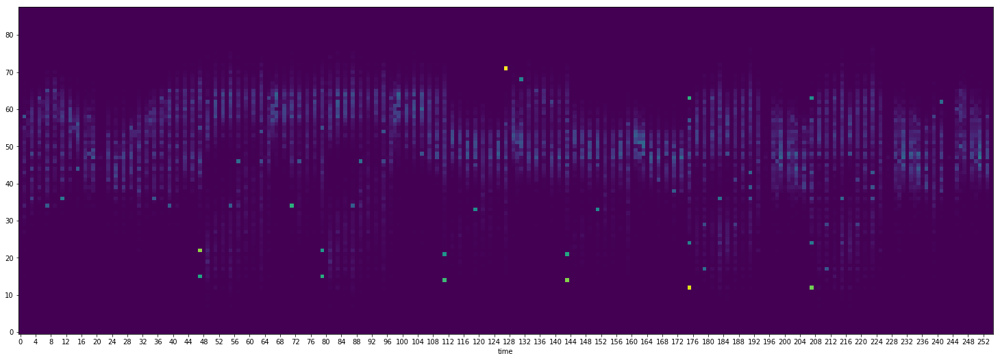

0.110161  mean for last:  0.110289


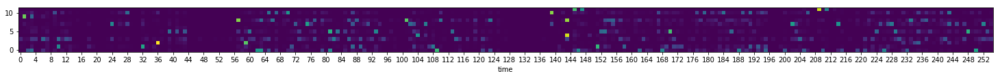

0.105391  mean for last:  0.109741


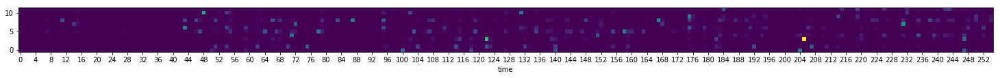

0.102975  mean for last:  0.110942


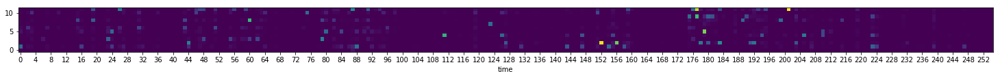

0.11427  mean for last:  0.11118


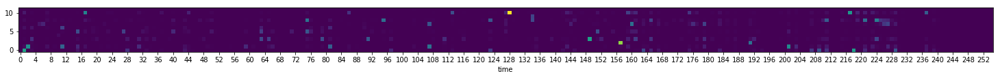

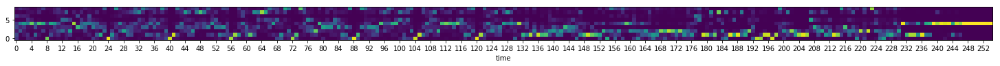

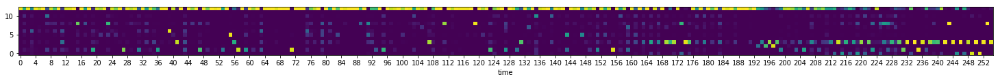

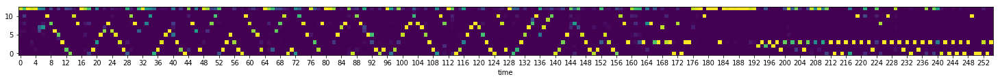

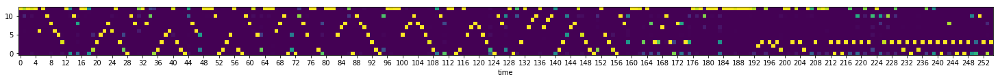

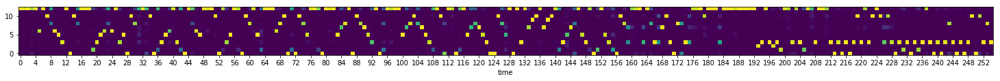

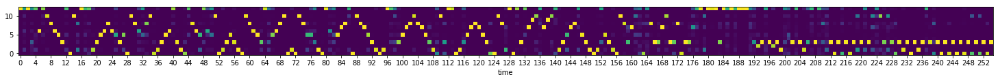

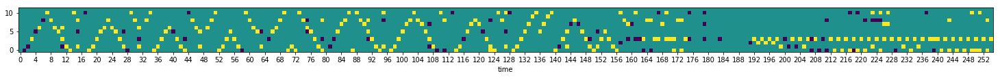

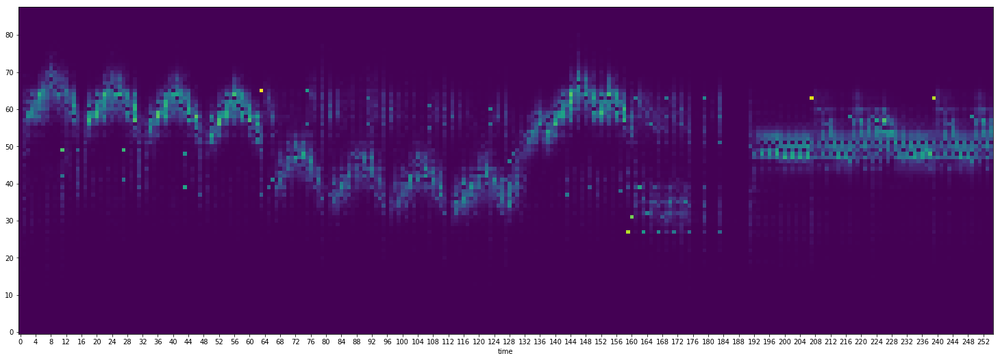

0.103577  mean for last:  0.110164


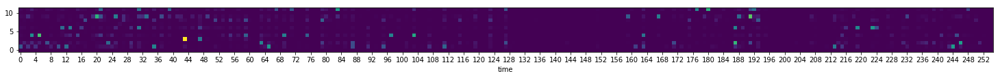

0.109297  mean for last:  0.11069


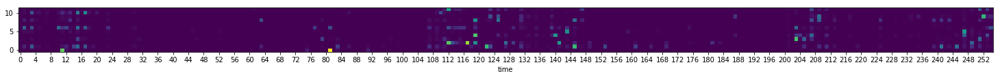

0.104694  mean for last:  0.110144


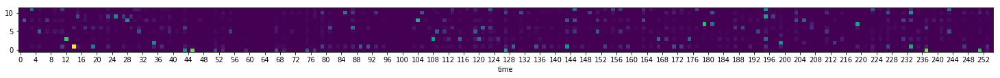

0.109885  mean for last:  0.109947


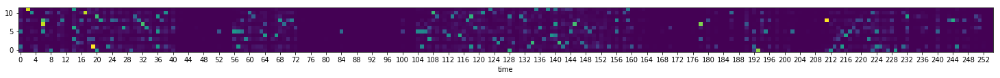

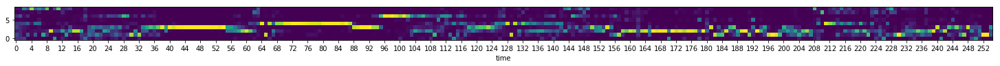

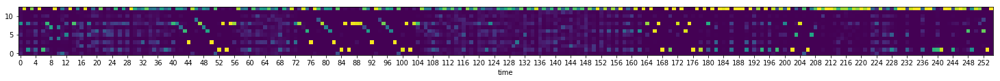

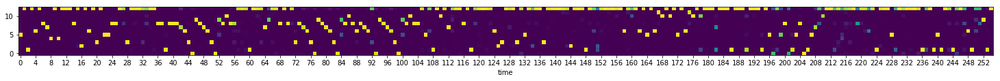

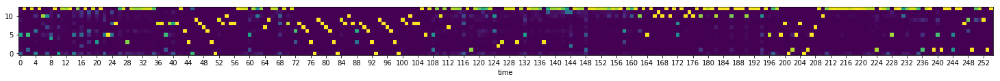

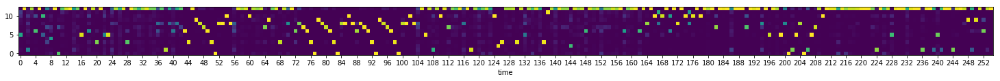

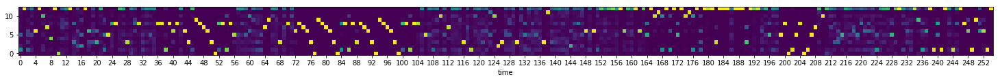

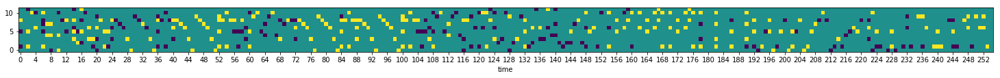

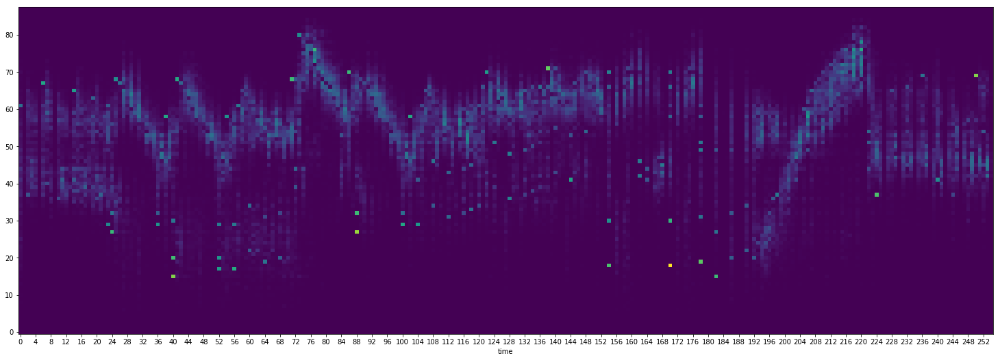

0.113441  mean for last:  0.110657


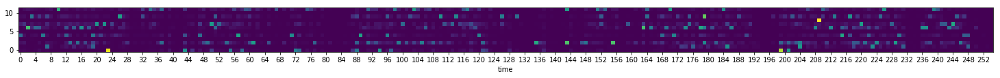

0.112072  mean for last:  0.110224


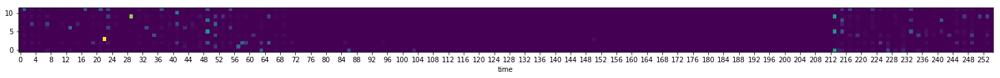

0.116212  mean for last:  0.111165


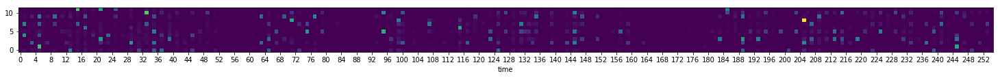

0.106379  mean for last:  0.108975


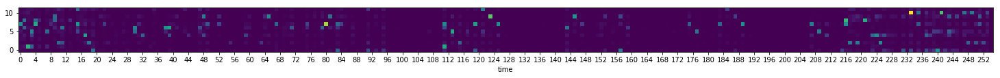

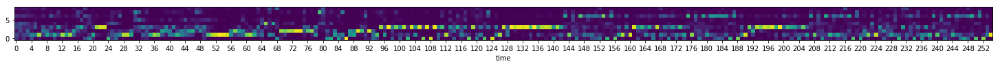

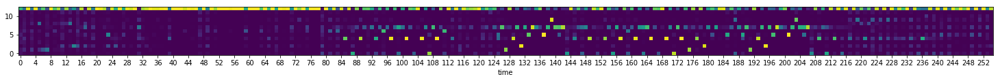

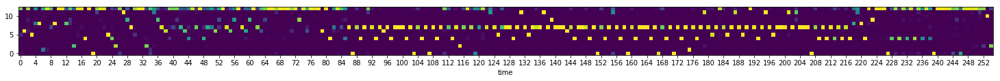

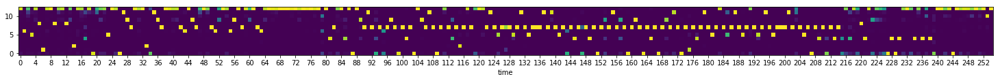

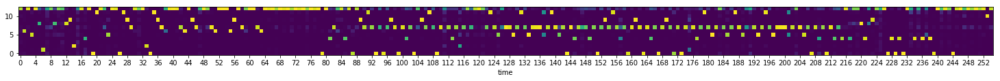

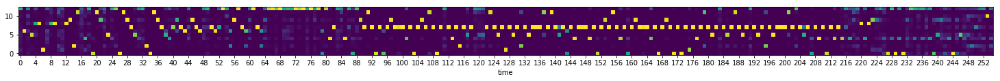

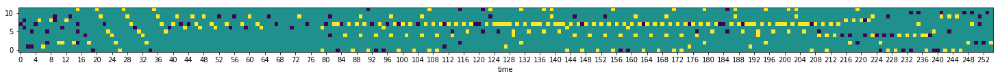

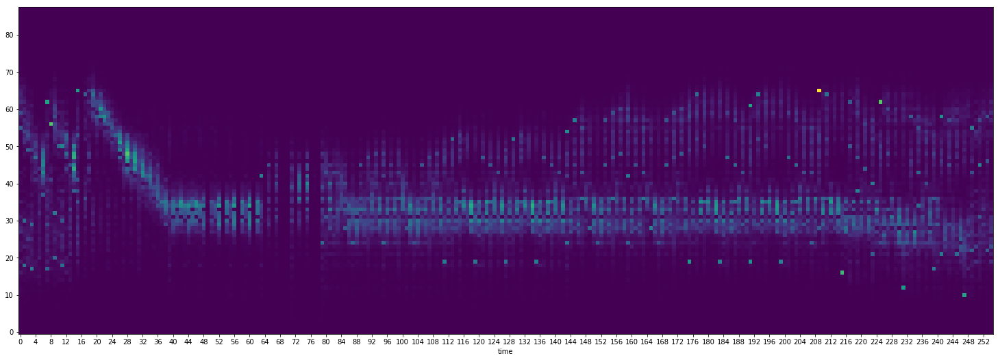

0.113332  mean for last:  0.109987


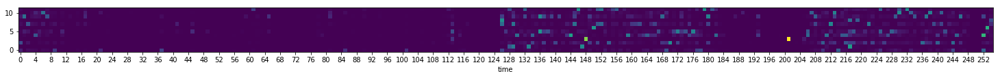

0.106981  mean for last:  0.11005


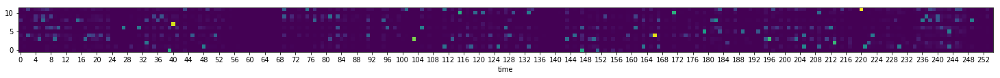

0.110045  mean for last:  0.110038


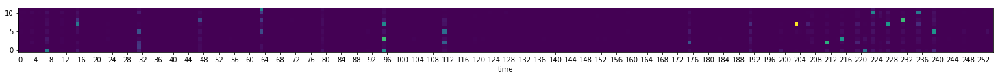

0.112389  mean for last:  0.110801


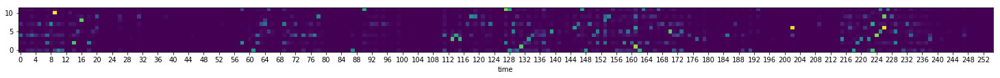

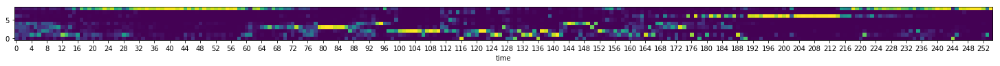

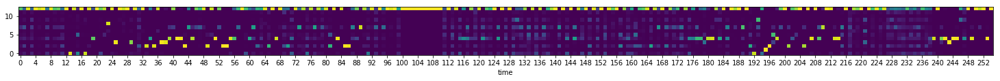

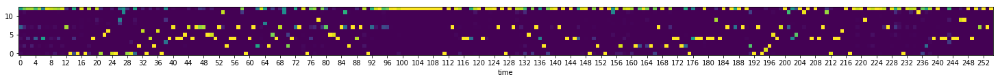

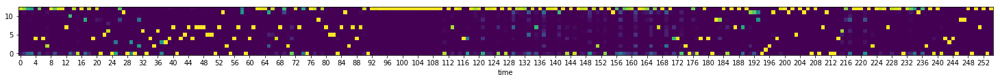

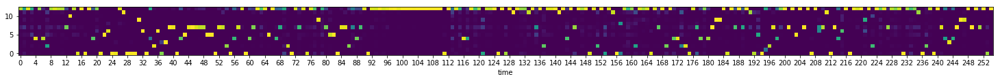

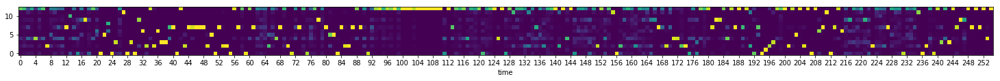

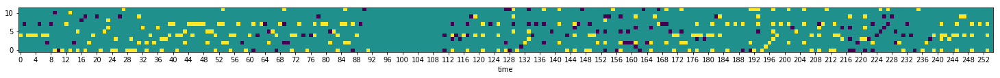

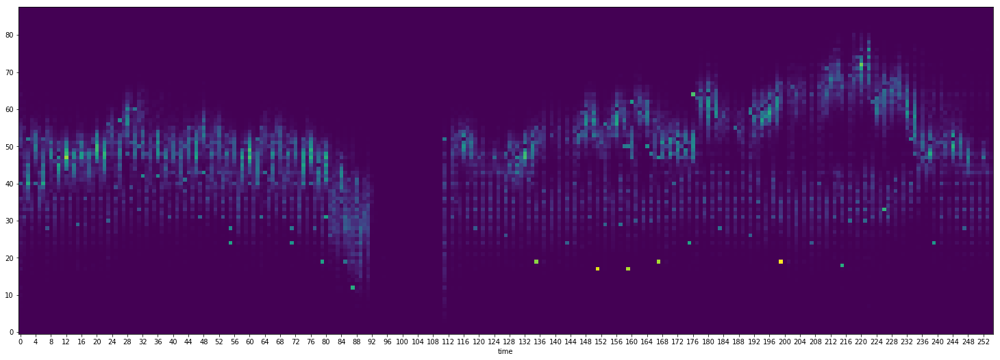

0.111119  mean for last:  0.10956


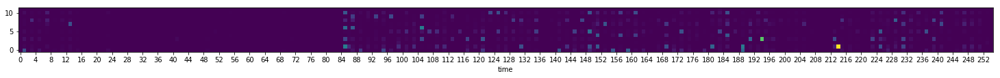

0.105547  mean for last:  0.109891


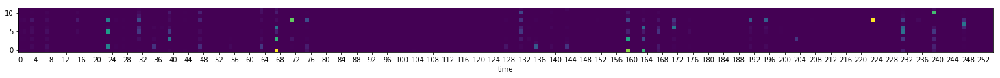

0.106219  mean for last:  0.109414


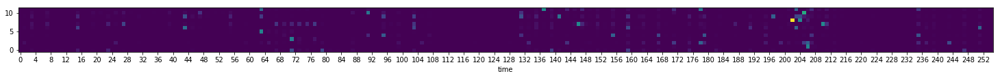

0.107741  mean for last:  0.110216


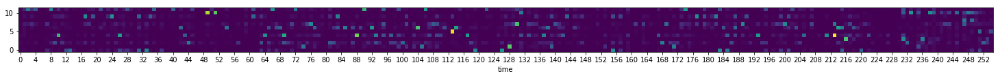

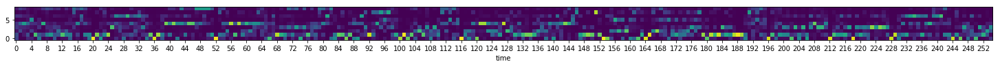

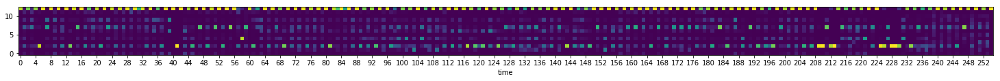

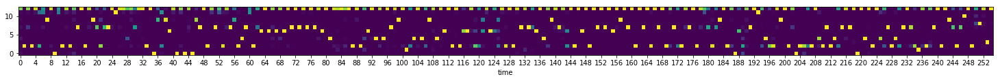

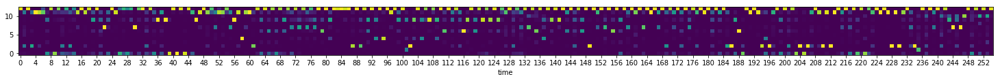

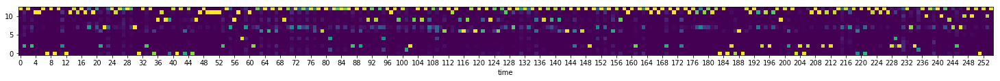

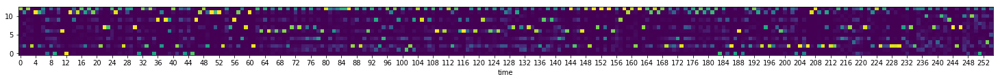

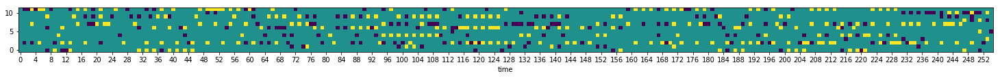

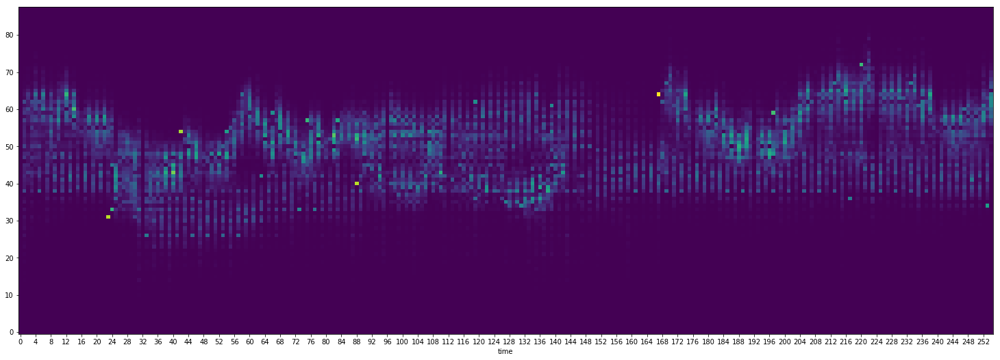

0.115247  mean for last:  0.110232


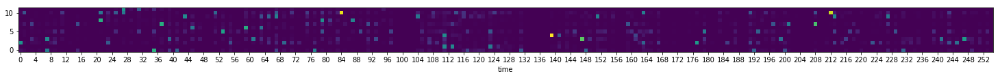

0.105497  mean for last:  0.109254


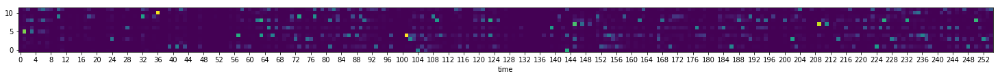

0.108965  mean for last:  0.110374


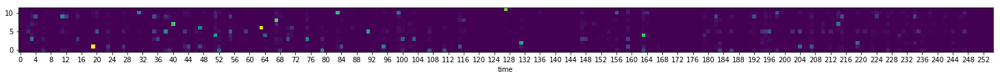

0.109477  mean for last:  0.110316


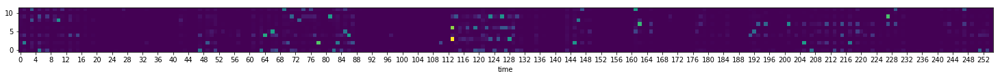

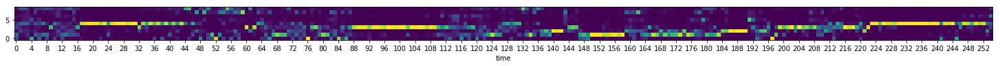

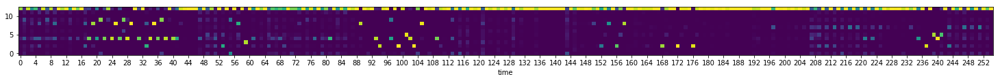

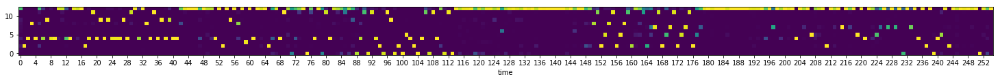

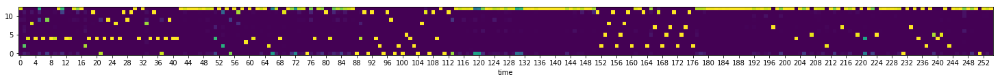

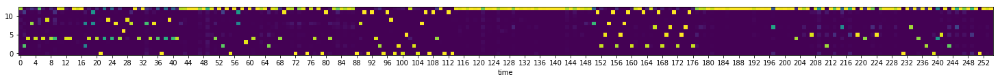

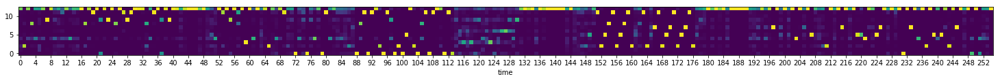

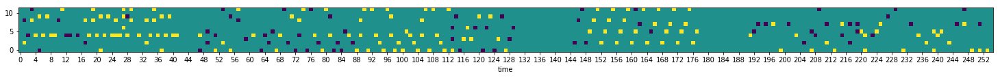

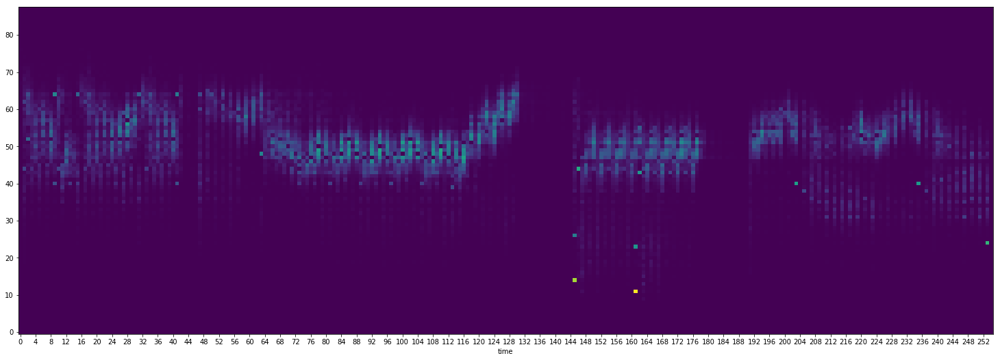

0.108795  mean for last:  0.108953


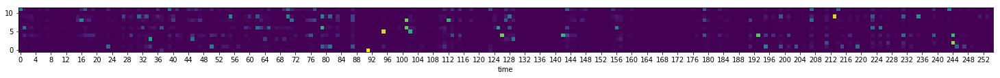

0.113252  mean for last:  0.109497


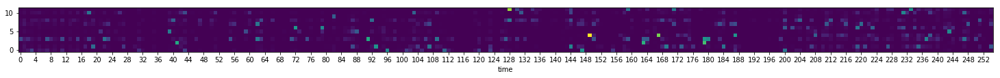

0.105679  mean for last:  0.109876


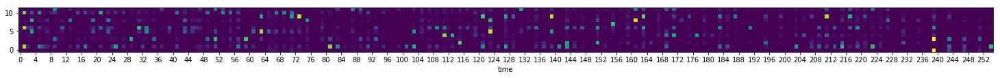

0.114162  mean for last:  0.109797


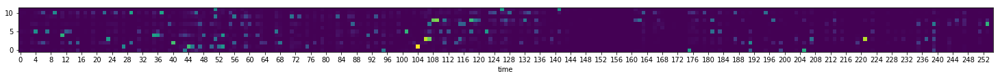

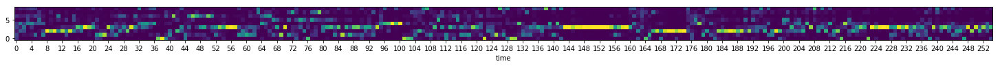

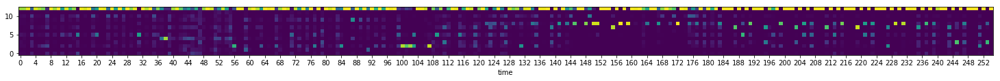

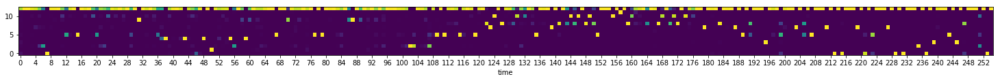

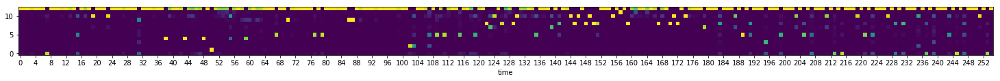

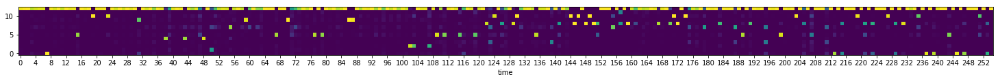

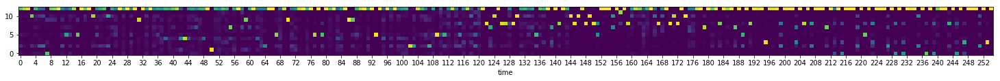

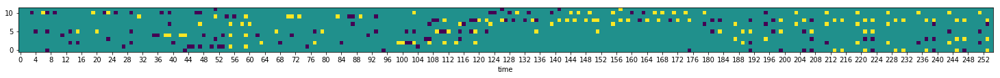

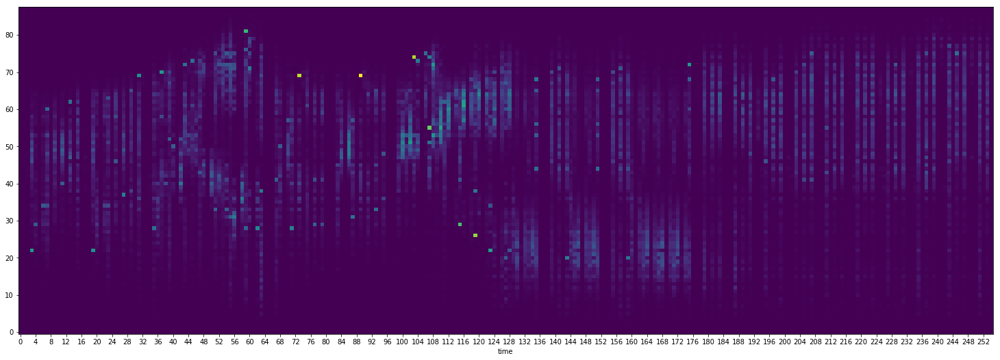

0.10492  mean for last:  0.109778


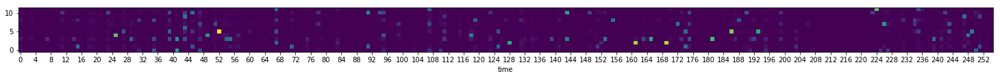

0.106232  mean for last:  0.109065


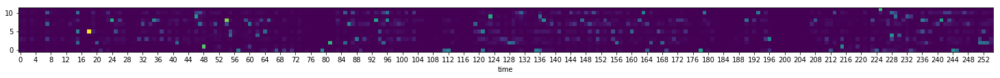

0.104811  mean for last:  0.109253


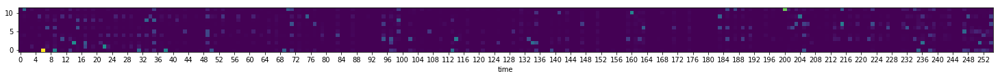

0.110045  mean for last:  0.109304


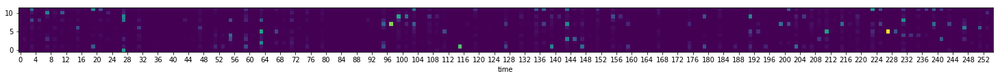

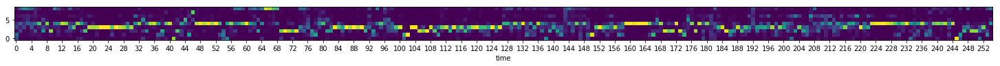

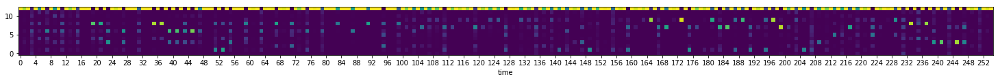

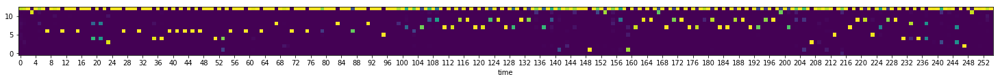

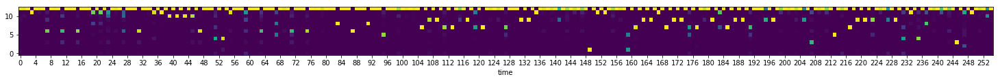

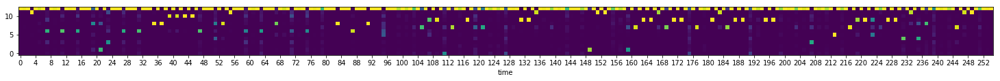

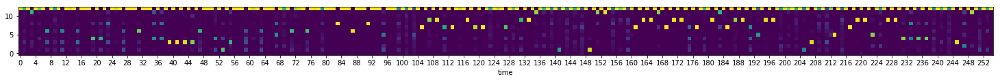

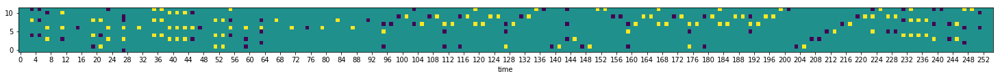

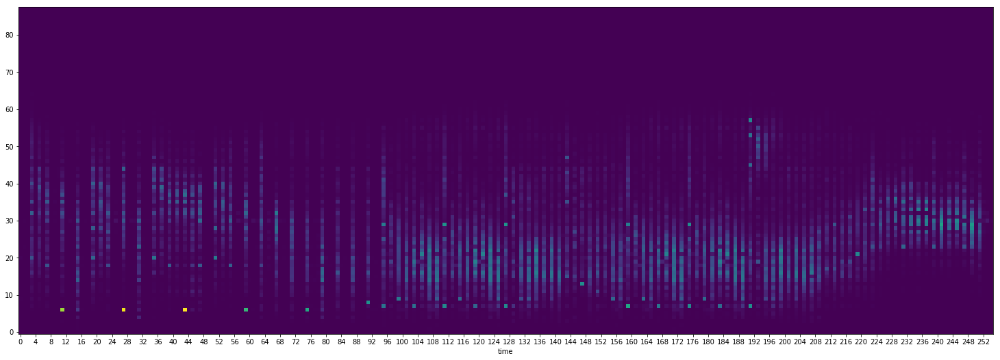

0.0991875  mean for last:  0.108712


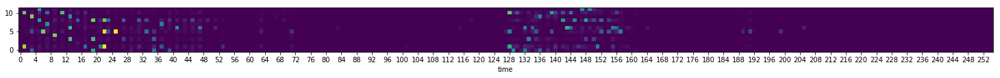

0.103317  mean for last:  0.108943


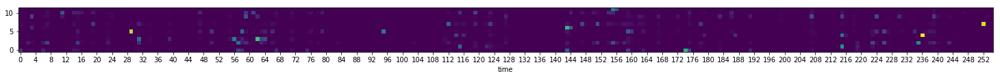

0.115213  mean for last:  0.109207


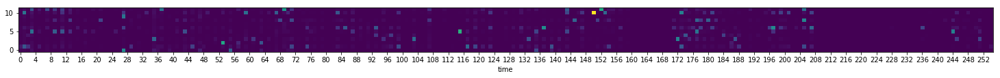

0.103157  mean for last:  0.111117


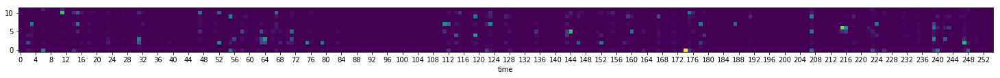

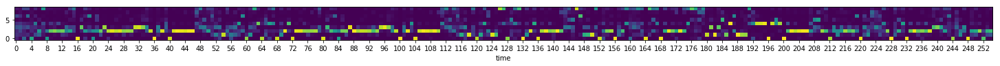

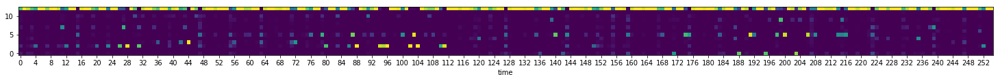

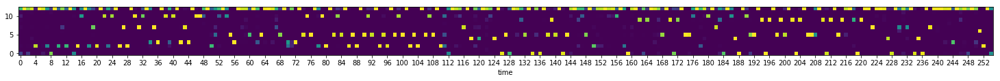

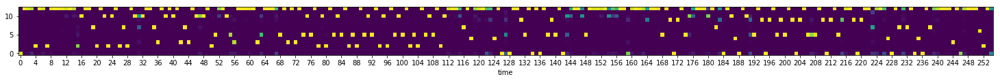

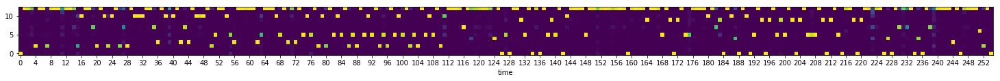

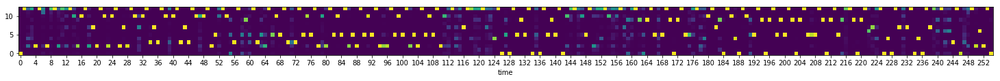

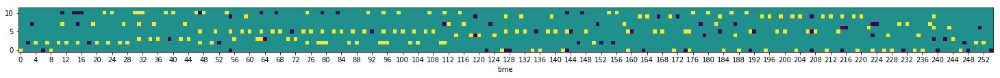

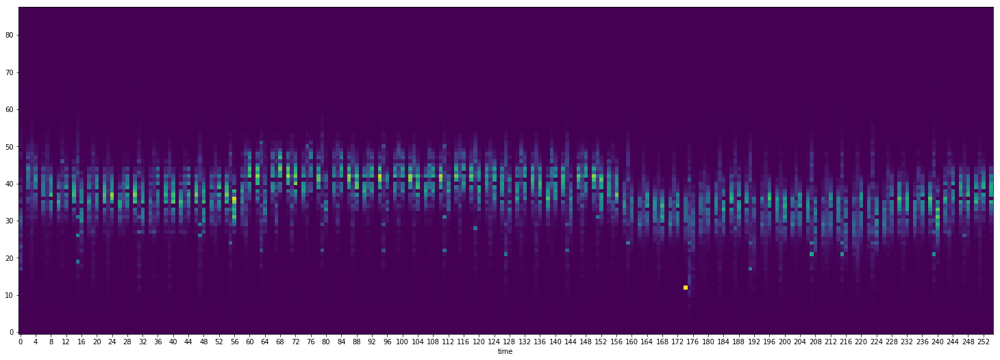

0.113267  mean for last:  0.111582


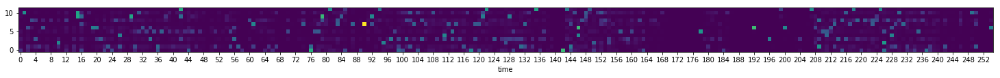

0.110856  mean for last:  0.114494


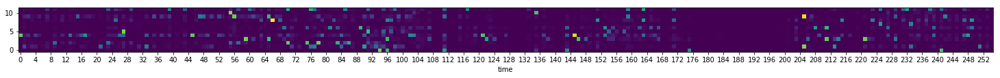

0.119481  mean for last:  0.112697


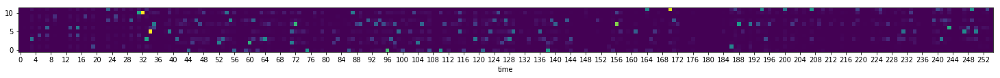

0.112721  mean for last:  0.111045


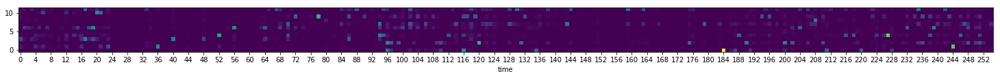

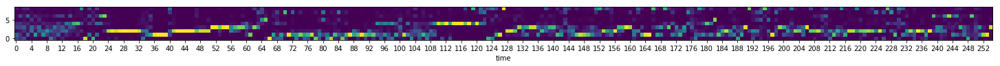

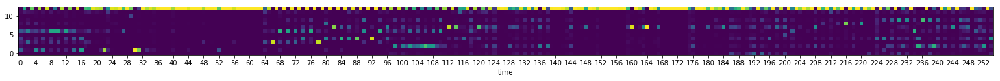

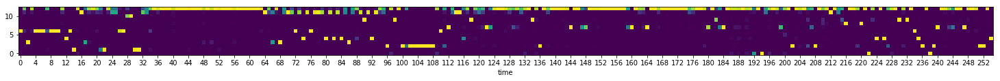

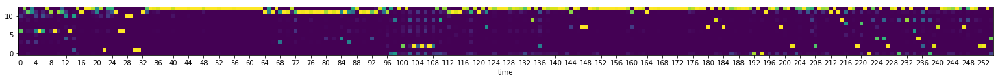

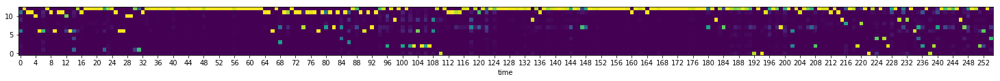

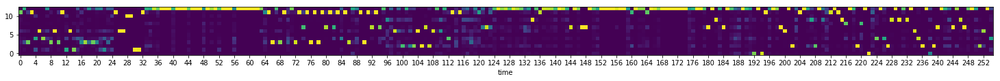

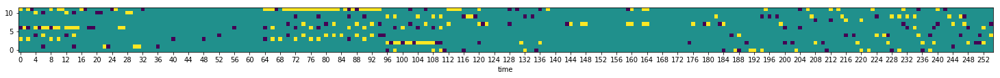

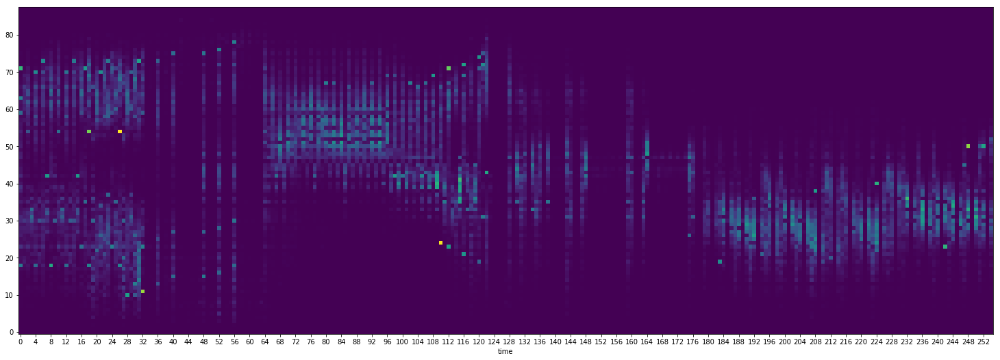

0.108053  mean for last:  0.110303


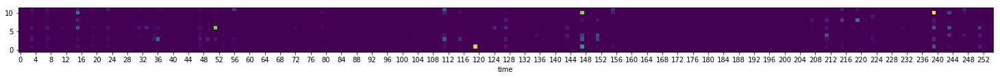

0.112205  mean for last:  0.109226


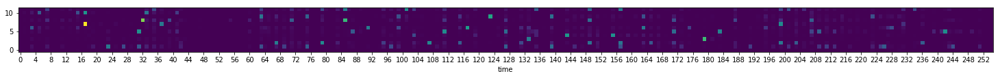

0.111977  mean for last:  0.110263


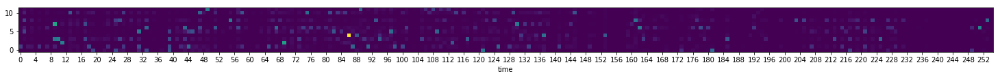

0.112709  mean for last:  0.109648


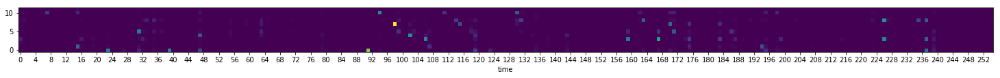

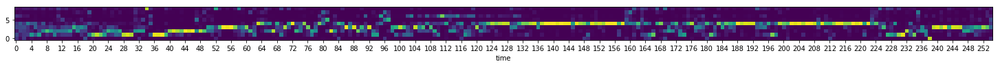

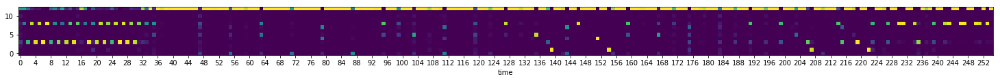

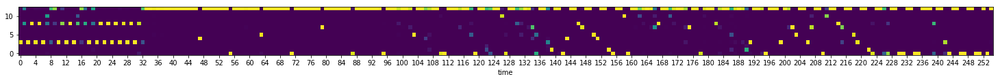

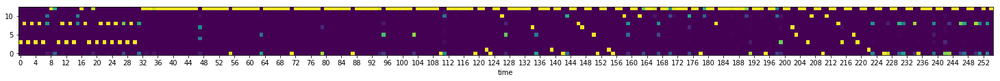

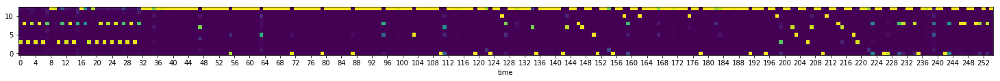

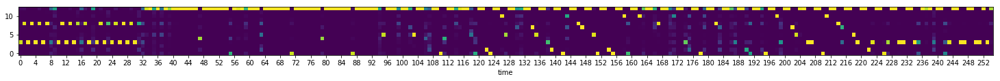

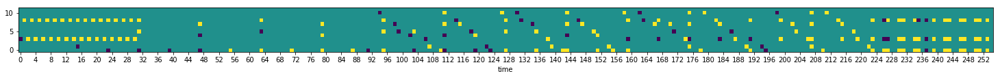

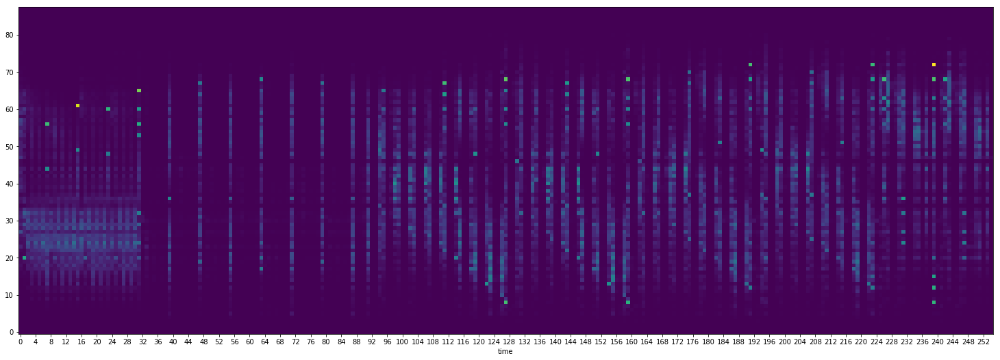

0.11054  mean for last:  0.109536


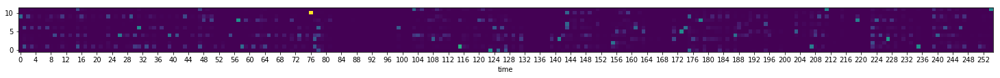

0.110124  mean for last:  0.108778


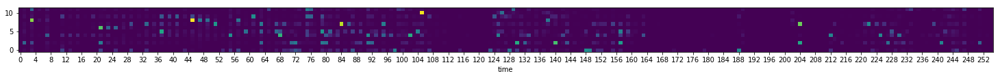

0.106236  mean for last:  0.108736


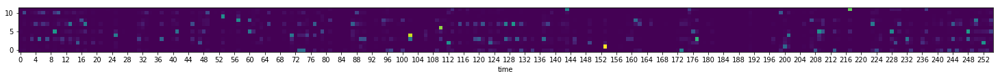

0.103227  mean for last:  0.108523


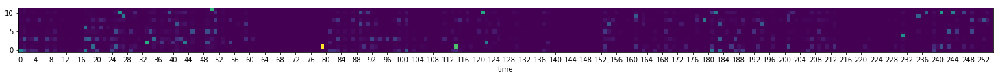

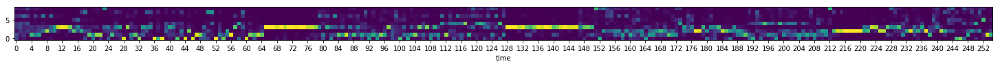

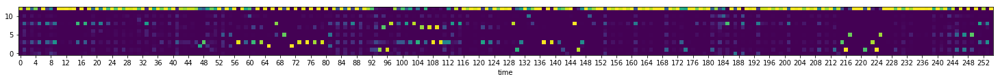

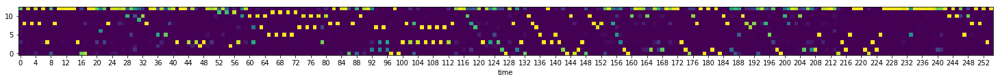

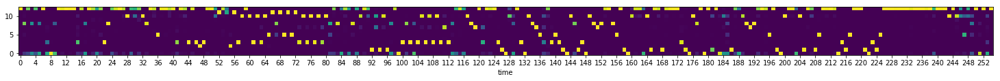

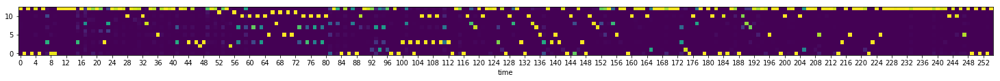

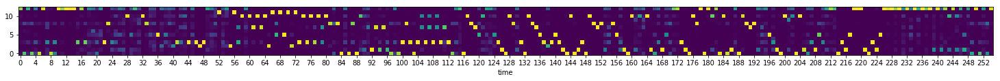

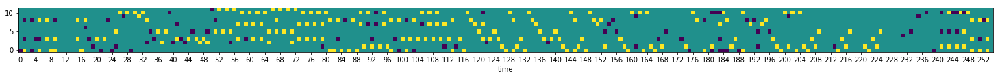

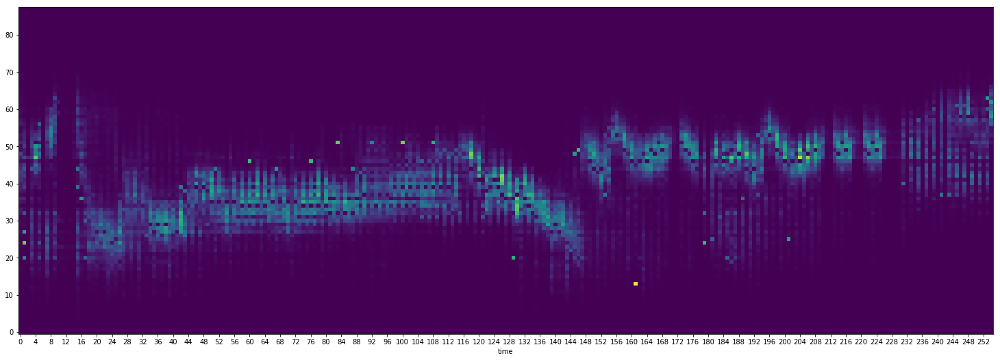

0.109142  mean for last:  0.110243


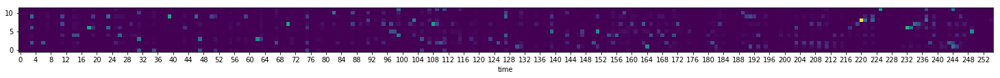

0.106682  mean for last:  0.108639


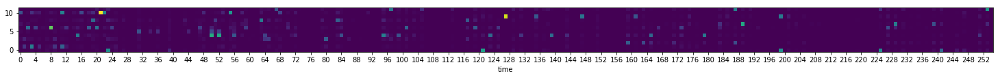

0.112557  mean for last:  0.108622


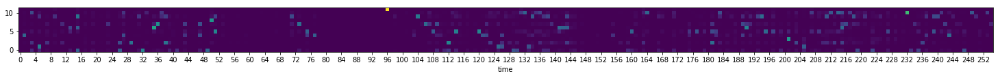

0.106452  mean for last:  0.109401


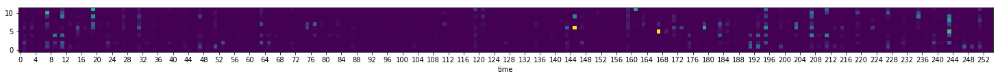

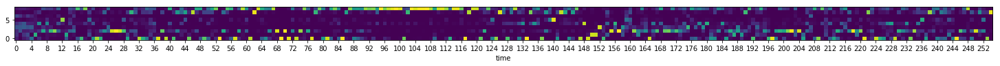

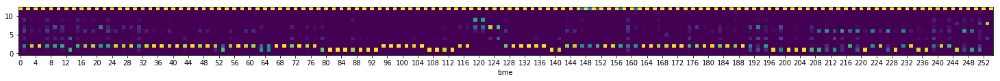

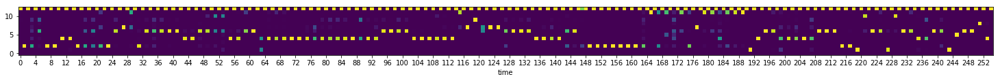

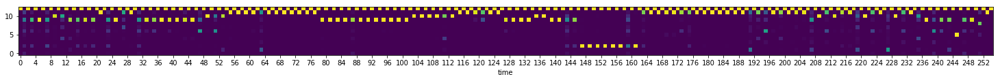

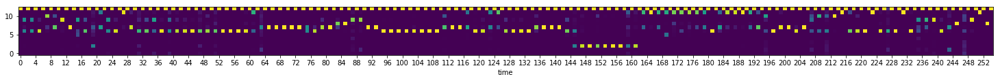

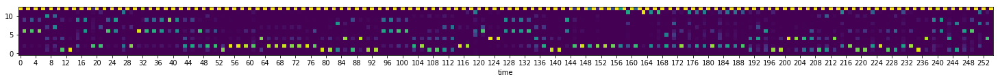

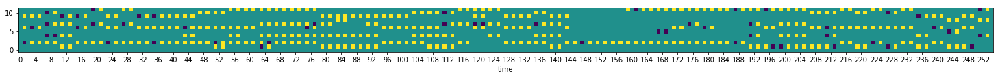

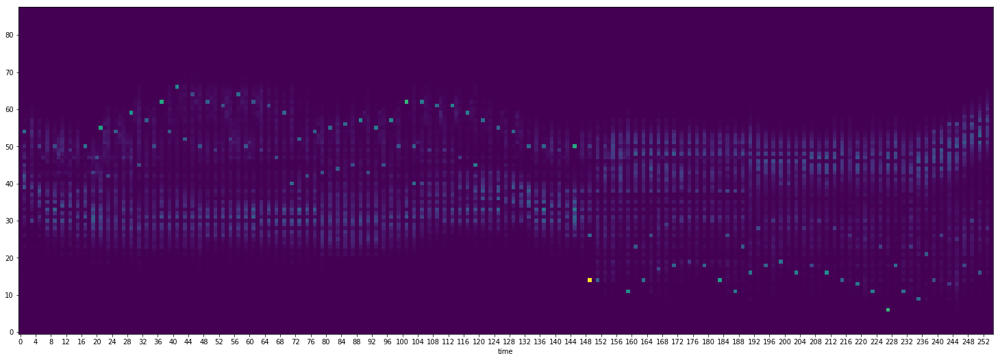

0.111917  mean for last:  0.109177


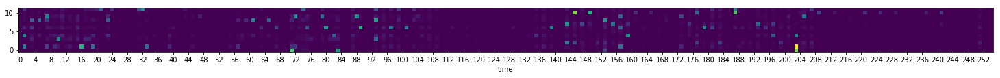

0.104567  mean for last:  0.108594


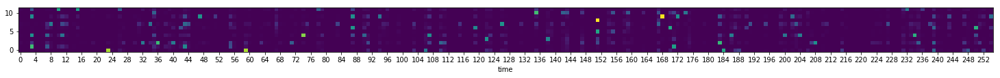

0.110206  mean for last:  0.107321


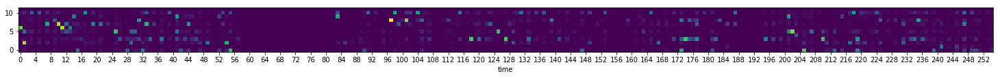

0.108698  mean for last:  0.108676


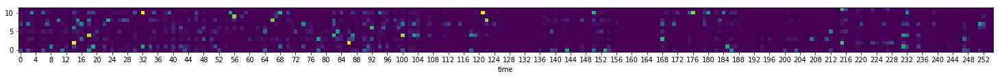

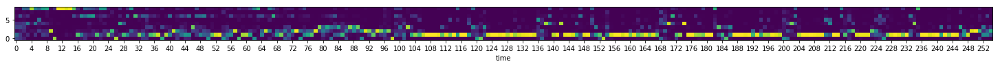

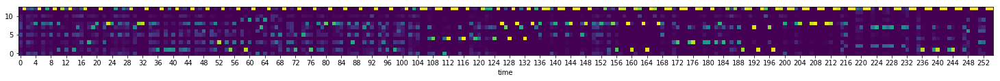

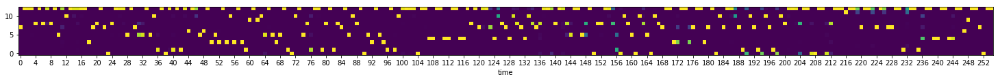

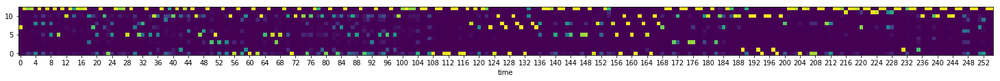

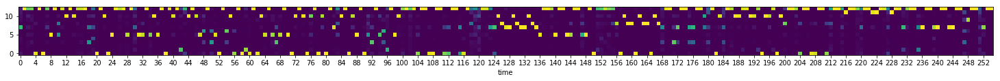

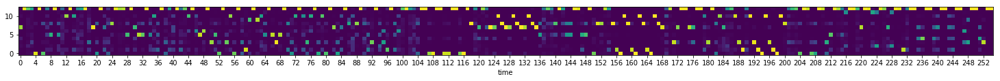

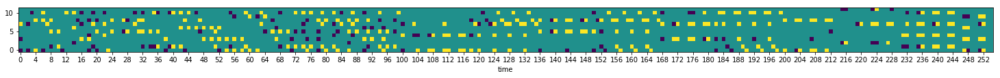

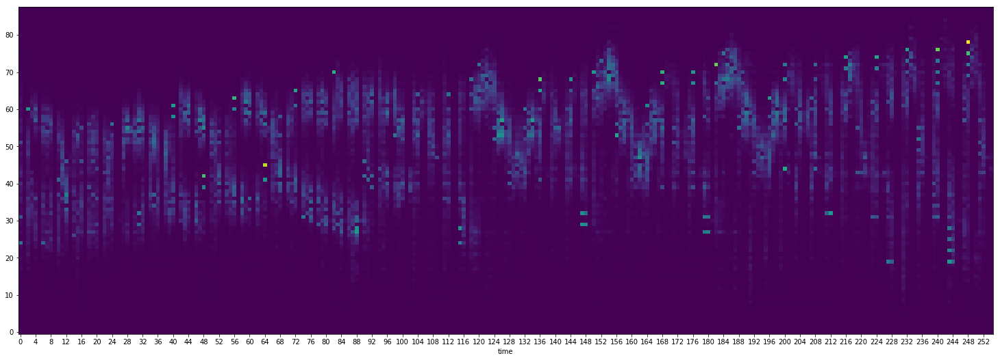

0.108871  mean for last:  0.107866


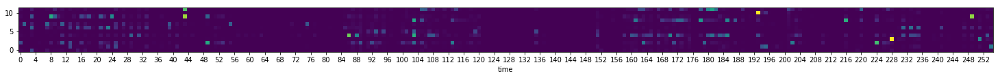

0.113436  mean for last:  0.109068


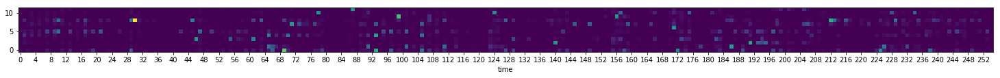

0.10892  mean for last:  0.108994


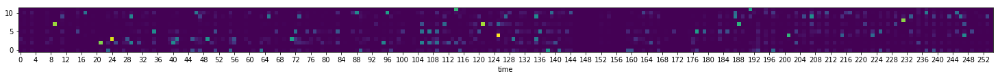

0.107637  mean for last:  0.108036


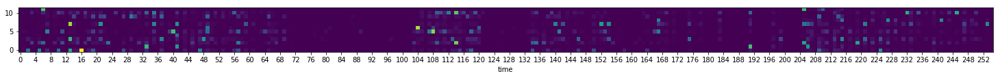

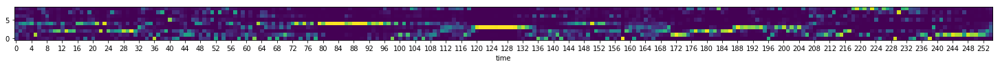

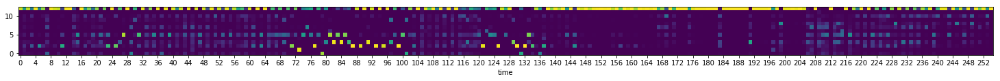

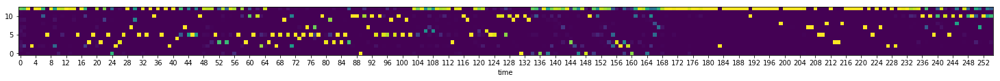

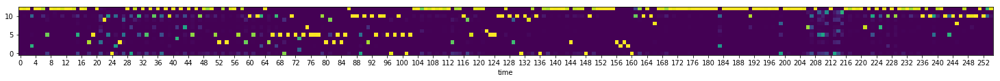

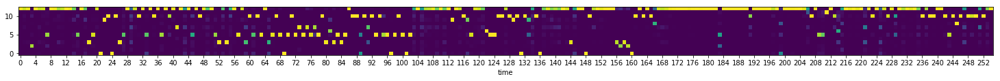

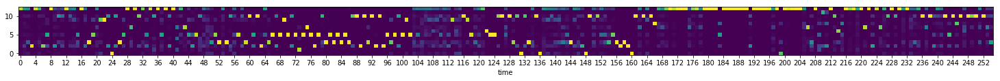

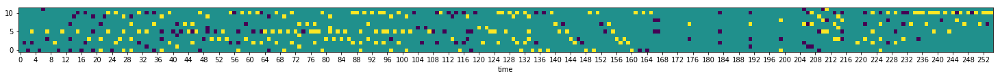

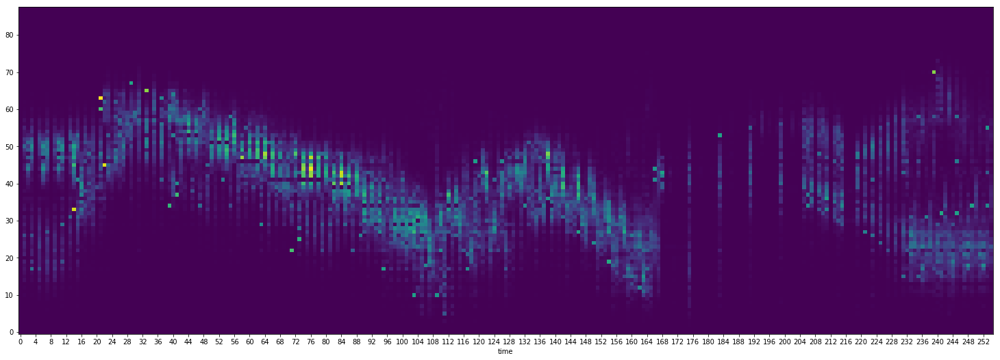

0.108639  mean for last:  0.108395


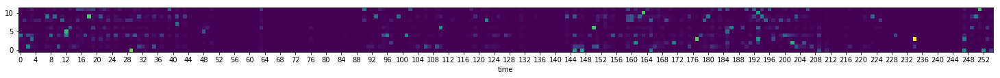

0.107228  mean for last:  0.1086


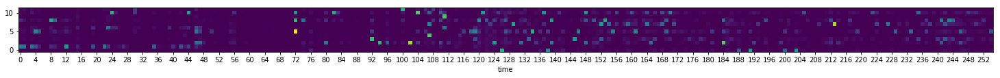

0.109763  mean for last:  0.109667


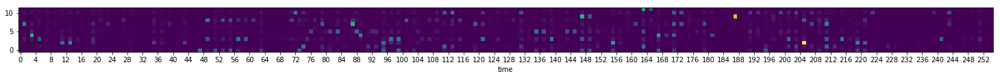

0.110608  mean for last:  0.108456


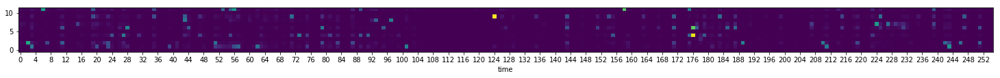

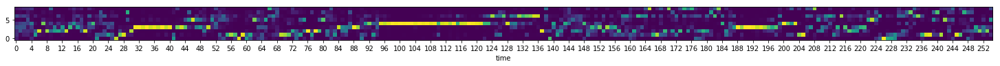

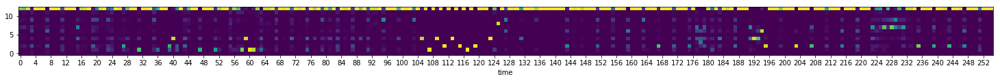

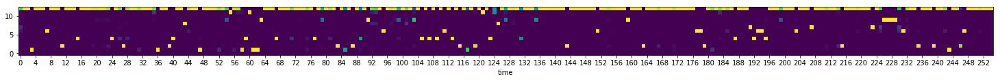

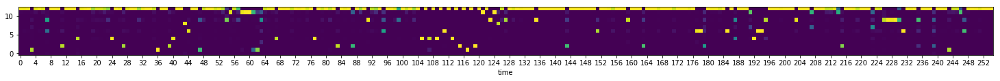

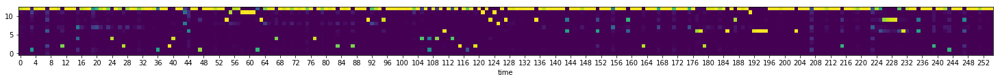

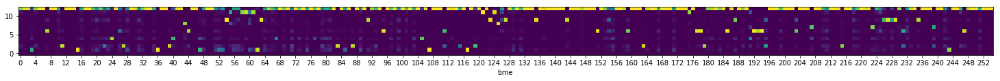

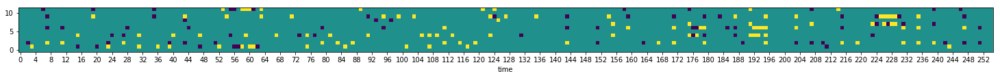

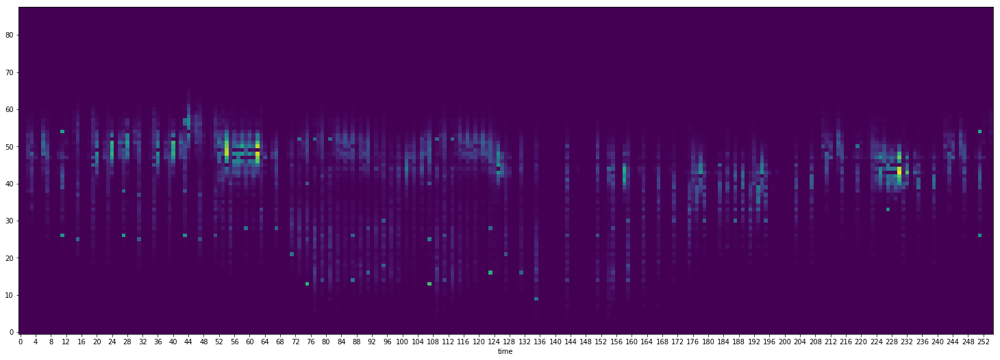

0.100922  mean for last:  0.108156


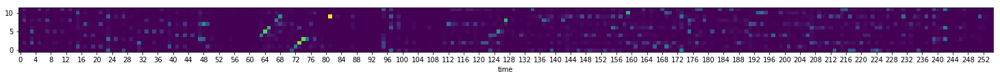

0.10401  mean for last:  0.107739


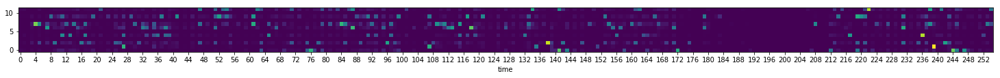

0.11491  mean for last:  0.108751


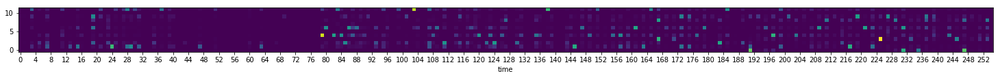

0.102575  mean for last:  0.10831


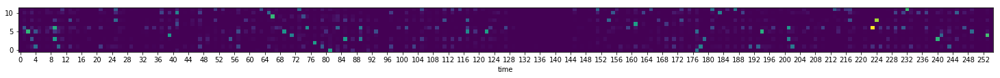

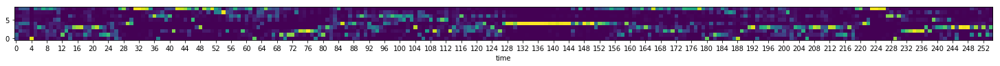

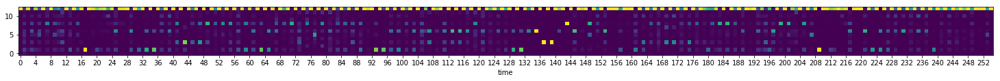

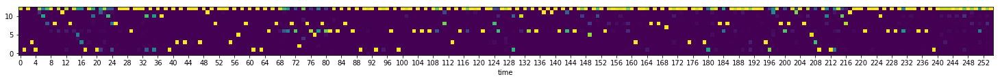

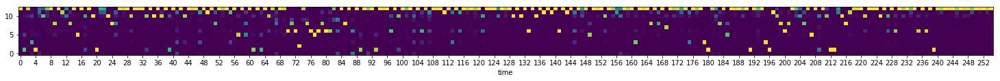

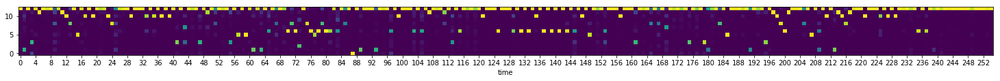

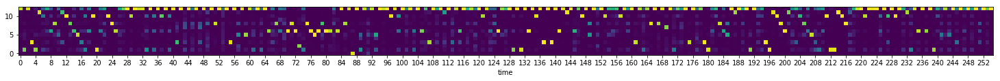

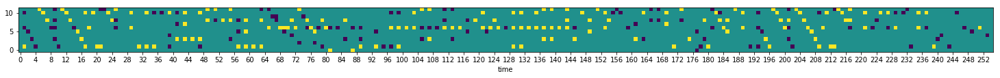

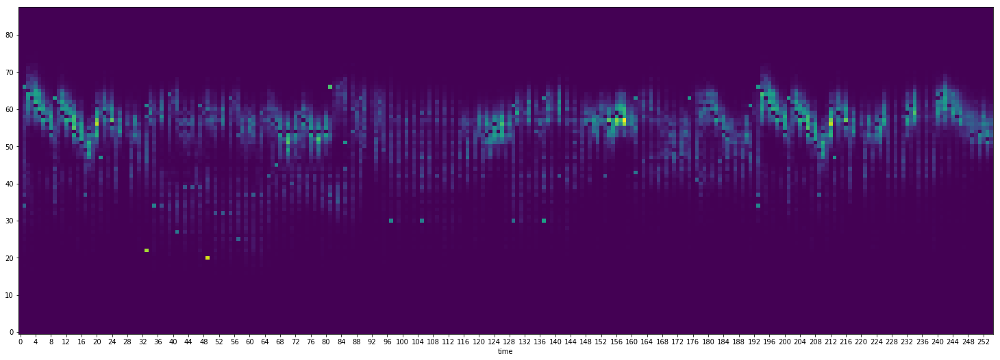

0.111726  mean for last:  0.107841


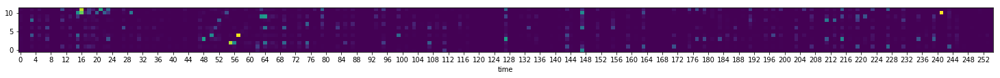

0.104802  mean for last:  0.10749


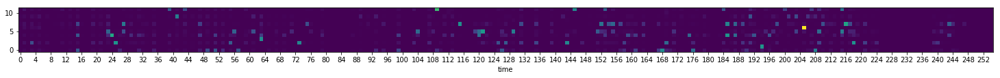

0.111545  mean for last:  0.107561


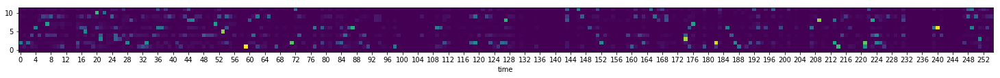

0.107422  mean for last:  0.108533


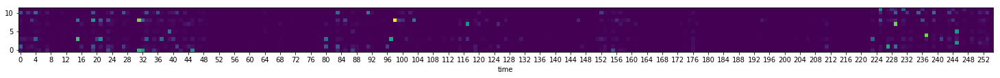

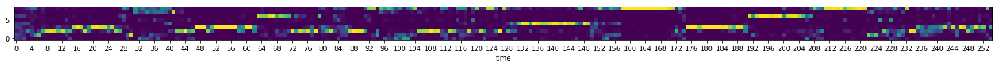

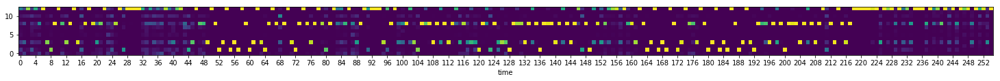

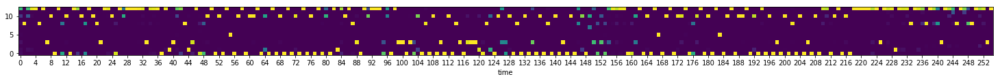

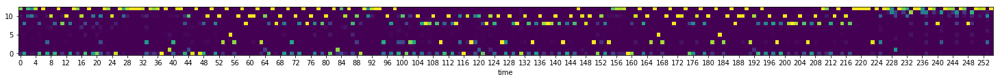

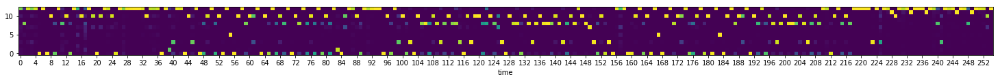

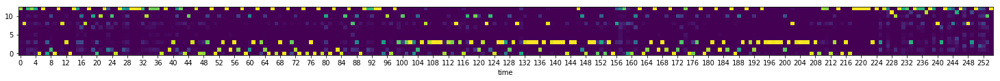

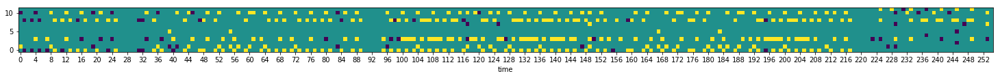

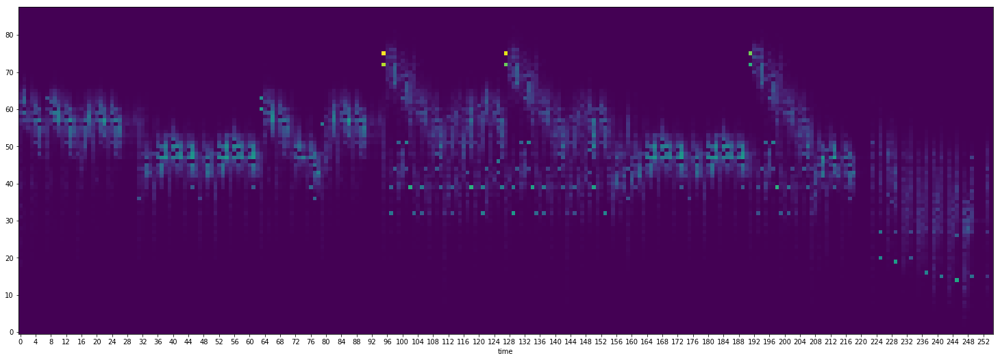

0.112641  mean for last:  0.10796


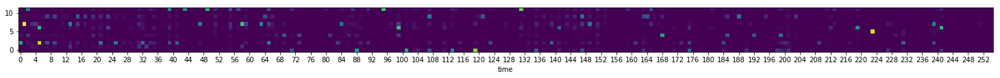

0.110188  mean for last:  0.109251


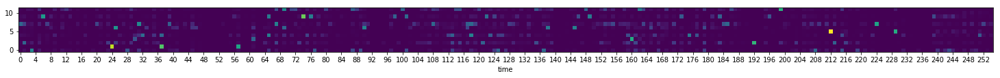

0.107629  mean for last:  0.10755


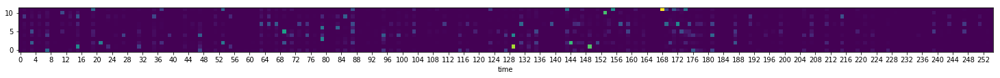

0.103978  mean for last:  0.107122


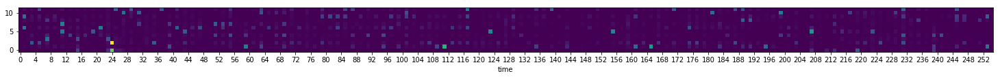

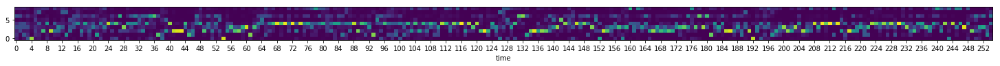

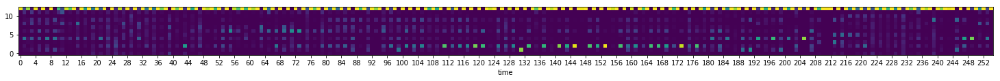

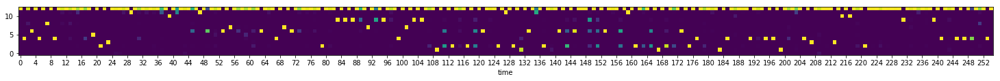

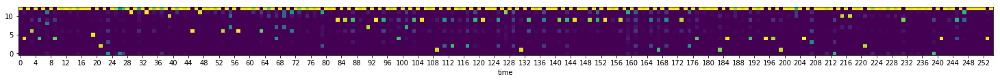

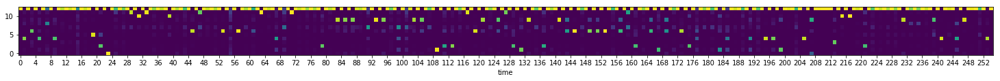

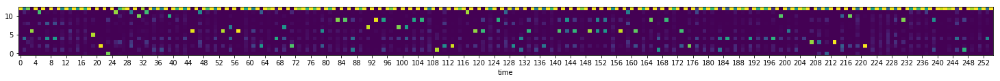

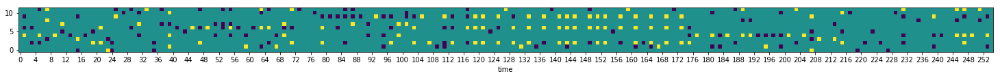

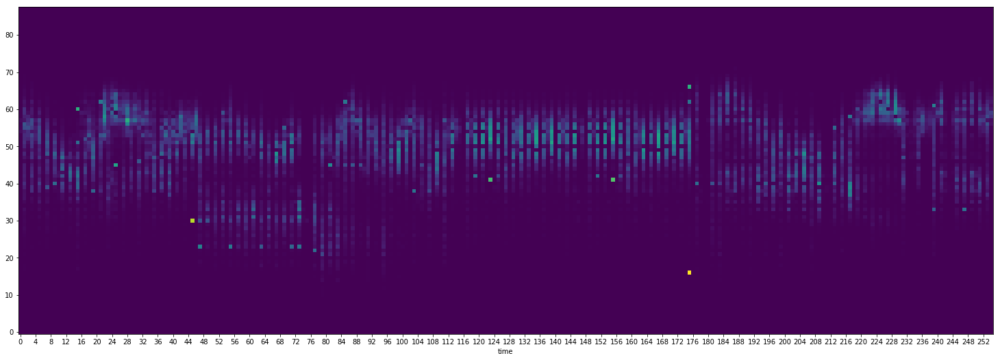

0.111728  mean for last:  0.108099


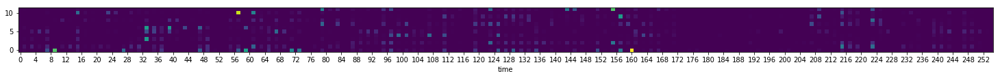

0.114577  mean for last:  0.110722


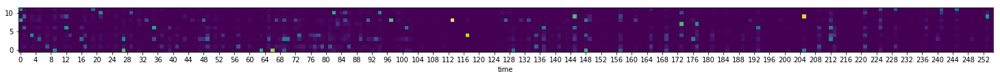

0.100895  mean for last:  0.109017


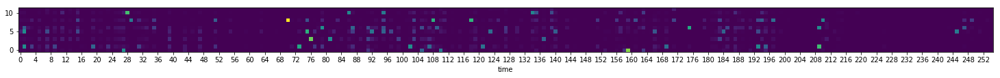

0.108992  mean for last:  0.109266


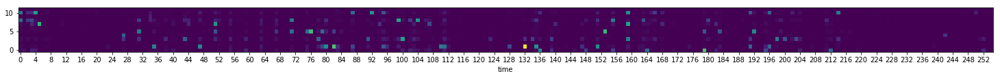

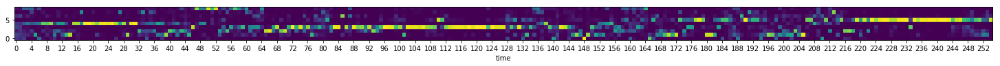

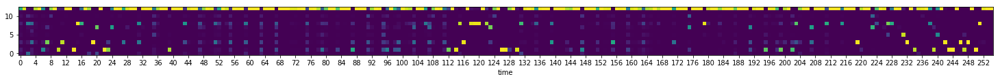

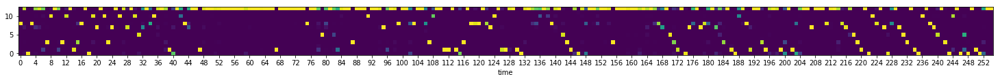

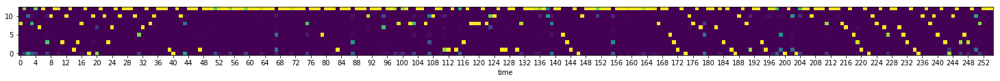

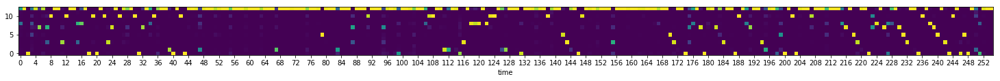

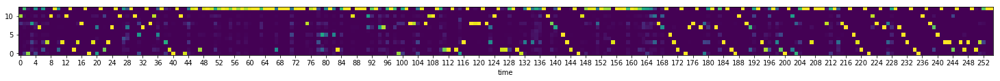

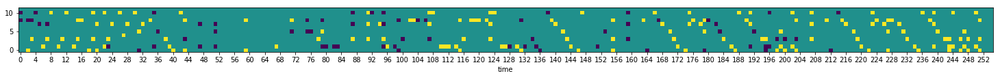

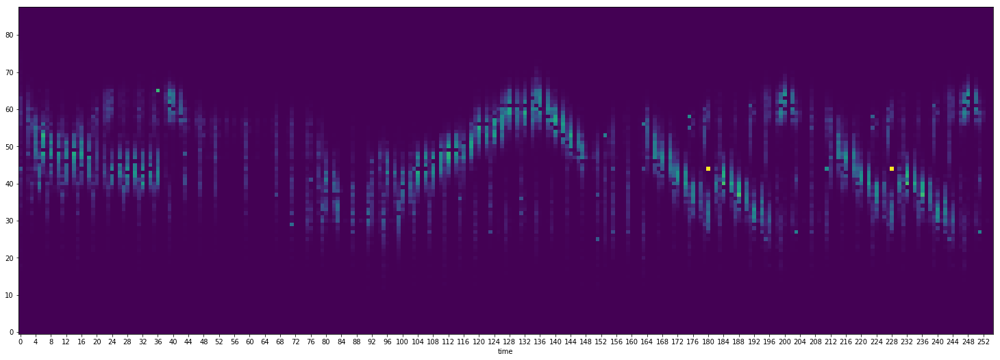

0.116215  mean for last:  0.112422


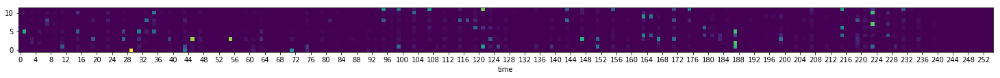

0.11168  mean for last:  0.110269


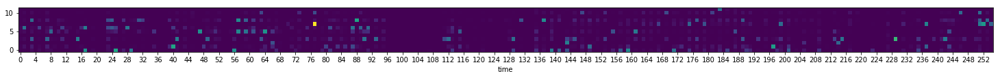

0.105617  mean for last:  0.109736


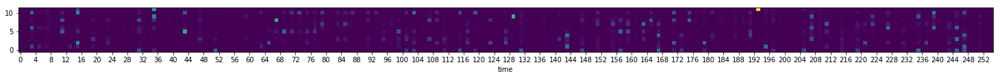

0.105924  mean for last:  0.109636


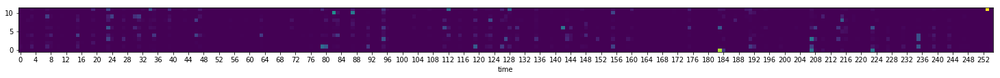

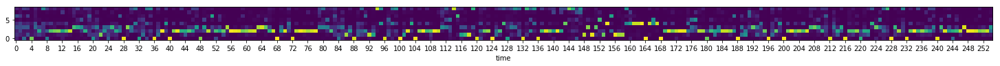

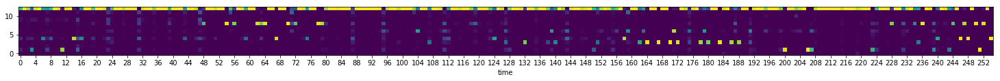

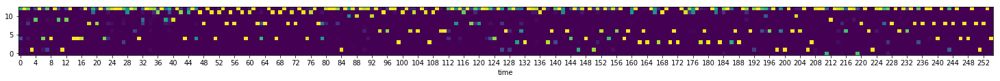

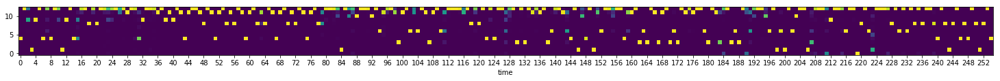

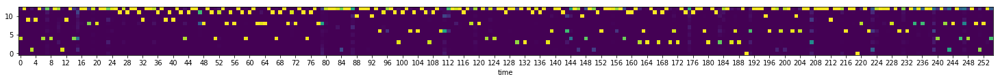

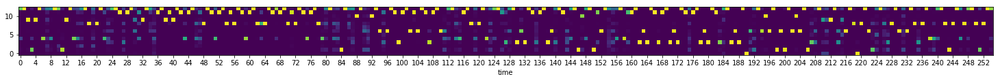

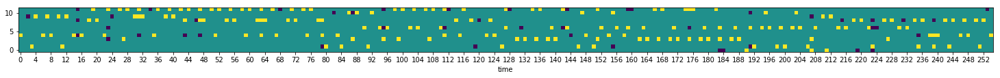

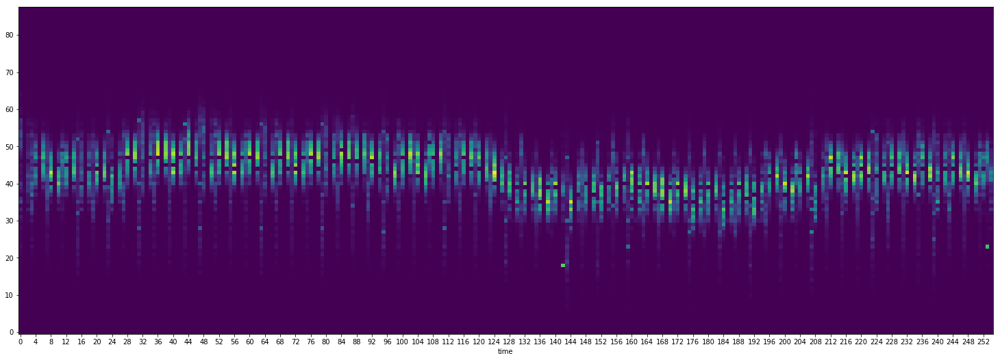

0.107564  mean for last:  0.108385


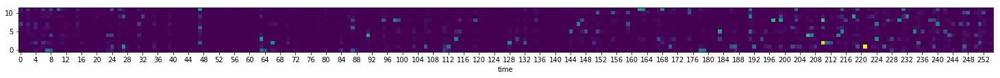

0.10459  mean for last:  0.107576


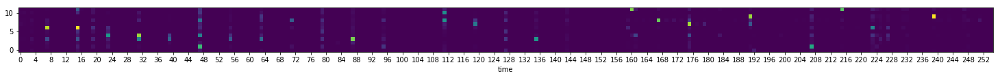

0.110235  mean for last:  0.108438


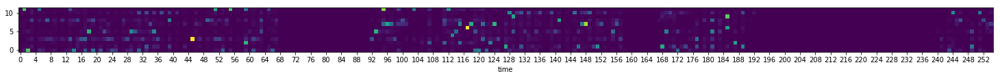

0.108521  mean for last:  0.108542


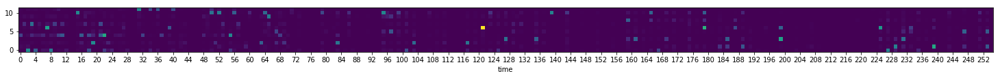

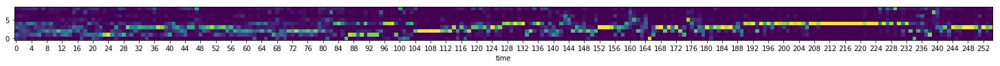

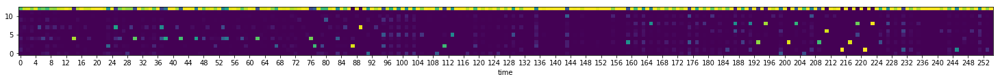

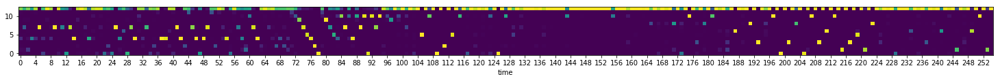

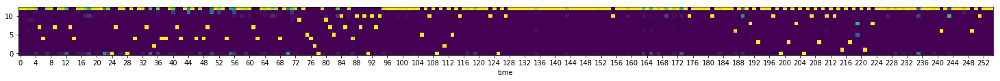

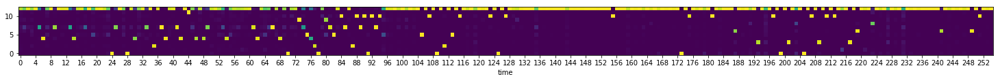

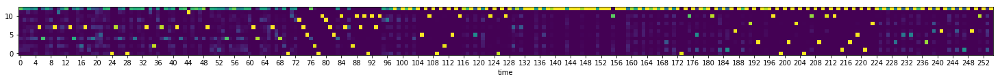

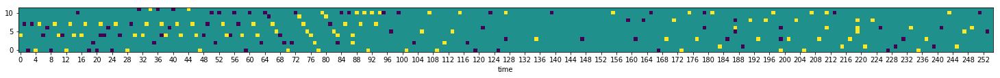

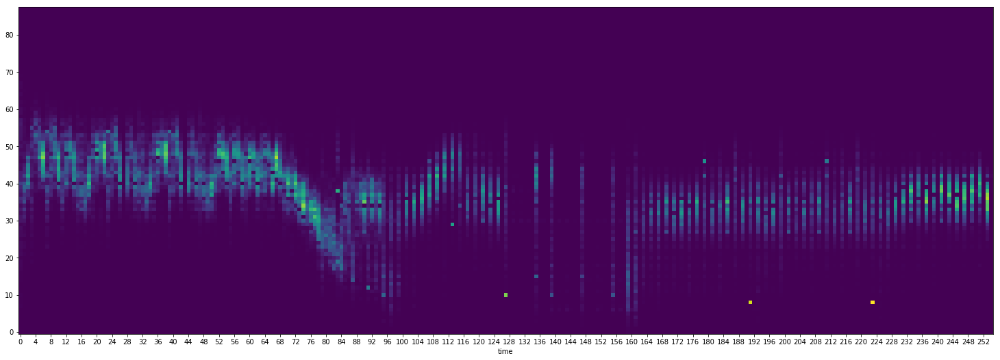

0.111774  mean for last:  0.1081


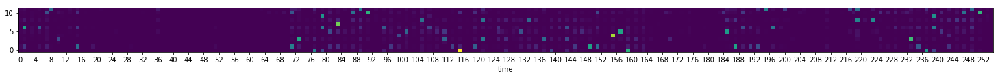

0.106885  mean for last:  0.108615


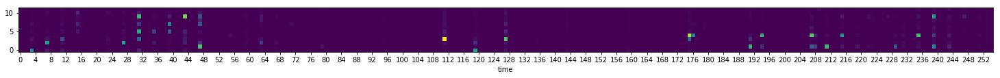

0.112382  mean for last:  0.108204


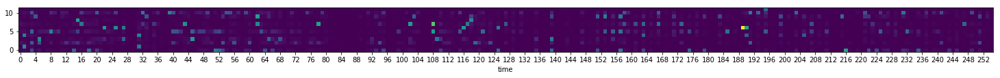

0.0983313  mean for last:  0.107728


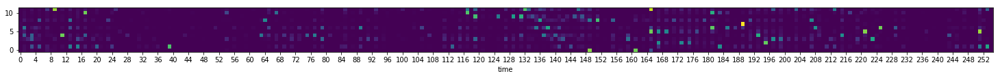

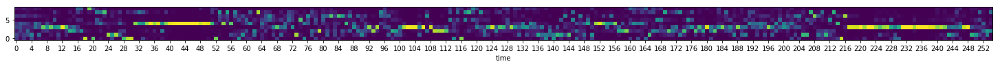

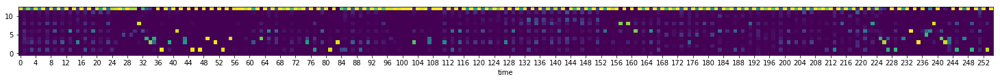

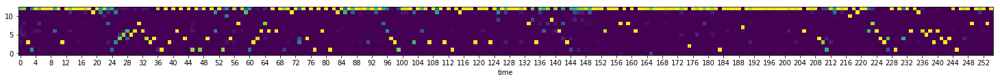

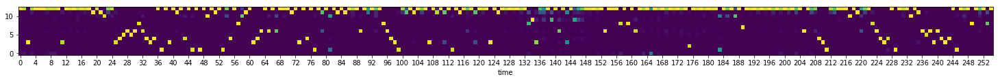

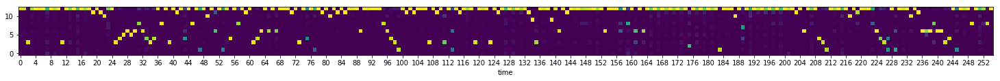

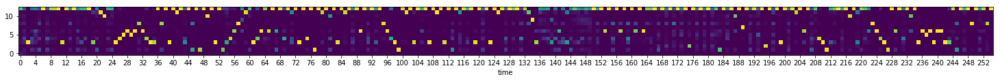

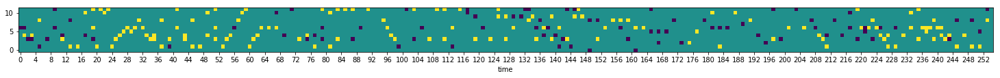

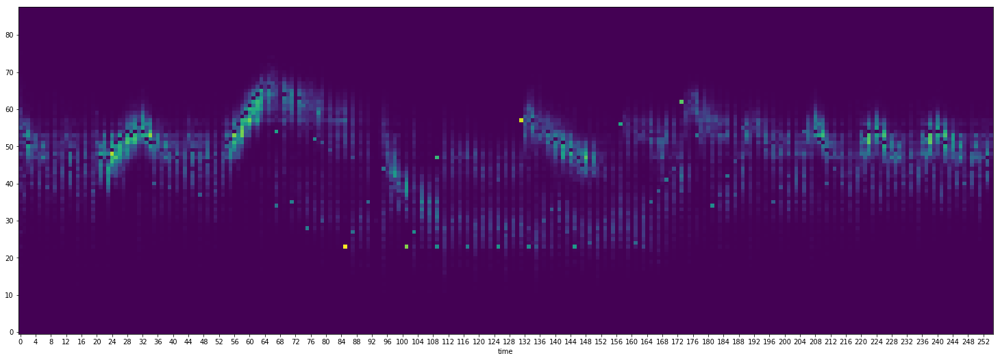

0.107369  mean for last:  0.10664


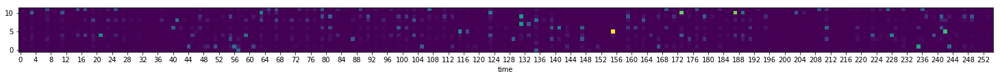

0.102031  mean for last:  0.106997


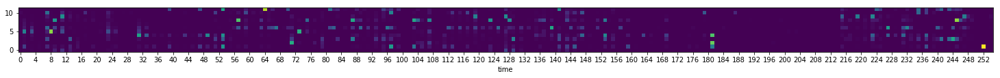

0.107562  mean for last:  0.107954


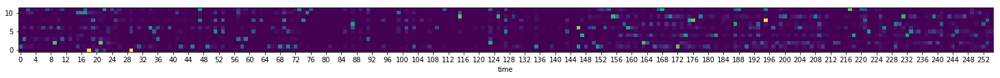

0.106052  mean for last:  0.108233


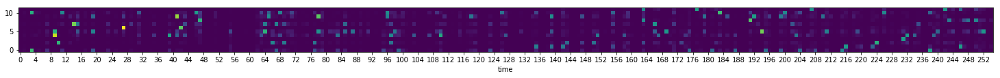

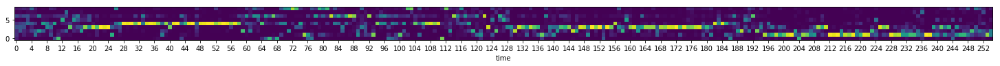

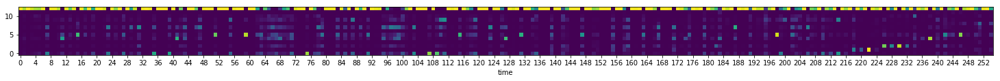

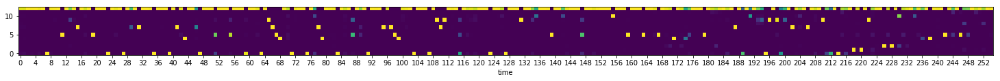

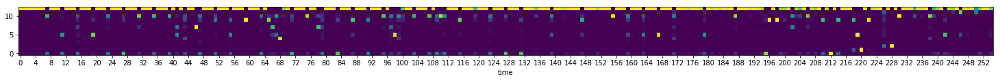

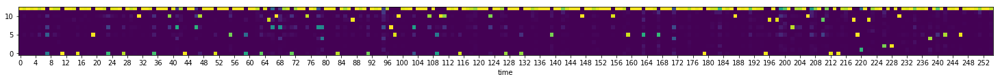

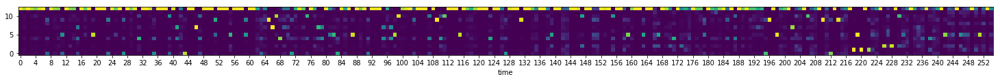

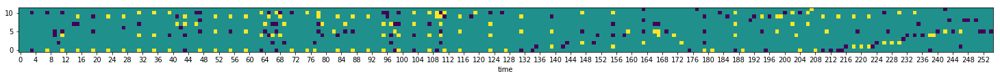

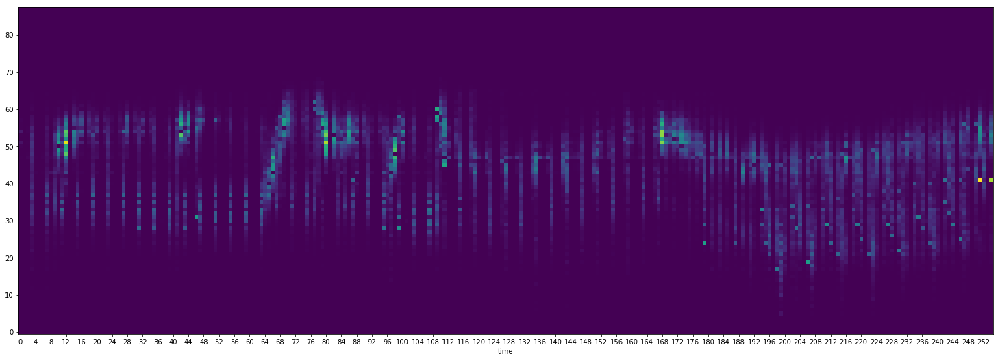

0.109366  mean for last:  0.10698


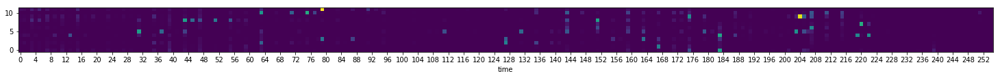

0.107645  mean for last:  0.106405


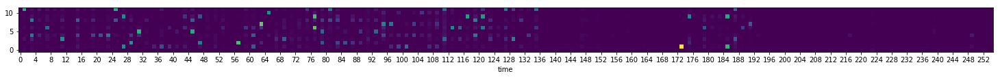

0.105866  mean for last:  0.107869


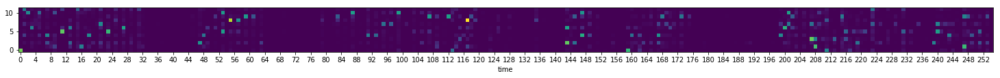

0.108719  mean for last:  0.108044


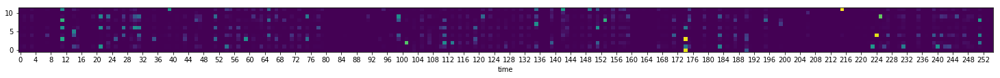

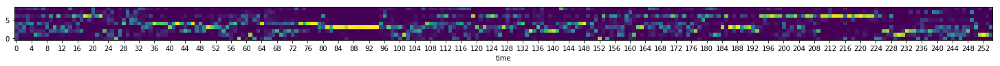

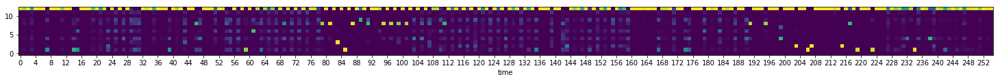

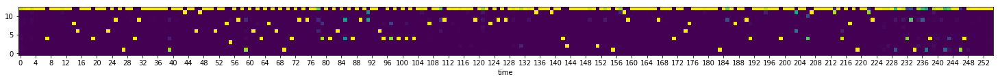

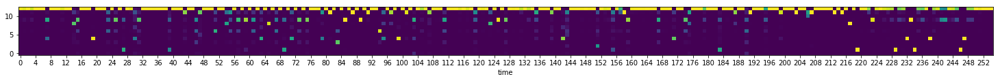

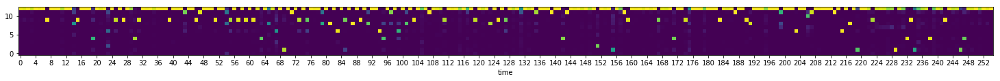

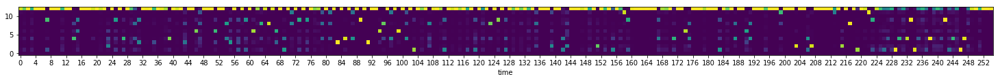

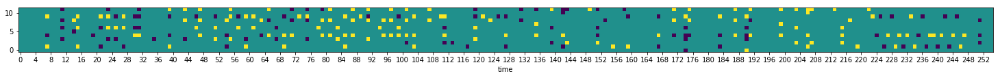

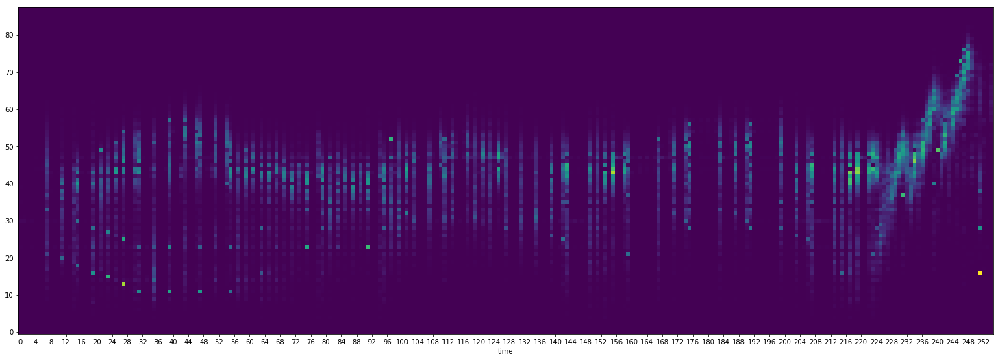

0.0979135  mean for last:  0.107237


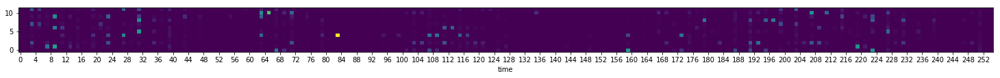

0.106876  mean for last:  0.107667


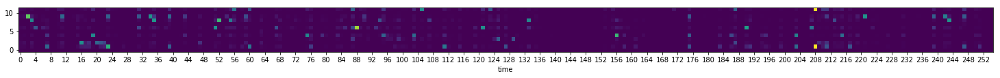

0.102123  mean for last:  0.107112


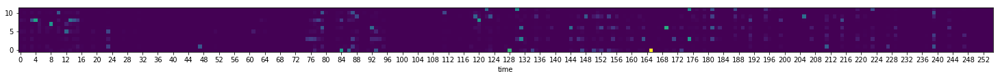

0.109041  mean for last:  0.106749


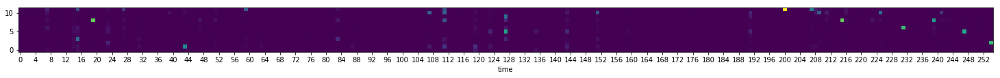

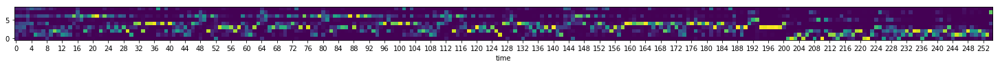

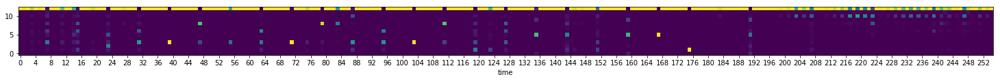

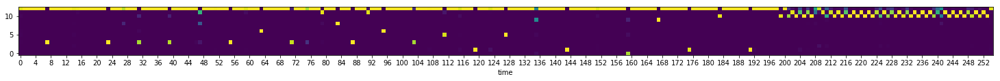

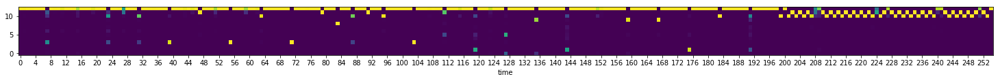

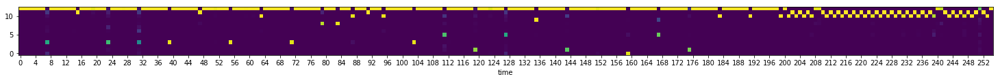

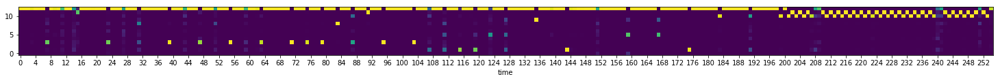

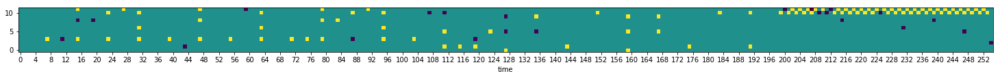

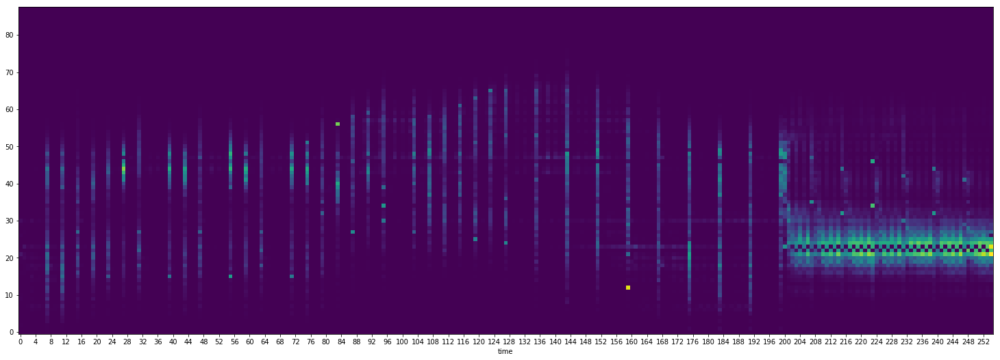

0.108731  mean for last:  0.107398


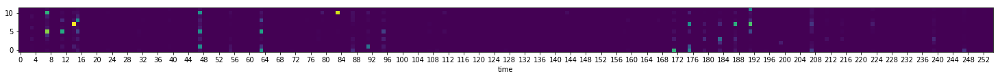

0.105313  mean for last:  0.1066


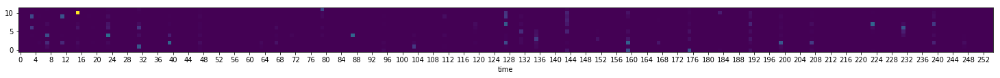

0.109306  mean for last:  0.107642


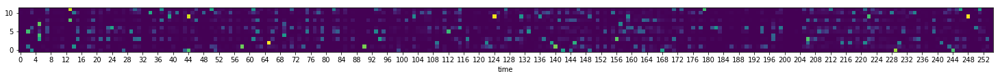

0.101864  mean for last:  0.107009


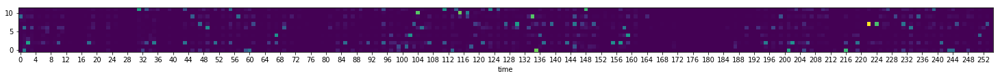

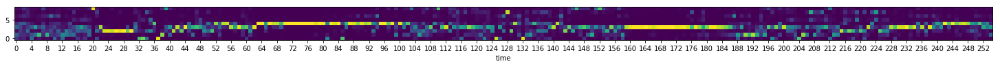

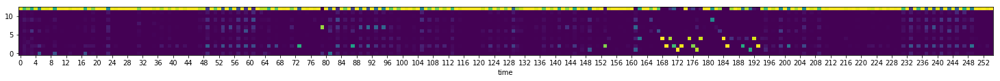

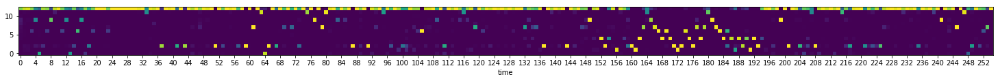

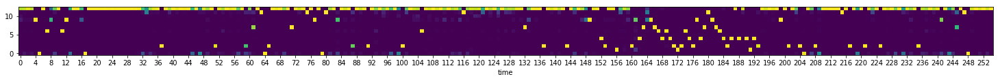

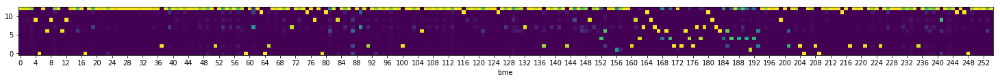

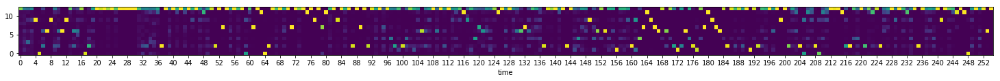

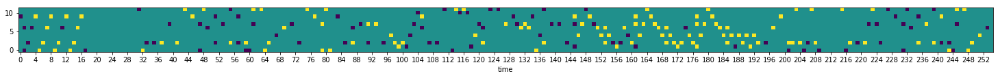

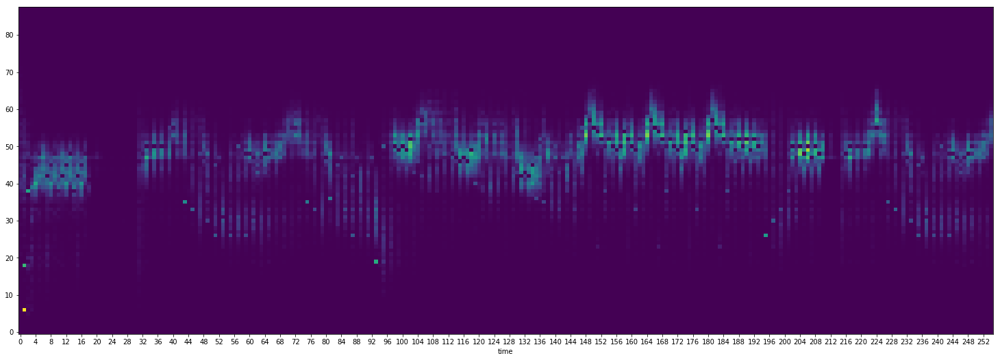

0.105283  mean for last:  0.107317


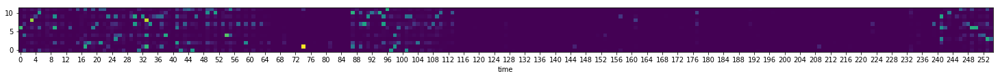

0.104543  mean for last:  0.106416


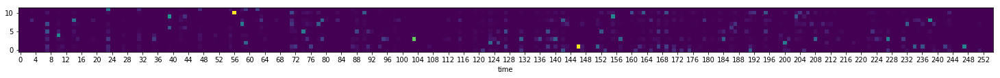

0.102815  mean for last:  0.107158


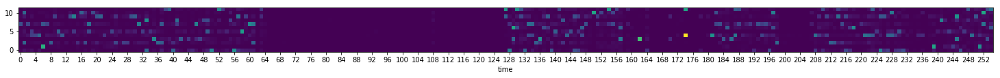

0.104626  mean for last:  0.10634


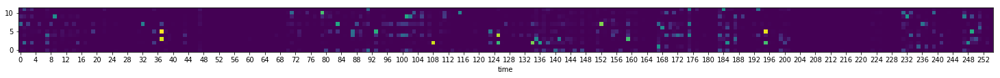

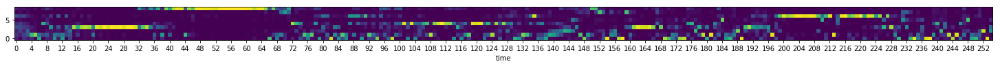

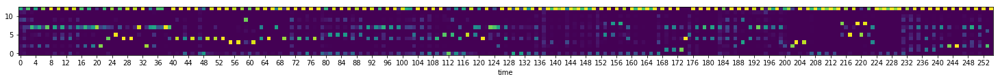

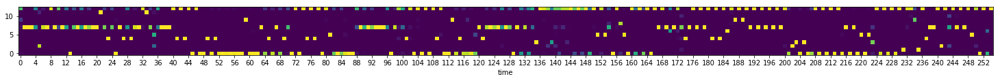

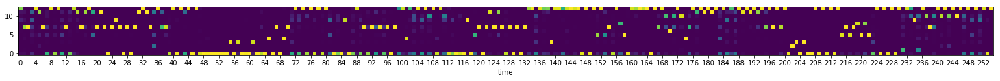

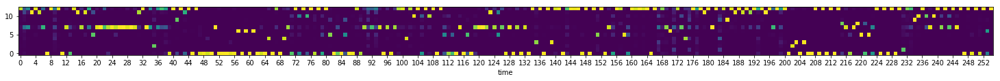

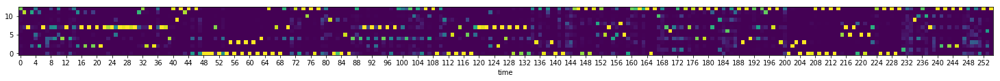

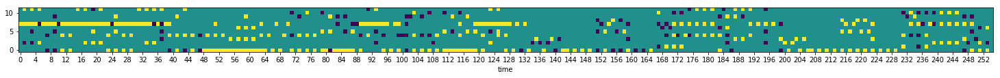

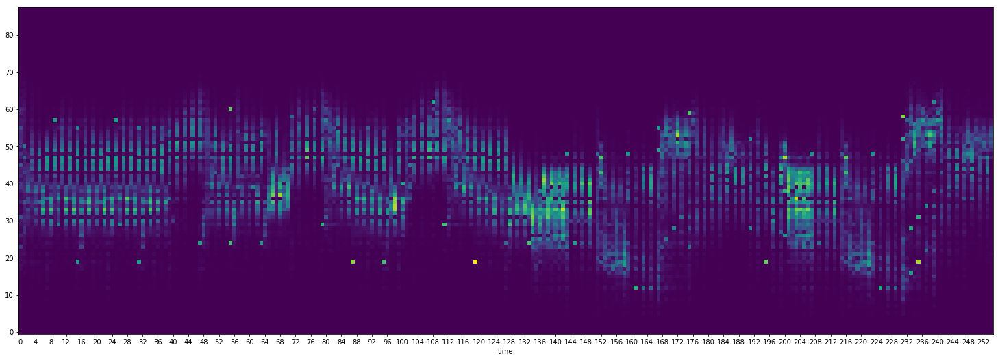

0.117397  mean for last:  0.108987


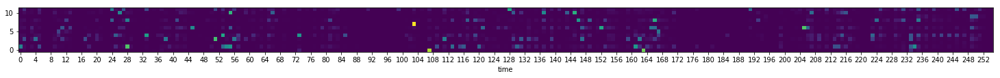

0.103787  mean for last:  0.109322


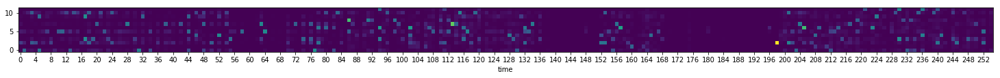

0.107764  mean for last:  0.108256


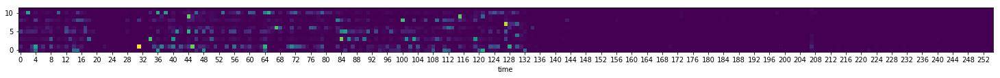

0.119662  mean for last:  0.118052


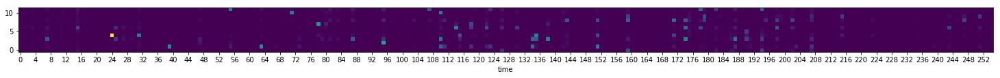

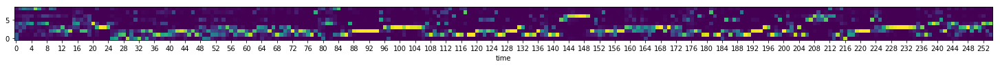

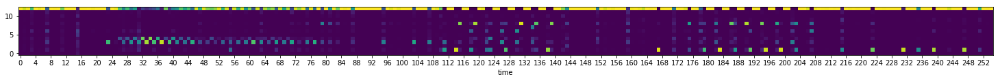

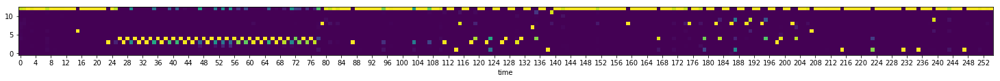

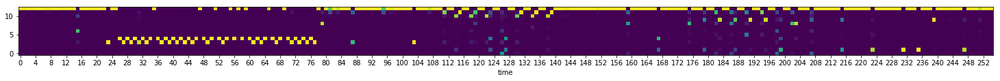

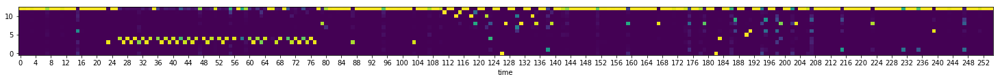

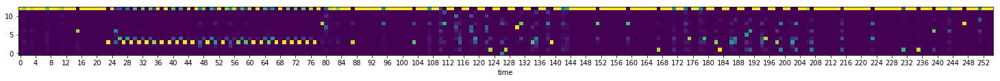

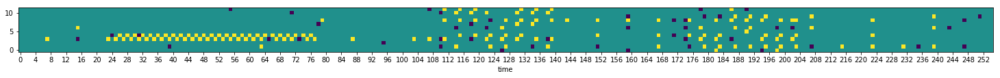

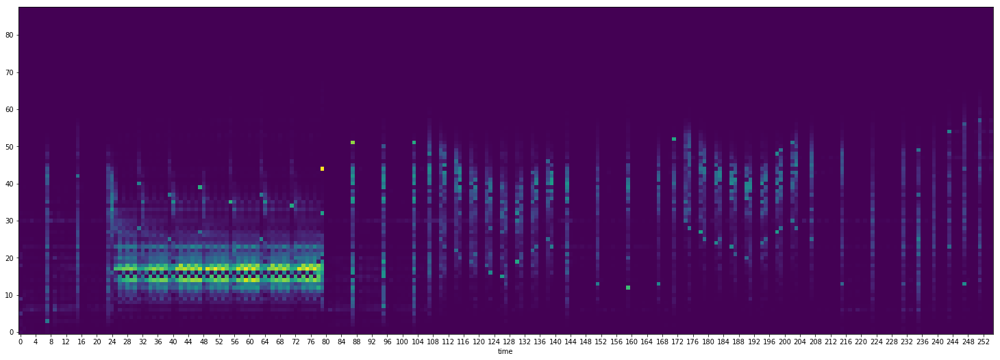

0.121786  mean for last:  0.11278


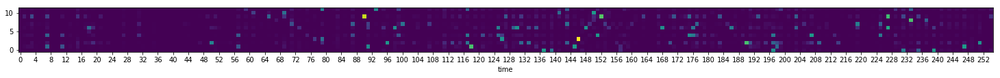

0.107055  mean for last:  0.1127


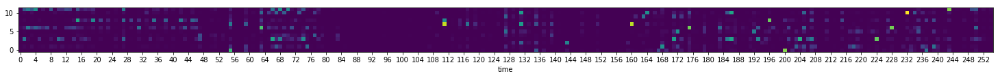

0.106692  mean for last:  0.108924


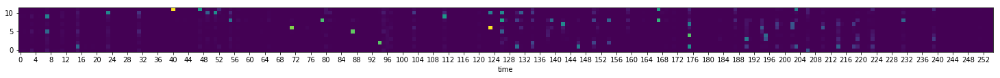

0.10633  mean for last:  0.108376


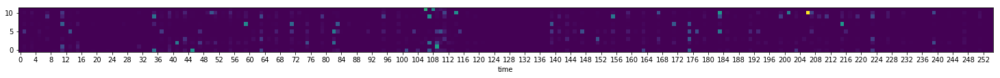

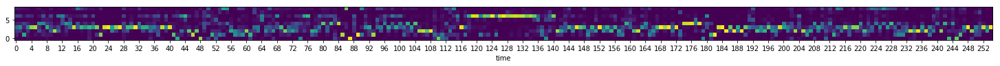

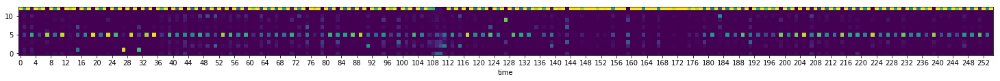

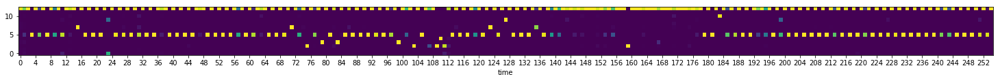

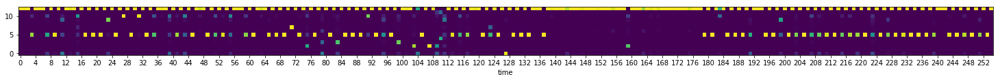

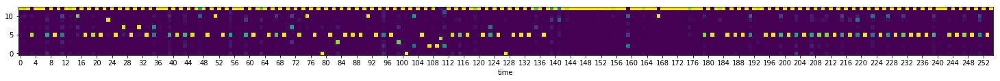

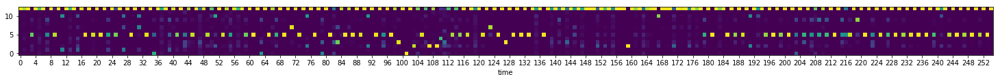

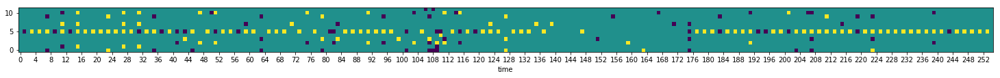

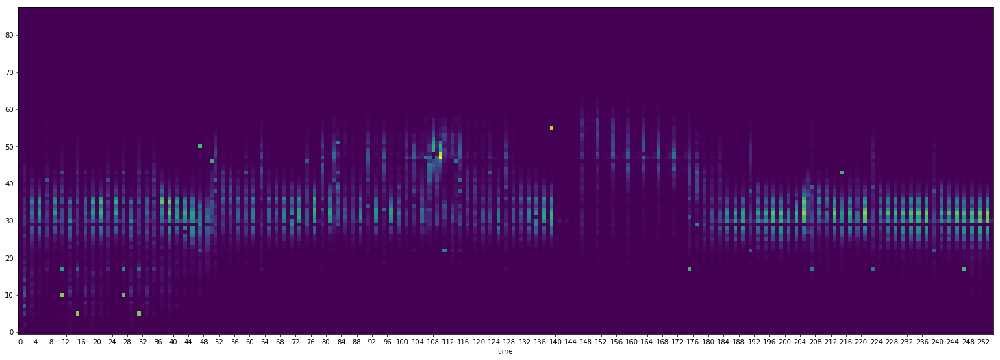

0.105389  mean for last:  0.107785


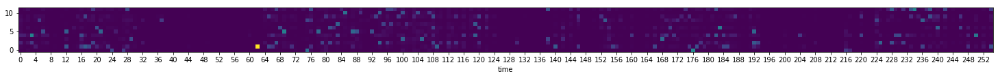

0.106136  mean for last:  0.107529


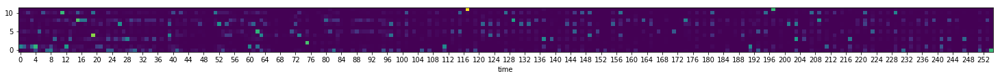

0.111445  mean for last:  0.108193


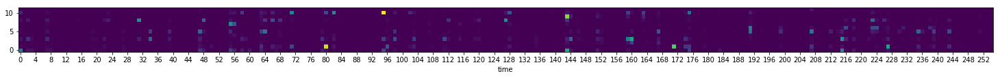

0.110794  mean for last:  0.107126


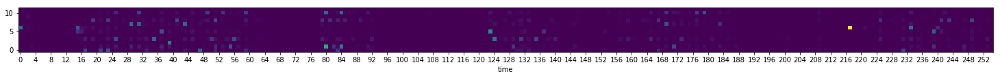

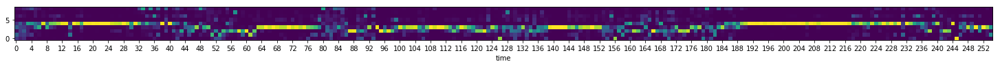

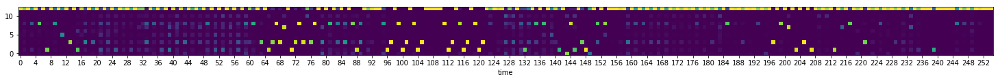

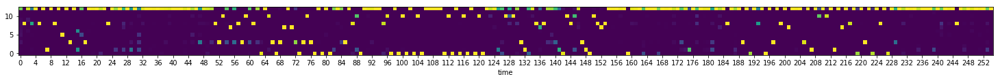

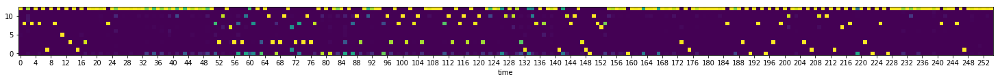

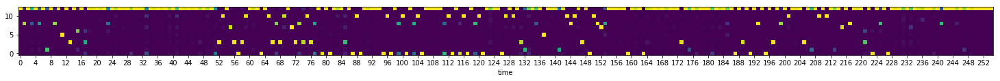

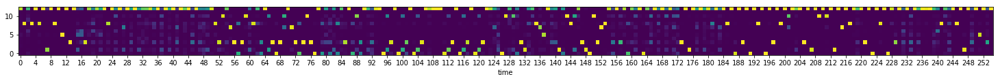

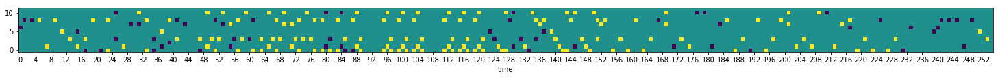

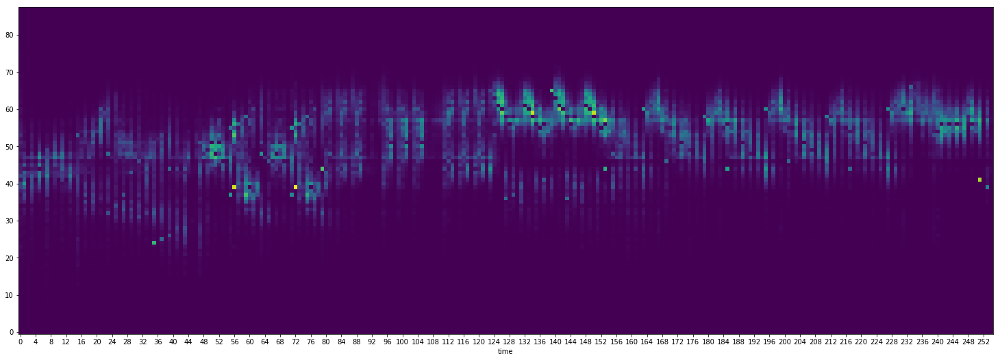

0.107944  mean for last:  0.107963


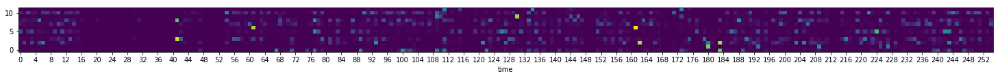

0.107854  mean for last:  0.108272


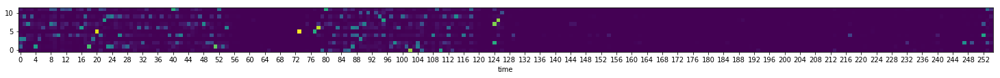

0.104952  mean for last:  0.106788


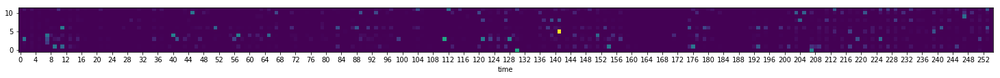

0.103048  mean for last:  0.107639


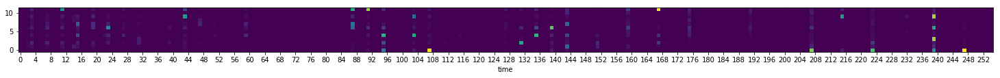

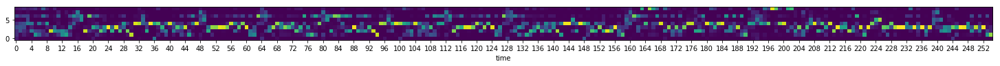

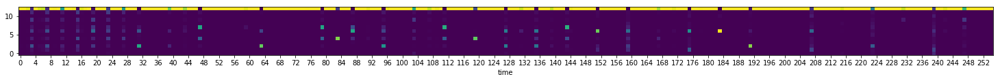

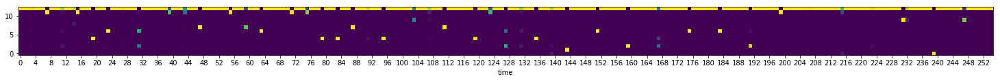

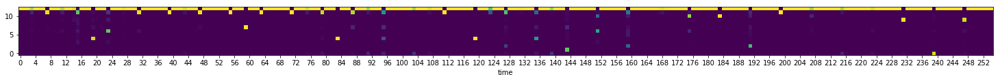

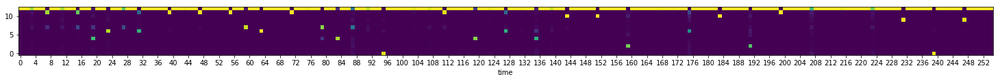

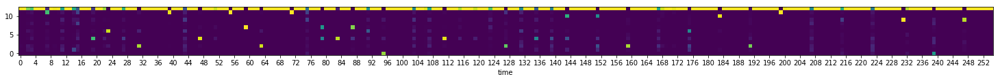

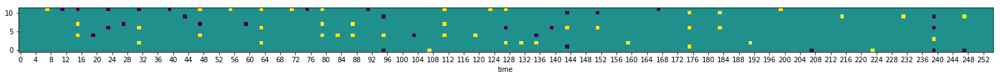

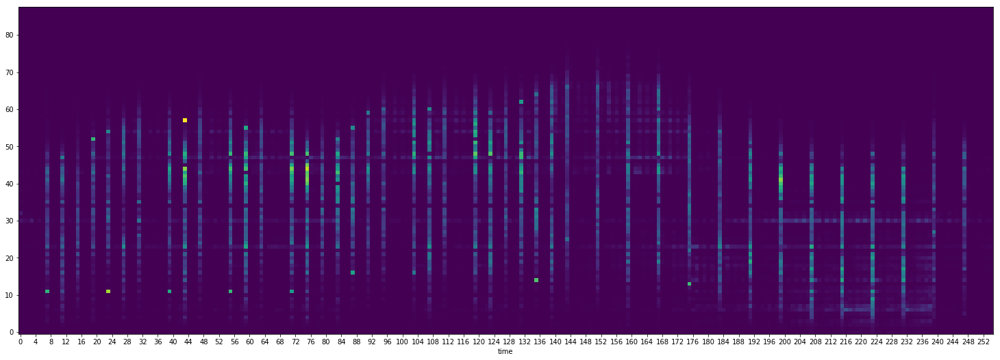

0.108834  mean for last:  0.107492


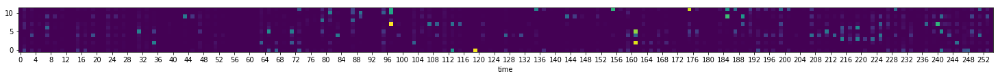

0.109269  mean for last:  0.107229


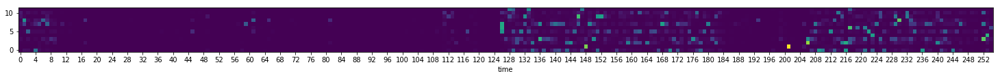

0.0988642  mean for last:  0.106362


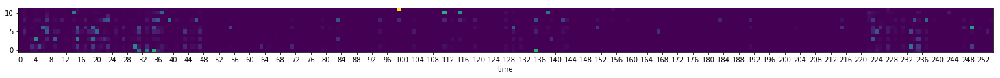

0.105095  mean for last:  0.106229


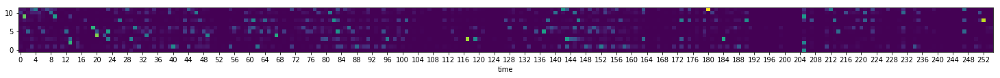

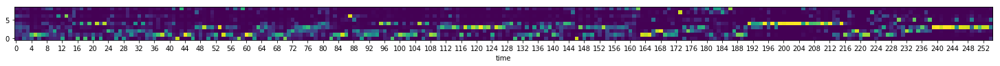

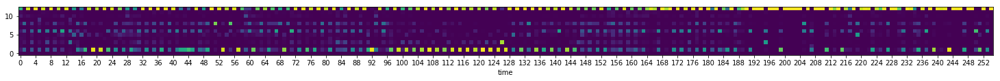

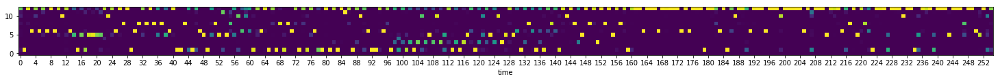

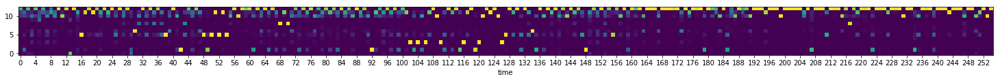

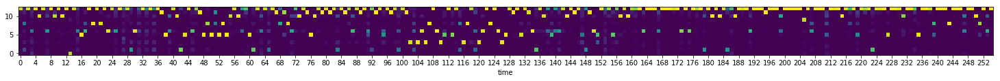

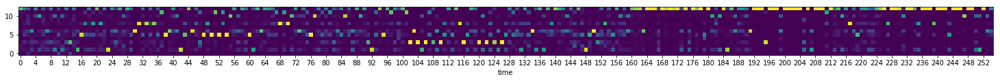

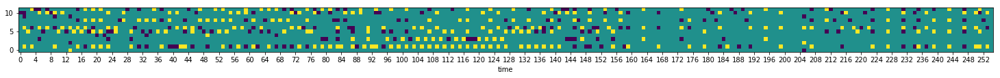

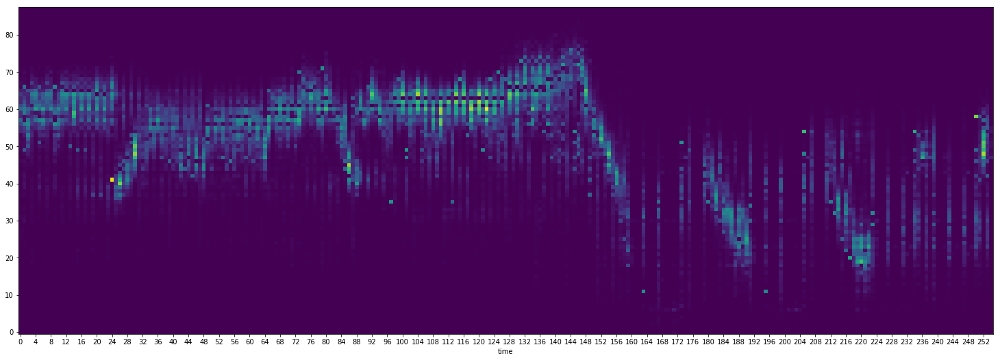

0.111623  mean for last:  0.107009


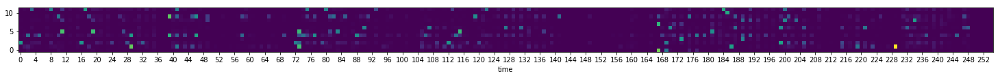

0.108689  mean for last:  0.106371


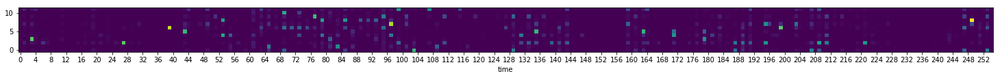

0.0998829  mean for last:  0.106787


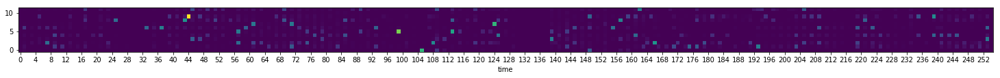

0.104286  mean for last:  0.104995


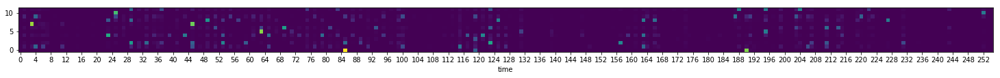

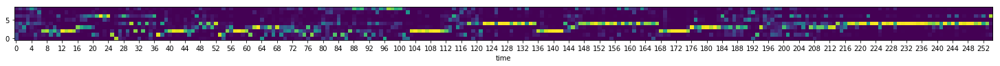

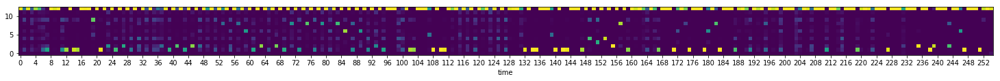

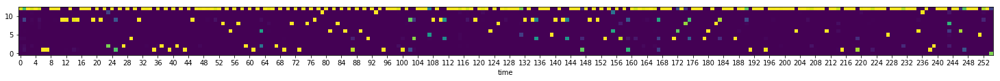

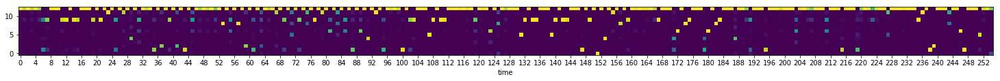

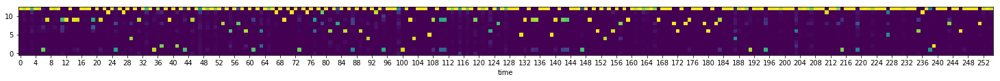

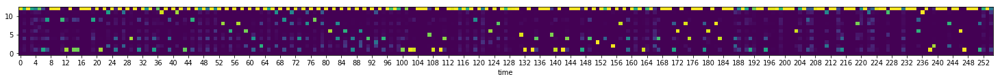

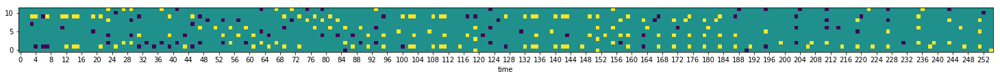

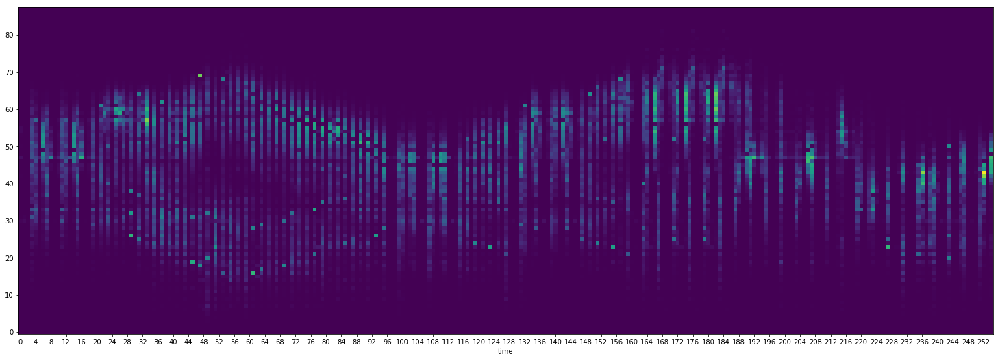

0.106144  mean for last:  0.106701


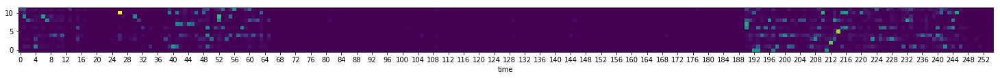

0.101806  mean for last:  0.106463


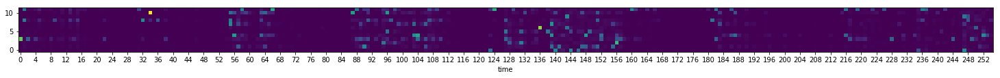

0.10735  mean for last:  0.106869


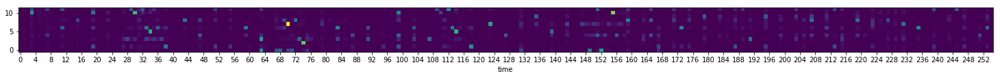

0.108159  mean for last:  0.106037


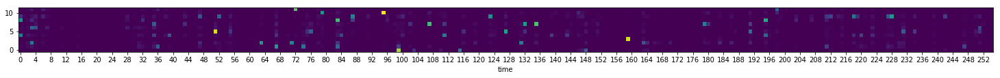

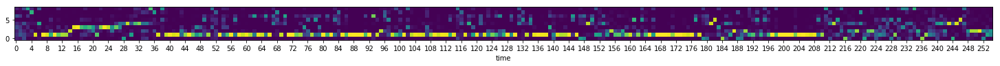

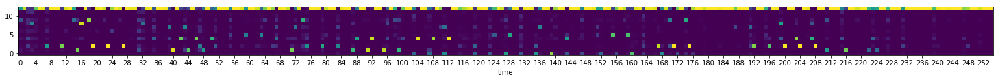

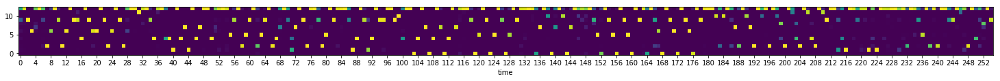

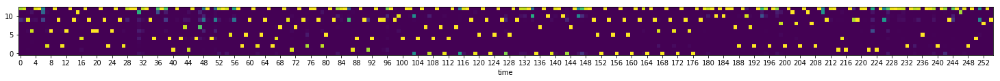

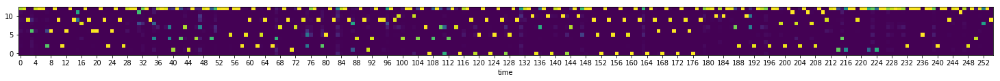

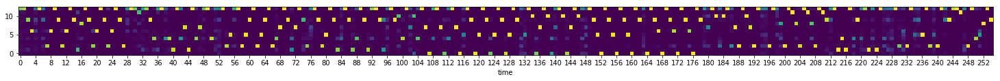

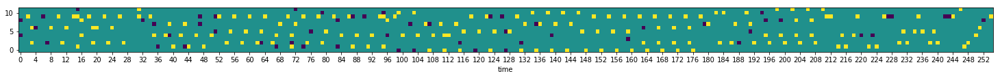

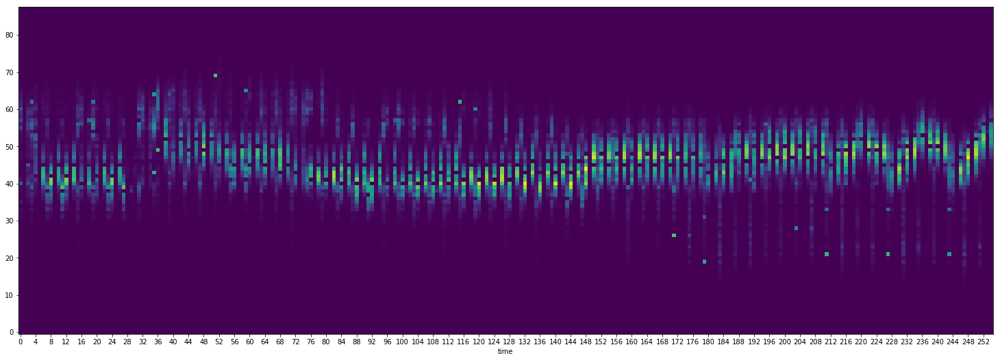

0.108707  mean for last:  0.105853


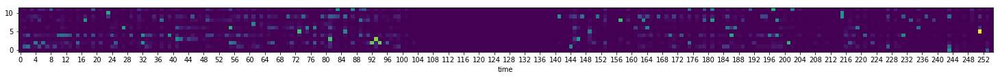

0.112522  mean for last:  0.107726


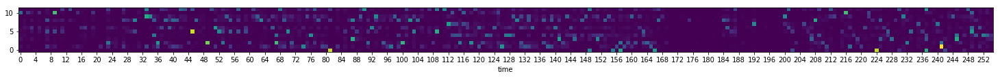

0.103632  mean for last:  0.105981


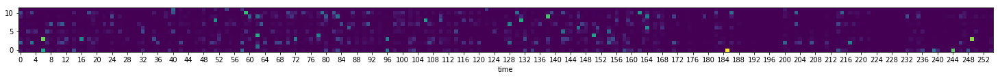

0.111894  mean for last:  0.106944


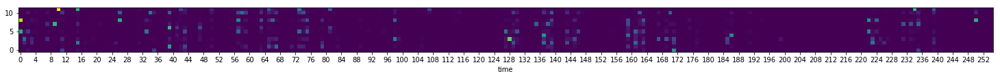

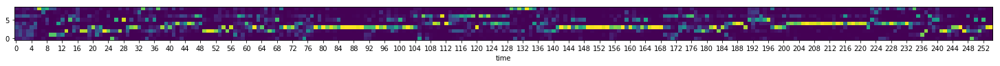

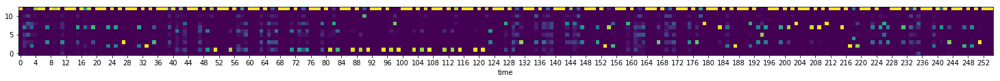

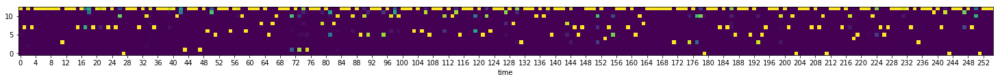

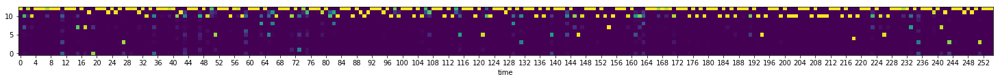

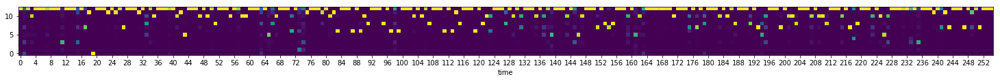

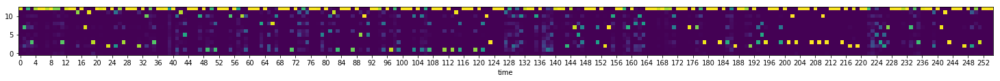

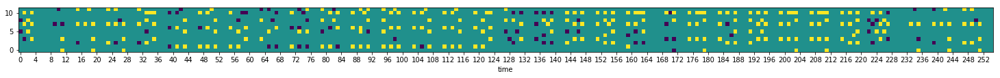

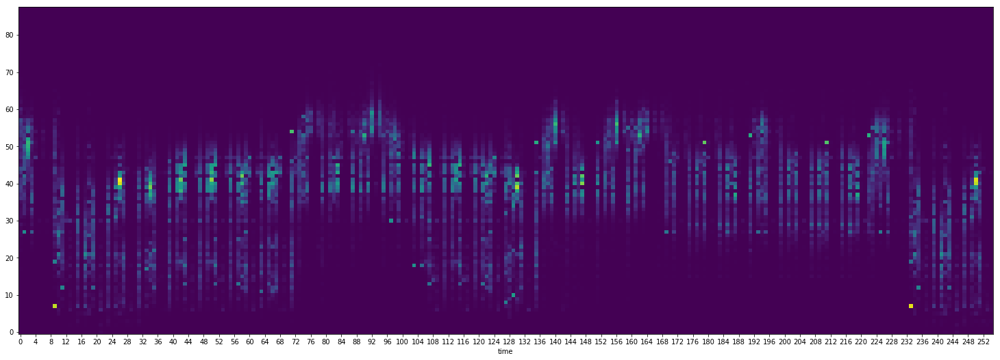

0.107082  mean for last:  0.106707


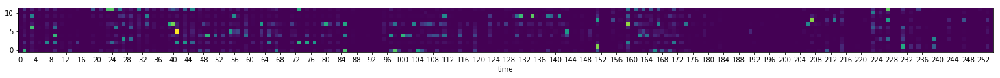

0.108176  mean for last:  0.106392


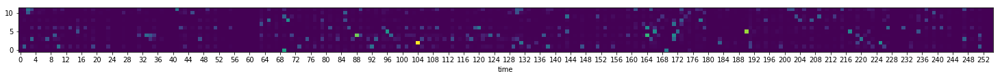

0.107319  mean for last:  0.10598


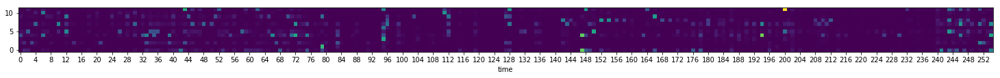

0.104231  mean for last:  0.107433


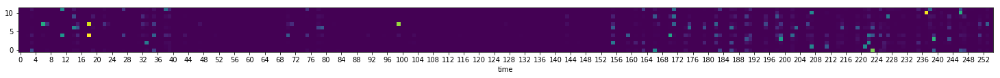

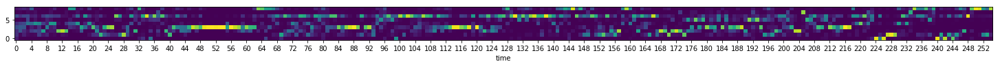

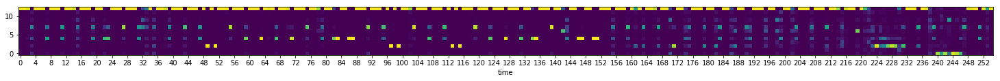

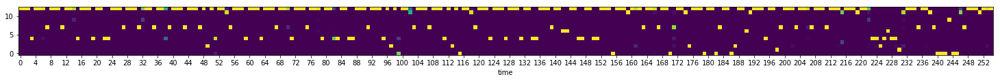

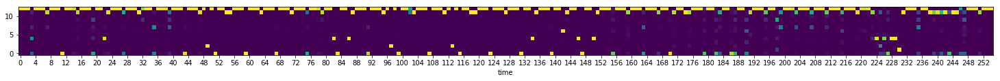

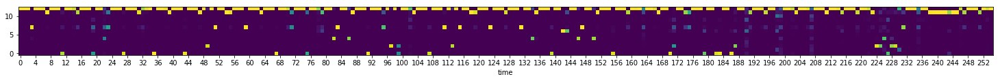

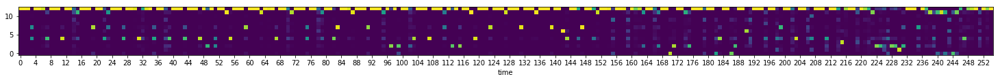

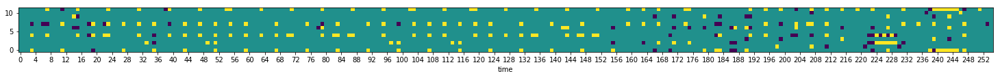

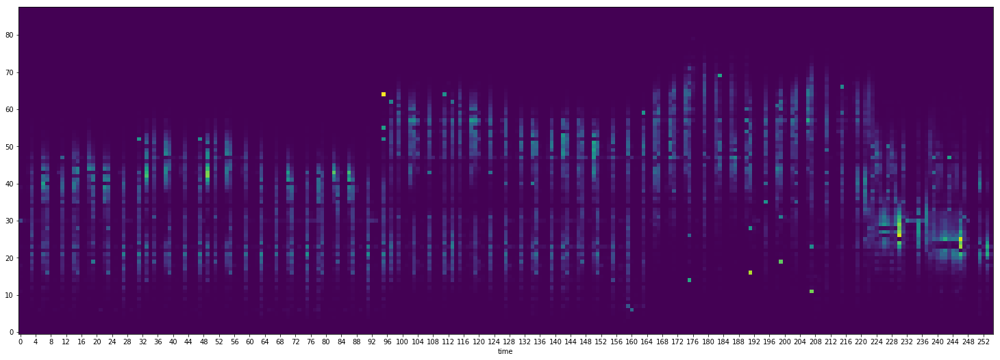

0.107036  mean for last:  0.106043


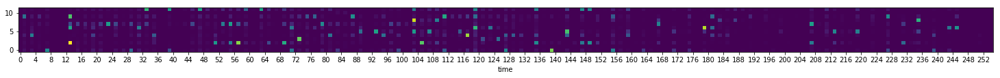

0.109924  mean for last:  0.107049


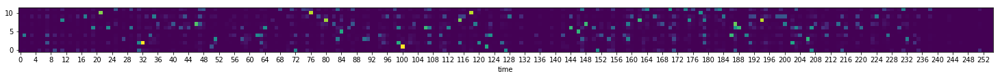

0.11441  mean for last:  0.106653


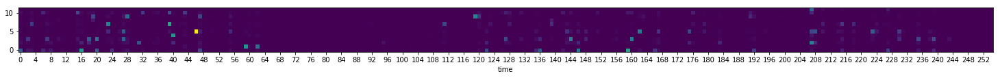

0.112731  mean for last:  0.112933


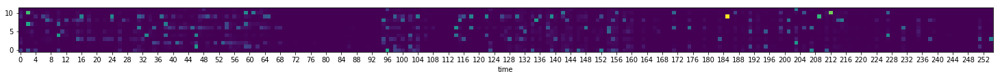

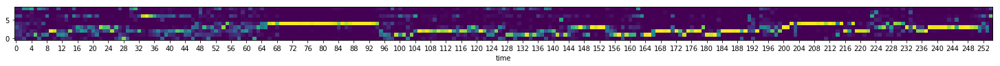

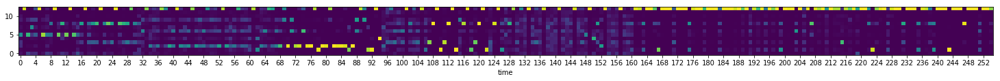

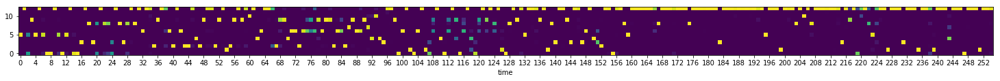

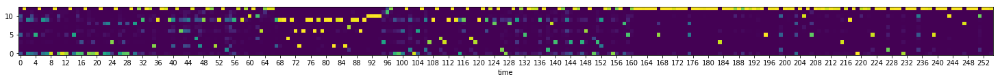

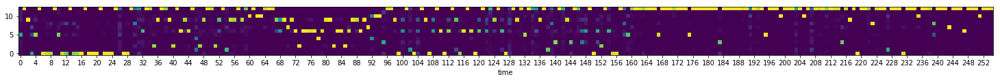

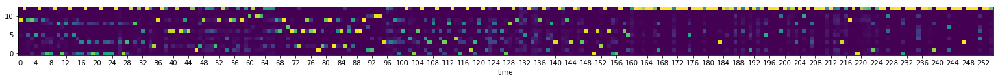

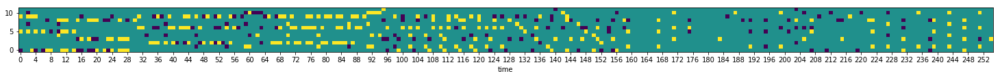

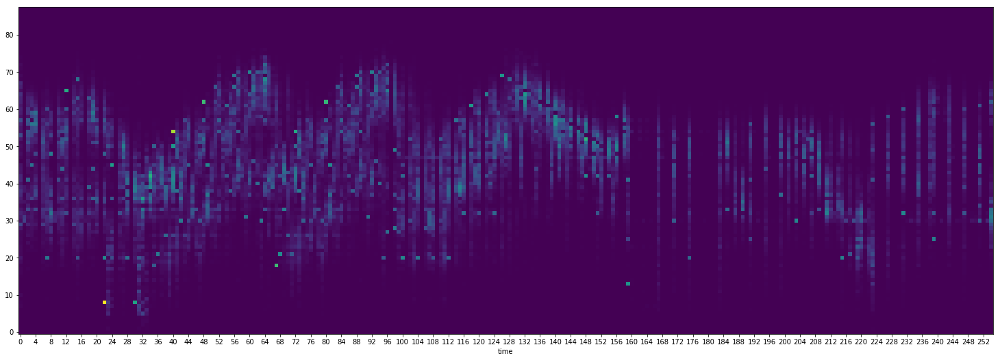

0.118576  mean for last:  0.123733


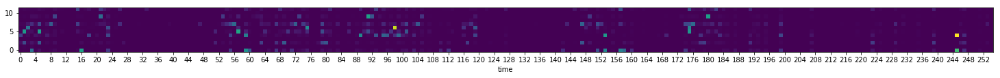

0.108093  mean for last:  0.116687


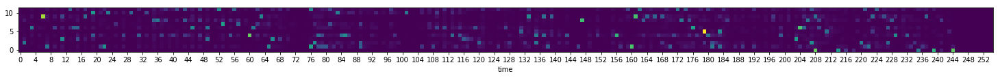

0.102743  mean for last:  0.113318


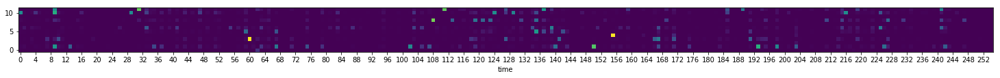

0.109124  mean for last:  0.11137


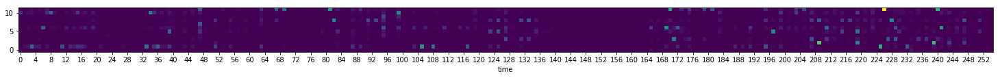

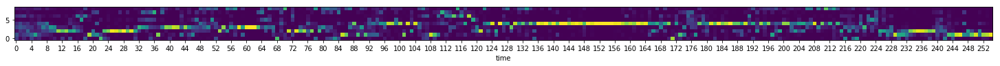

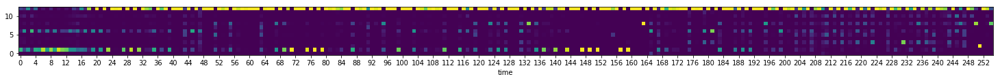

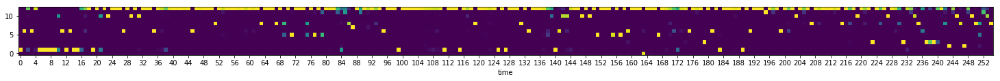

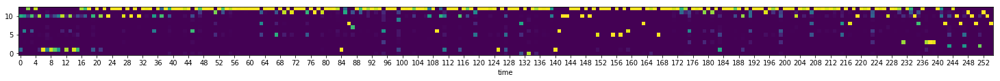

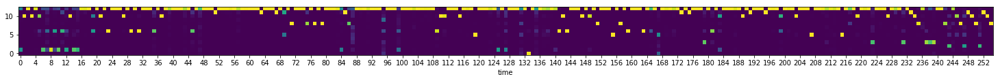

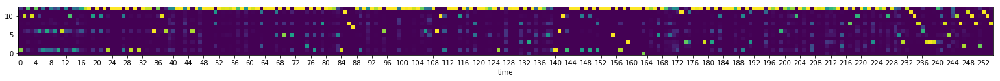

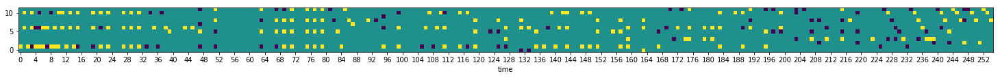

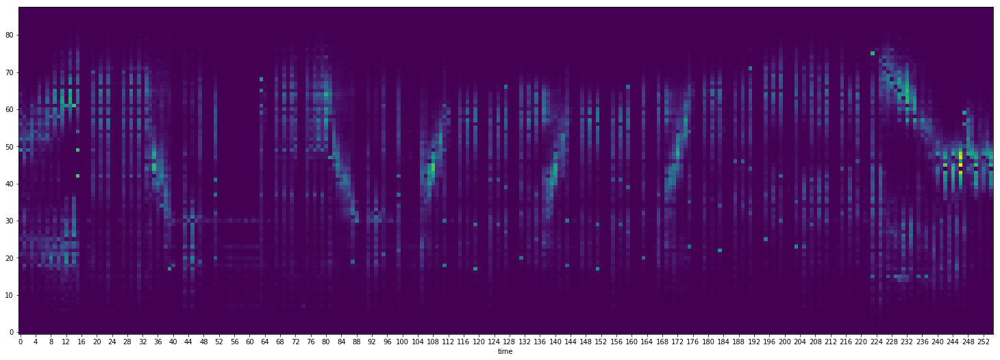

0.109629  mean for last:  0.116378


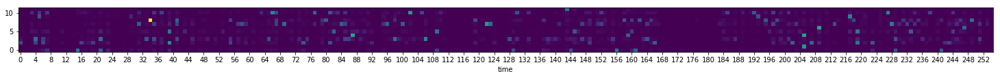

0.119157  mean for last:  0.110766


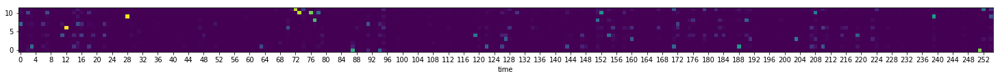

0.108078  mean for last:  0.109242


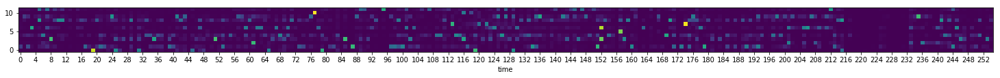

0.106284  mean for last:  0.107425


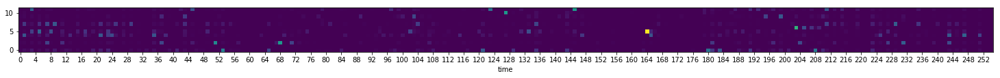

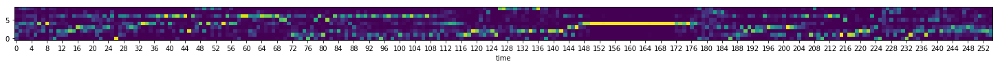

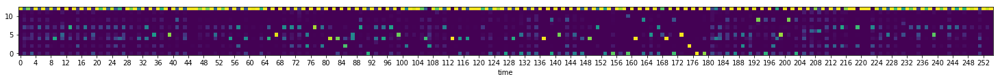

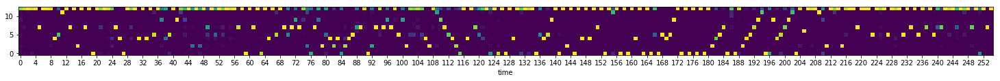

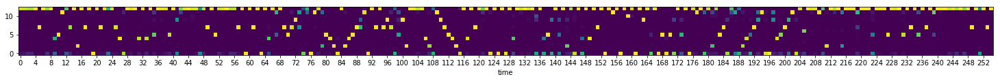

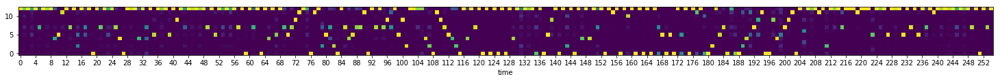

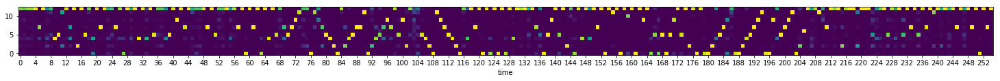

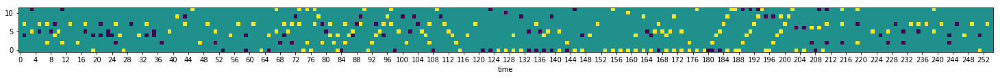

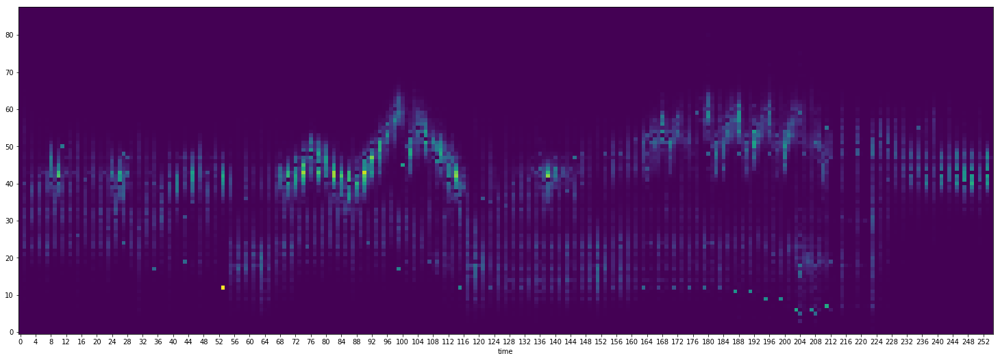

0.111625  mean for last:  0.107788


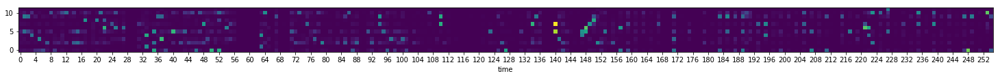

0.0996296  mean for last:  0.108071


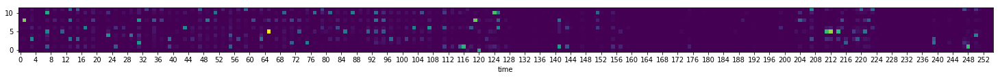

0.106338  mean for last:  0.107781


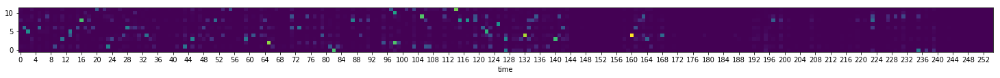

0.108811  mean for last:  0.107696


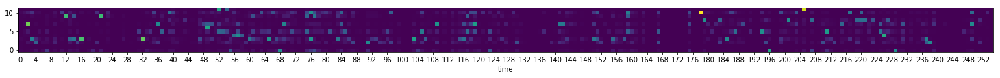

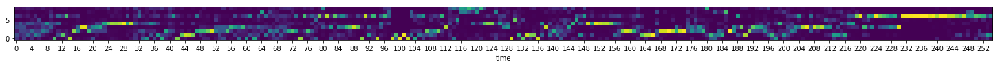

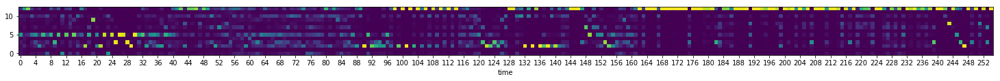

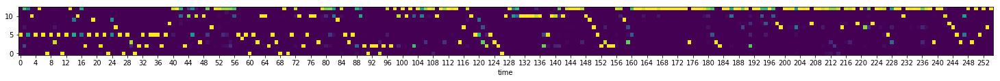

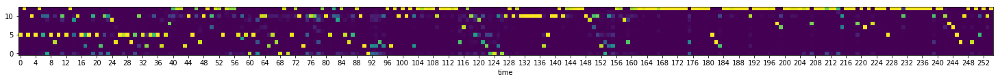

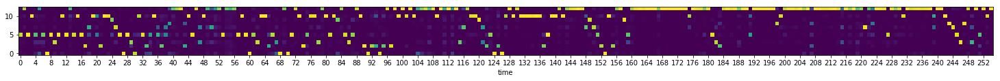

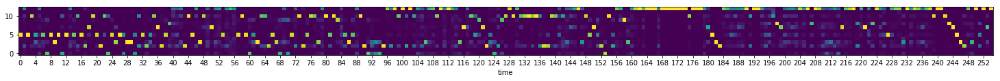

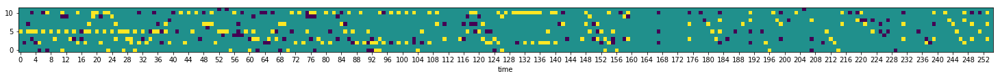

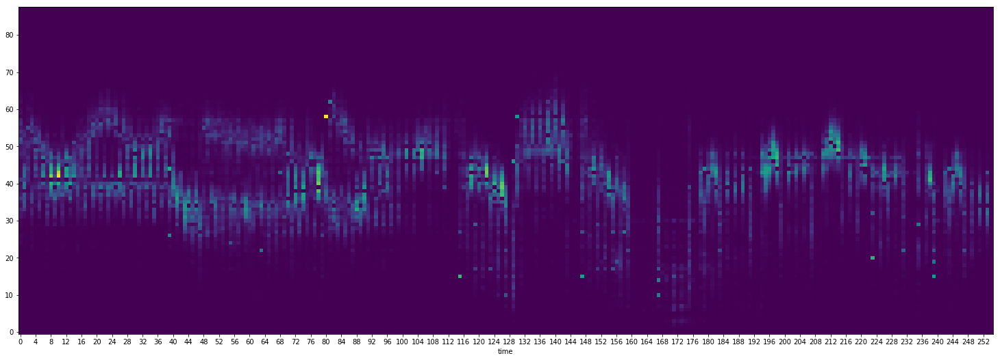

0.105892  mean for last:  0.107625


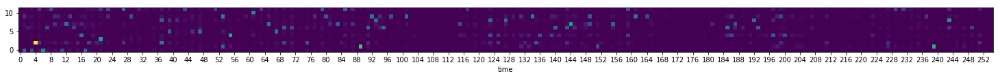

0.104156  mean for last:  0.107743


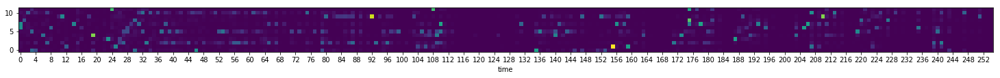

0.106397  mean for last:  0.107183


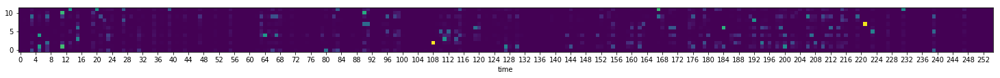

0.109321  mean for last:  0.106479


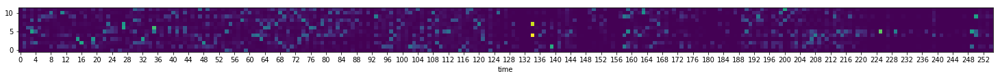

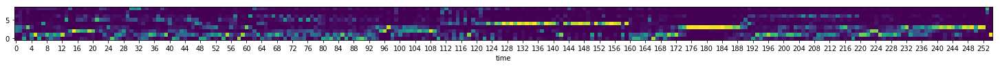

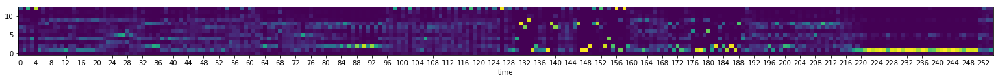

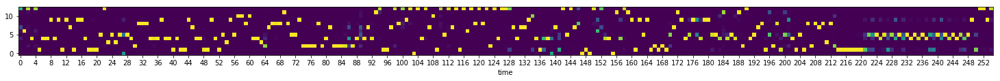

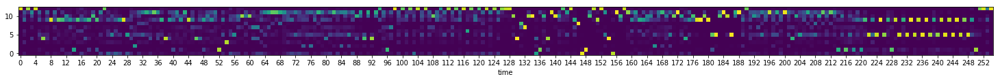

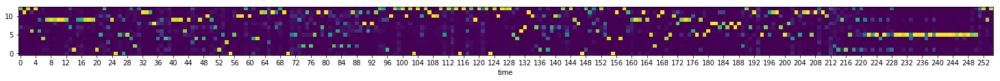

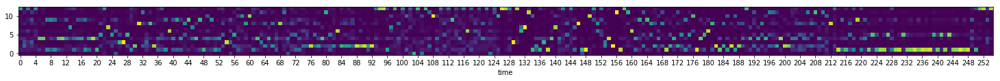

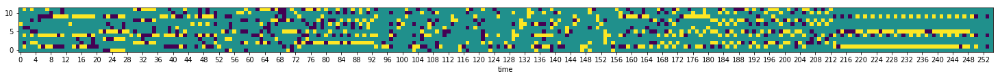

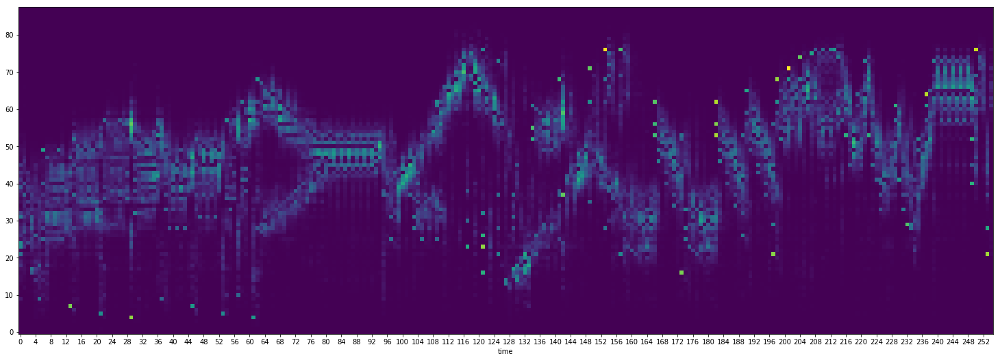

0.106656  mean for last:  0.107109


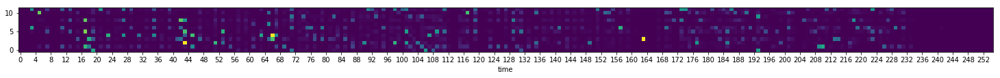

0.108213  mean for last:  0.107031


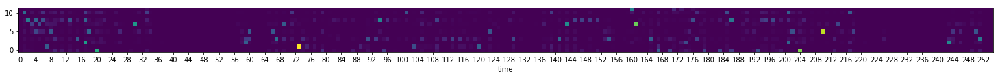

0.105323  mean for last:  0.106758


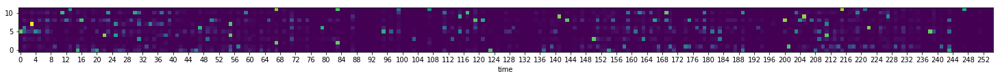

0.104938  mean for last:  0.106532


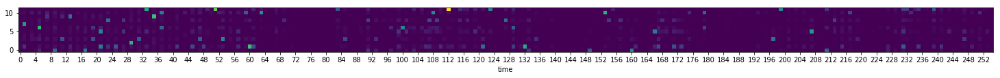

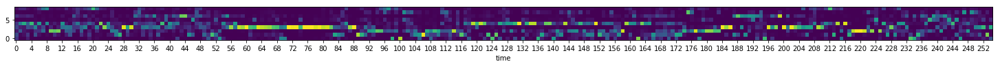

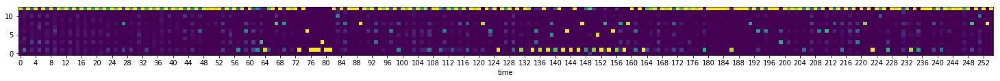

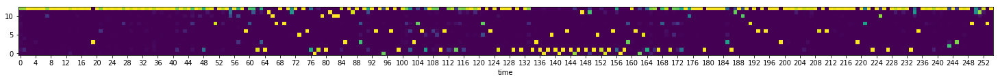

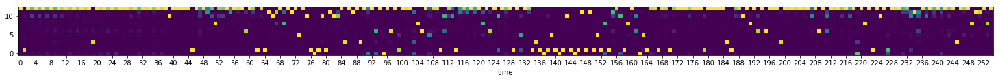

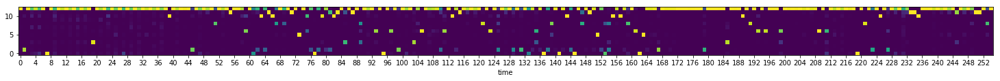

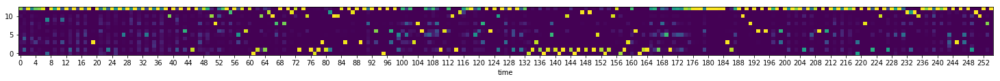

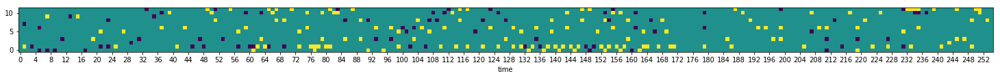

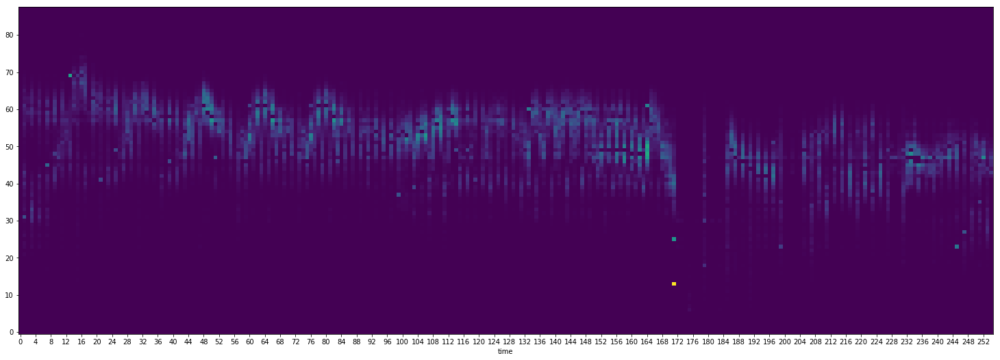

0.108902  mean for last:  0.105561


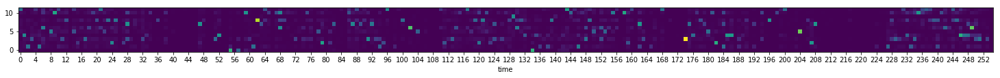

0.111947  mean for last:  0.105738


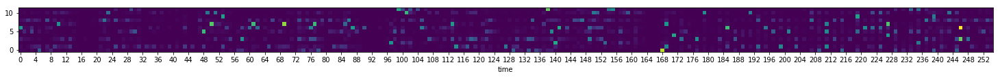

0.0967443  mean for last:  0.105814


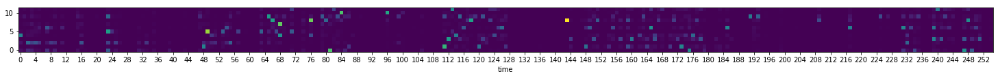

0.101089  mean for last:  0.105656


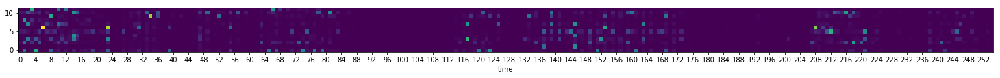

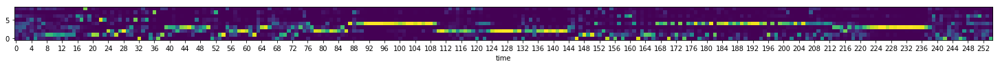

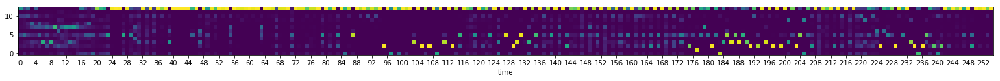

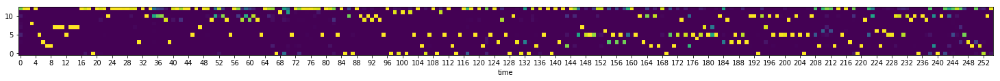

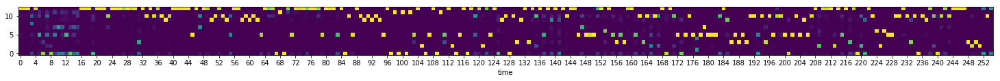

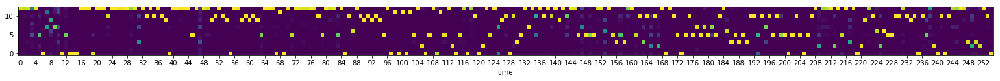

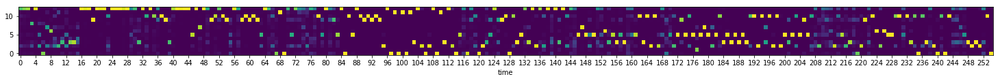

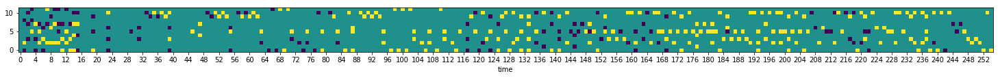

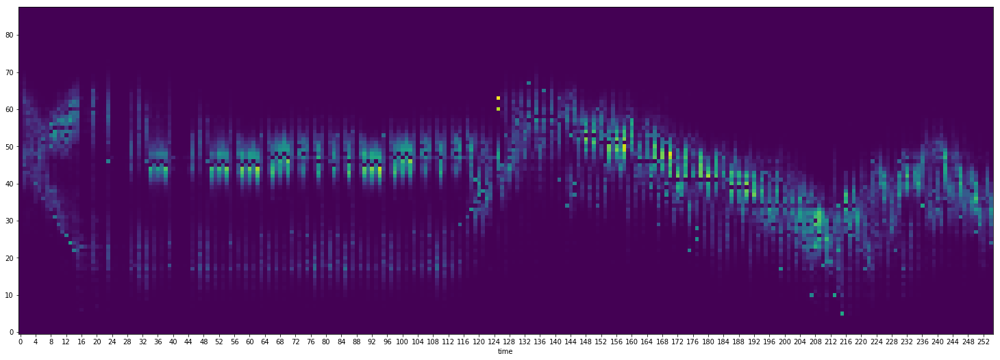

0.0962988  mean for last:  0.105995


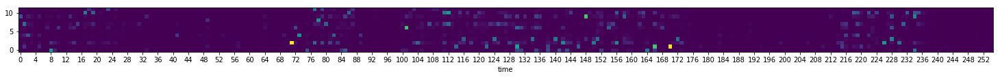

0.112608  mean for last:  0.106689


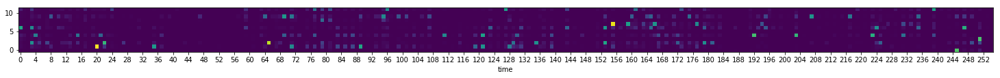

0.111606  mean for last:  0.105274


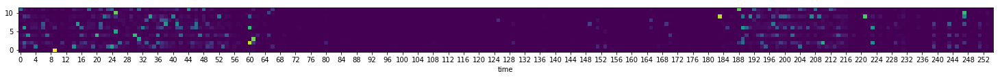

0.105856  mean for last:  0.105294


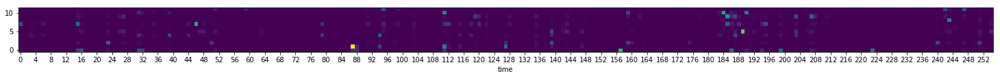

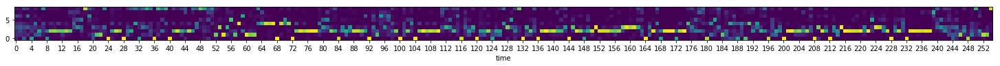

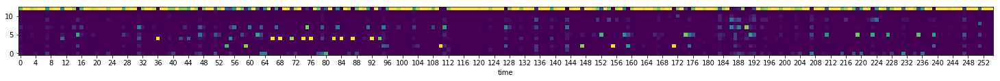

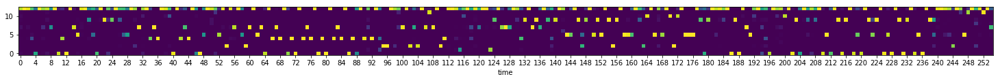

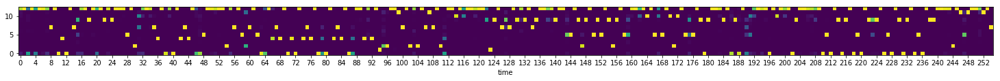

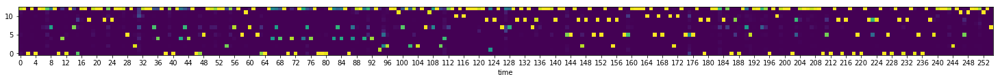

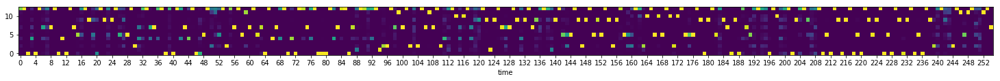

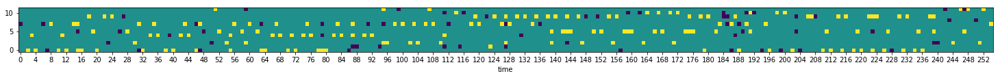

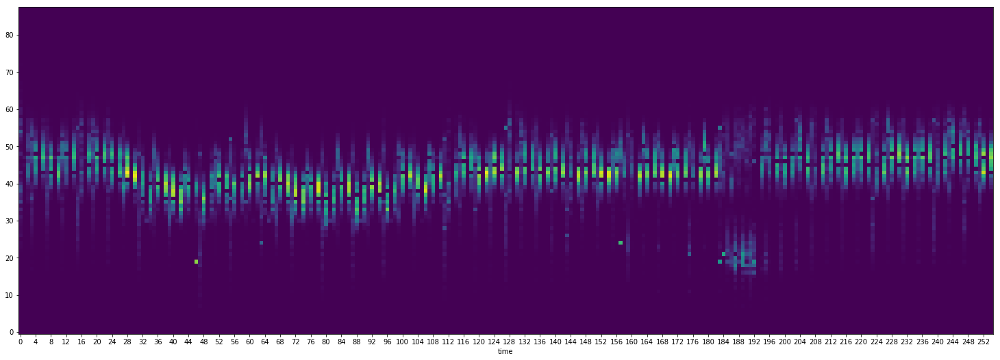

0.106514  mean for last:  0.10631


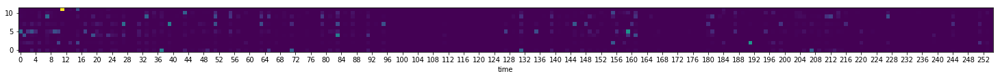

0.103841  mean for last:  0.106353


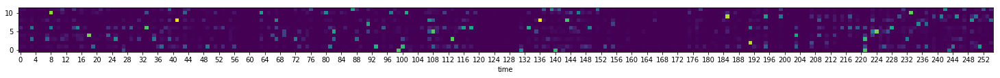

0.10043  mean for last:  0.105873


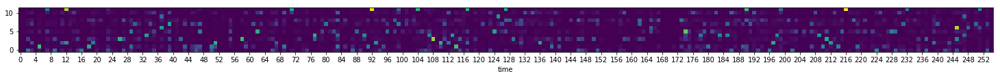

0.100386  mean for last:  0.105428


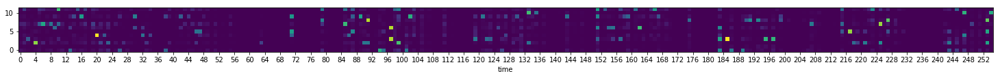

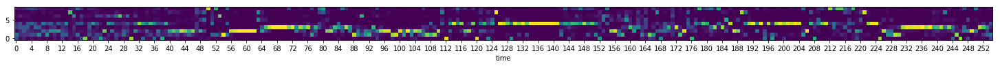

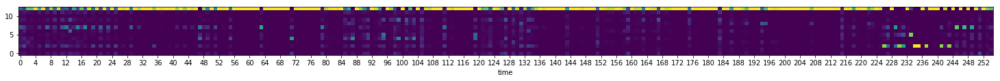

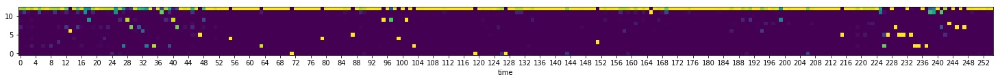

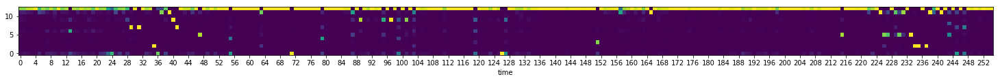

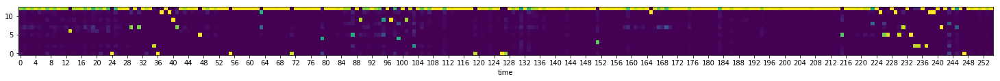

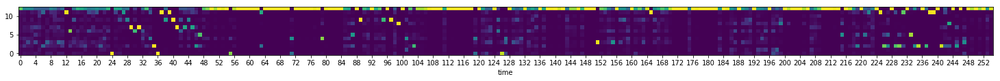

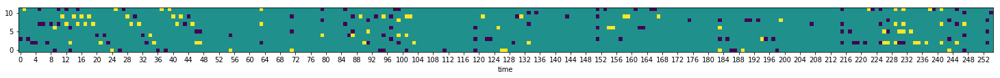

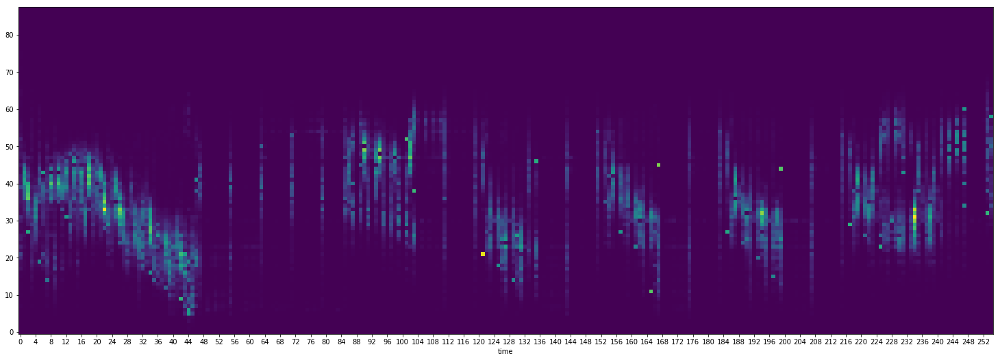

0.117853  mean for last:  0.106227


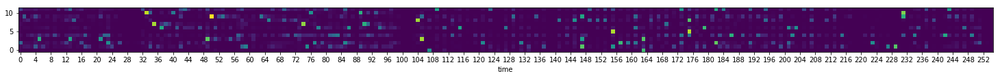

0.10861  mean for last:  0.105943


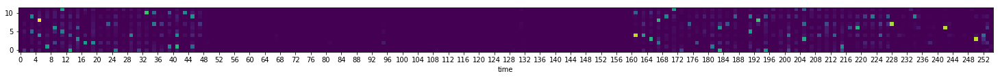

0.102973  mean for last:  0.107264


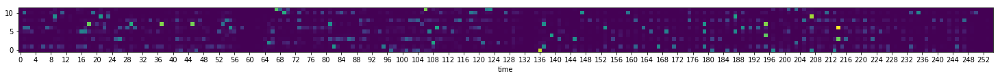

0.104422  mean for last:  0.106141


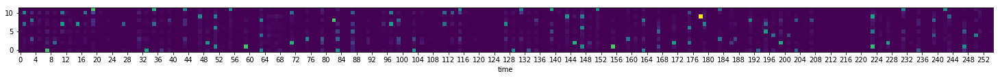

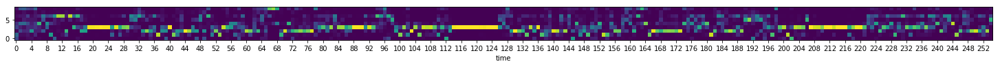

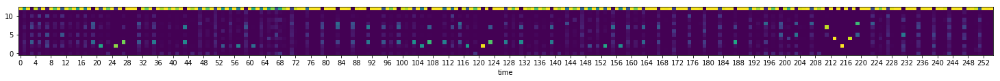

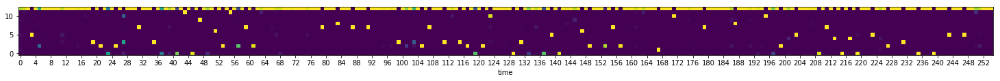

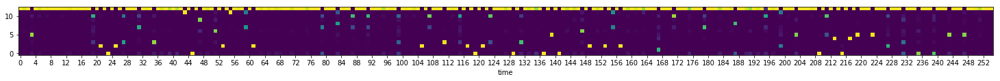

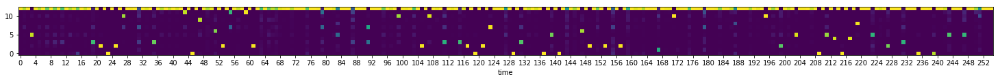

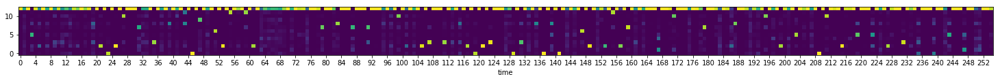

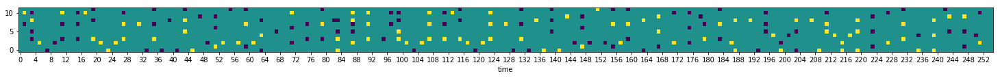

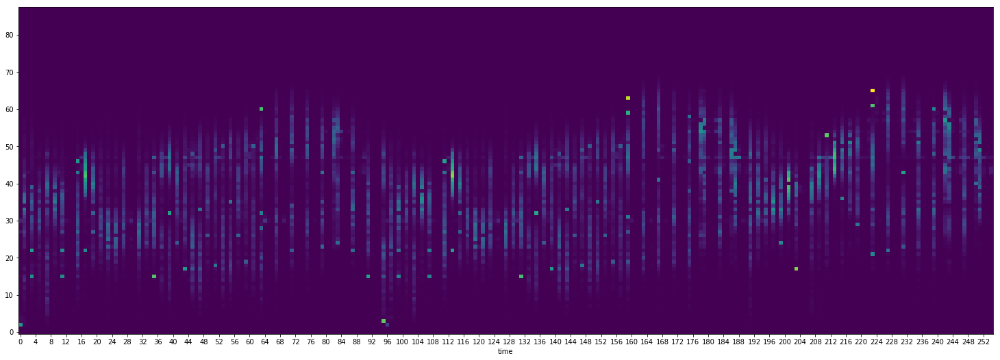

0.104471  mean for last:  0.10548


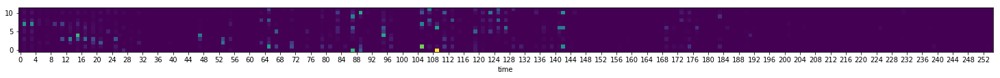

0.102324  mean for last:  0.10566


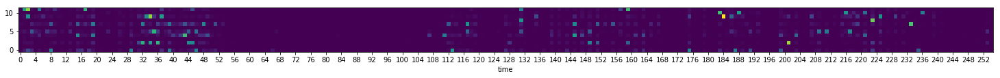

0.10396  mean for last:  0.107045


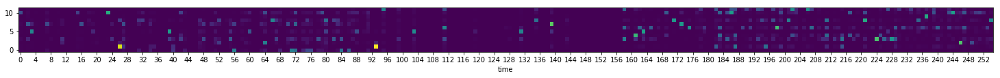

0.100625  mean for last:  0.104689


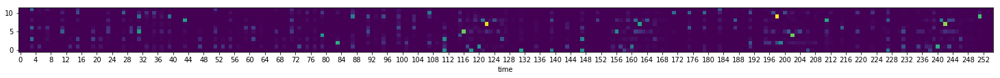

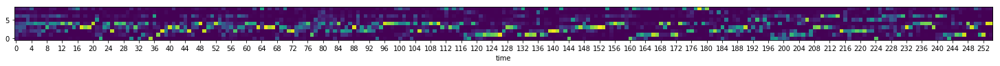

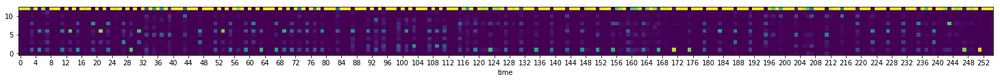

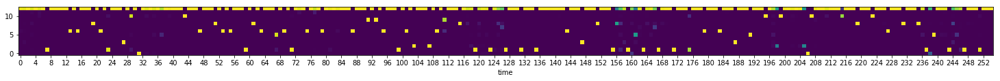

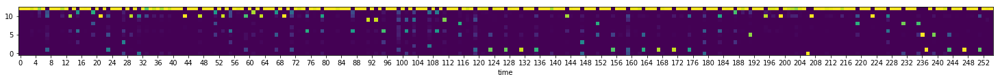

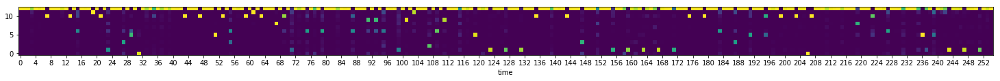

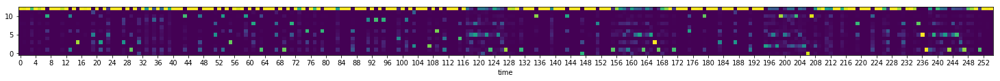

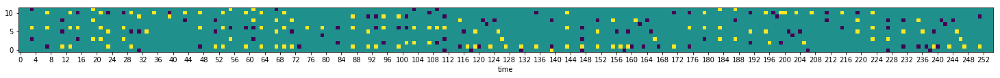

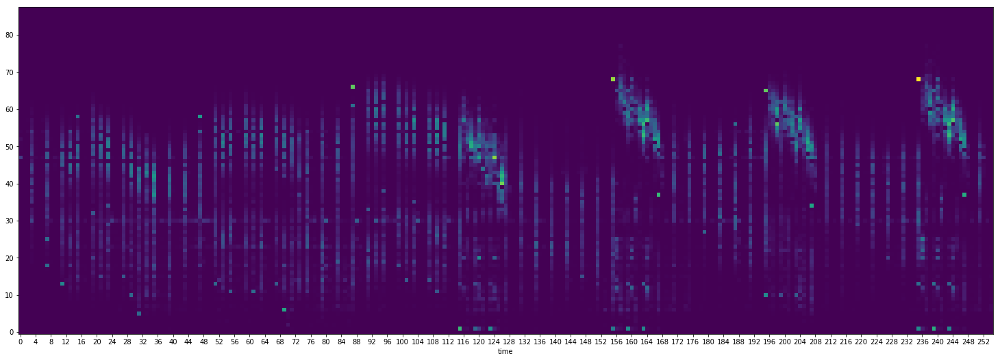

0.106646  mean for last:  0.105262


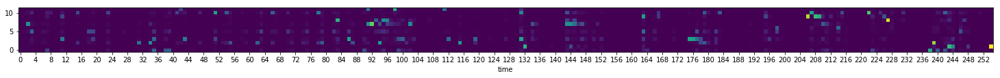

0.111223  mean for last:  0.105655


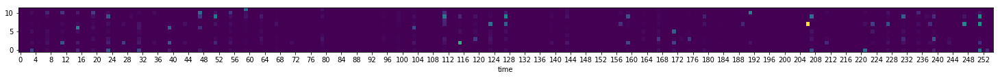

0.107684  mean for last:  0.106951


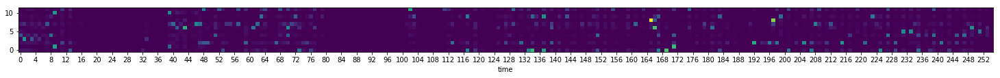

0.114109  mean for last:  0.107075


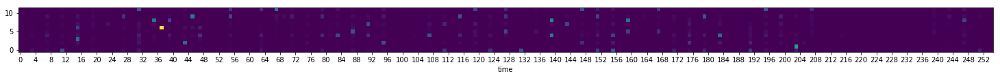

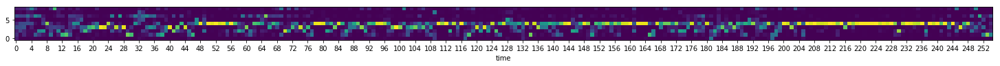

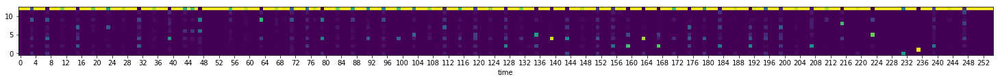

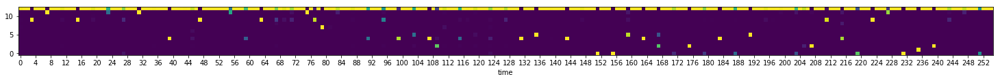

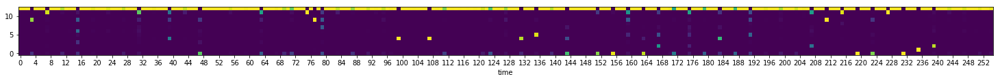

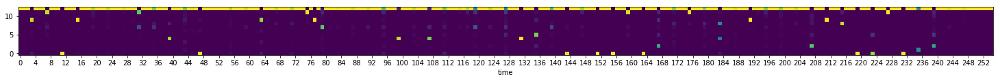

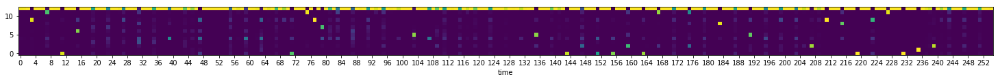

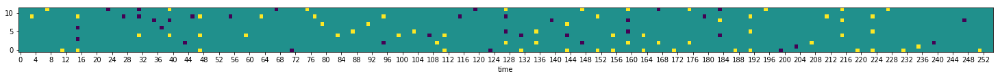

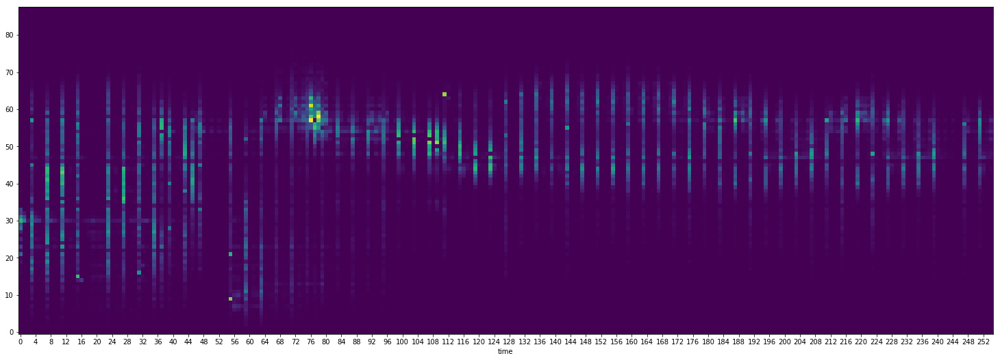

0.105656  mean for last:  0.106345


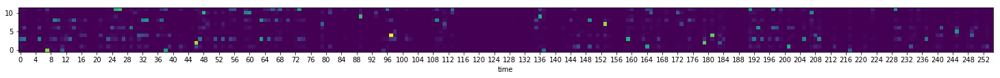

0.109301  mean for last:  0.105478


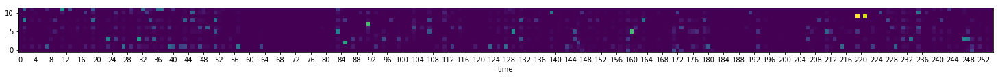

0.108589  mean for last:  0.103767


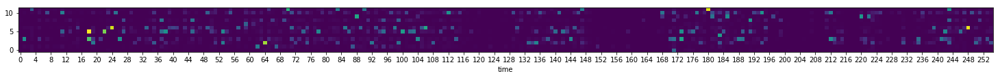

0.107702  mean for last:  0.10495


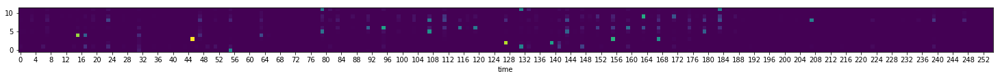

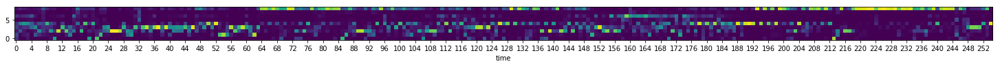

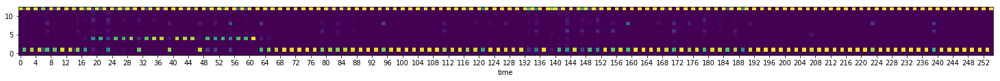

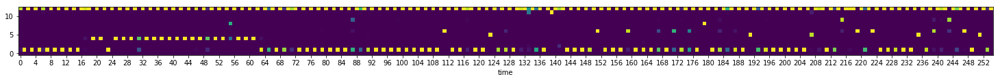

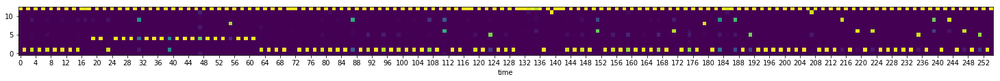

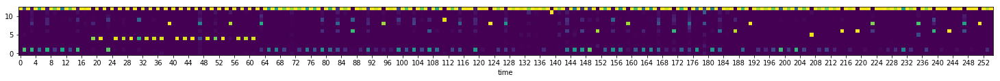

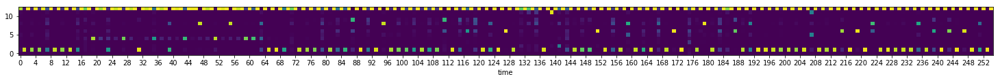

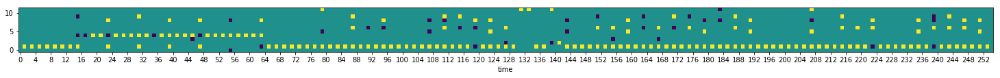

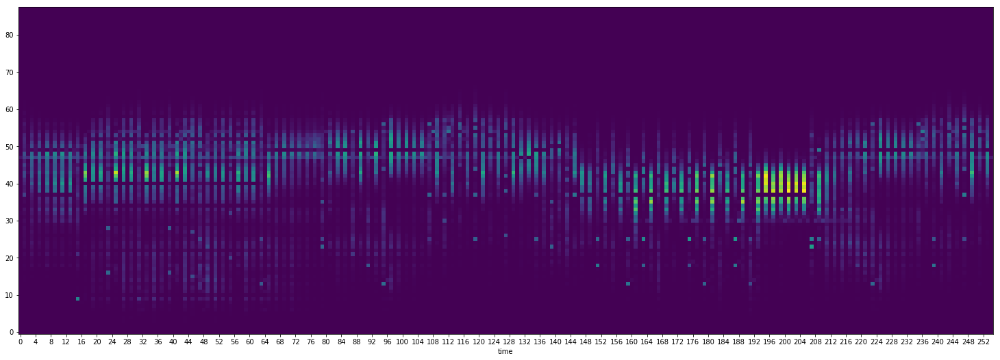

0.105588  mean for last:  0.106404


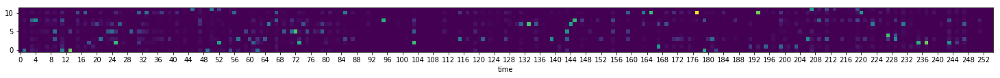

0.100856  mean for last:  0.105157


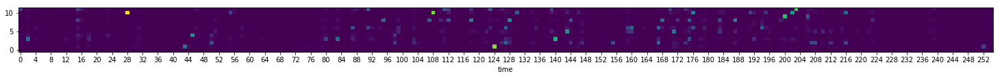

0.111032  mean for last:  0.106063


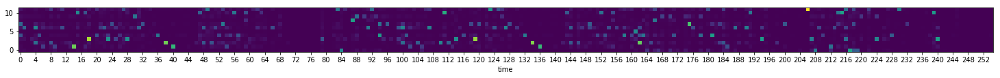

0.113525  mean for last:  0.105286


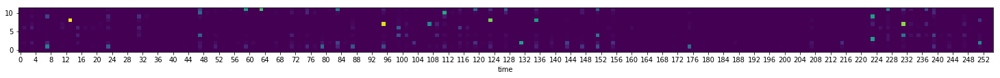

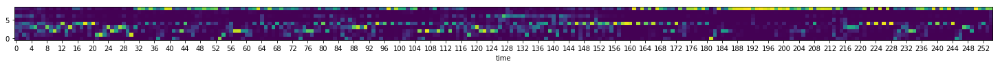

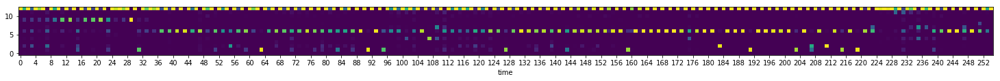

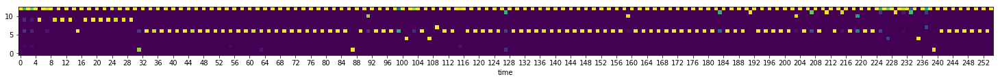

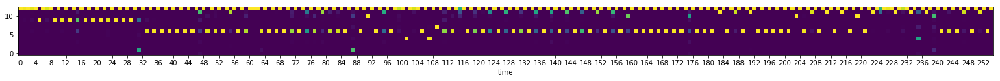

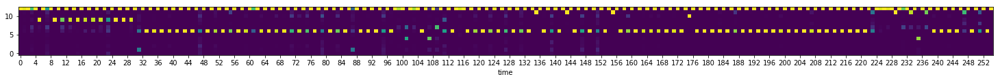

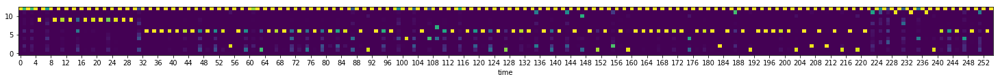

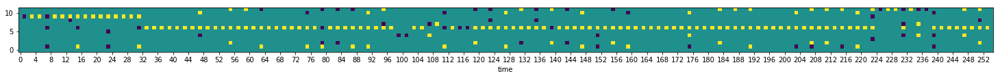

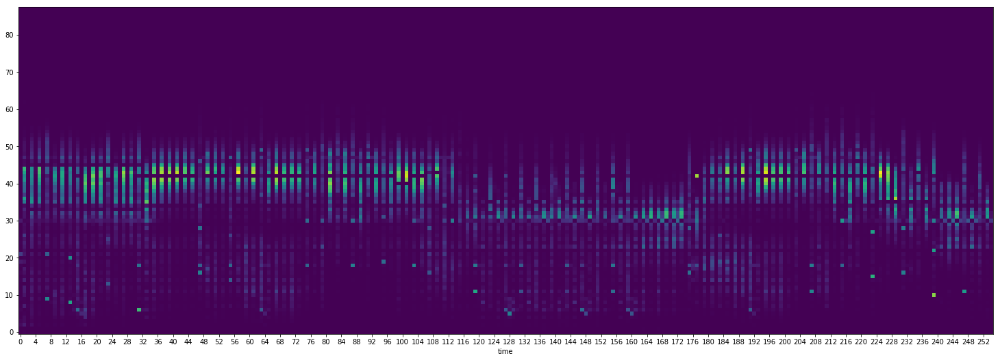

0.106212  mean for last:  0.105819


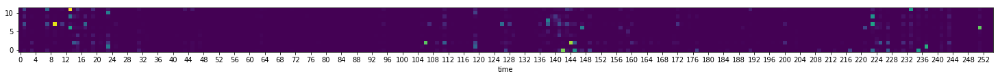

0.104034  mean for last:  0.106068


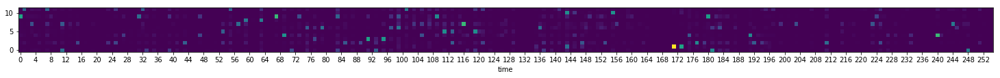

0.114015  mean for last:  0.108318


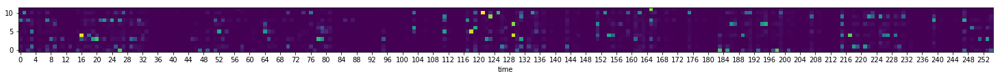

0.104377  mean for last:  0.111305


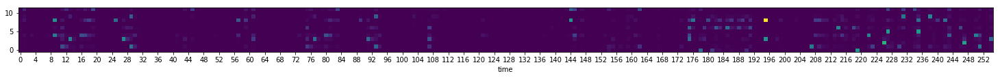

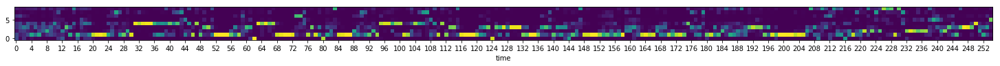

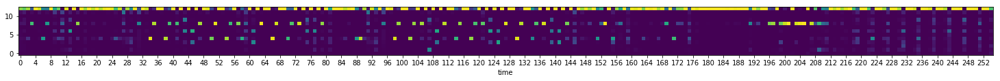

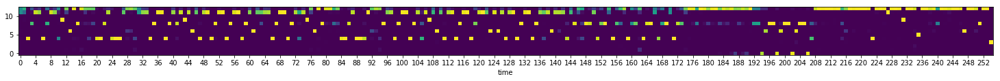

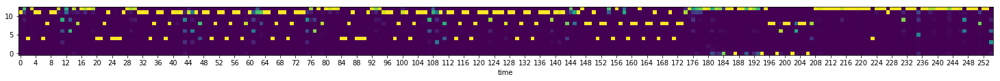

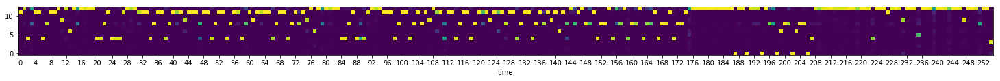

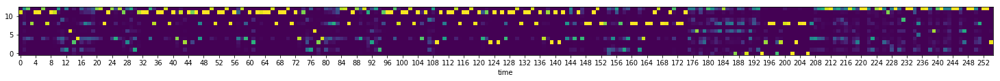

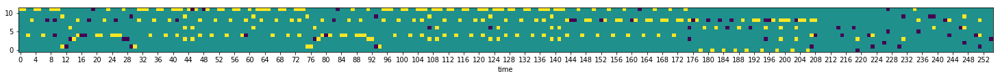

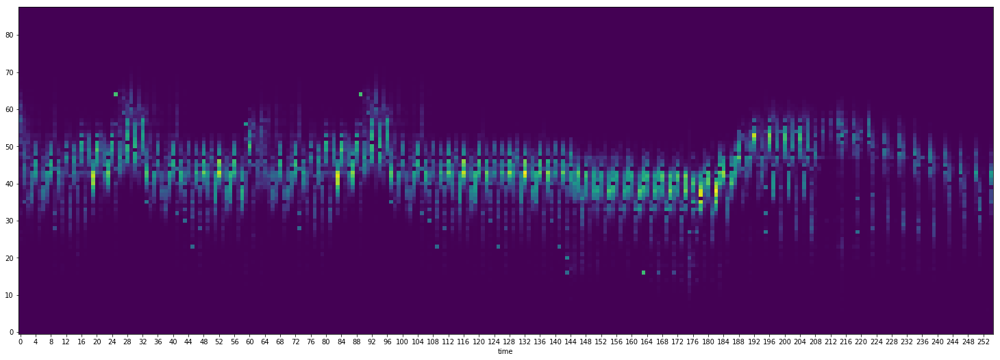

0.105142  mean for last:  0.107905


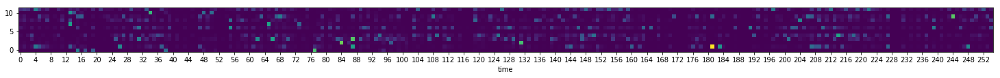

0.105275  mean for last:  0.107367


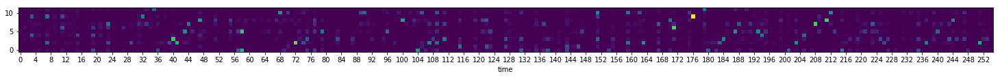

0.111838  mean for last:  0.107231


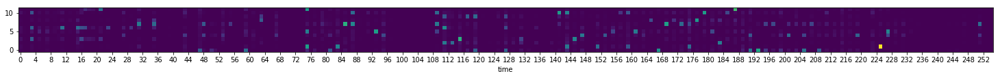

0.105085  mean for last:  0.106745


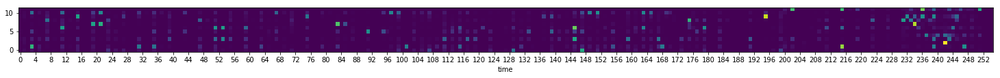

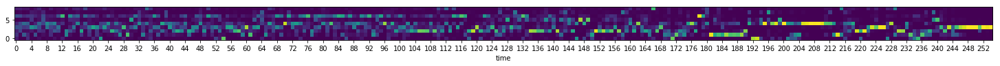

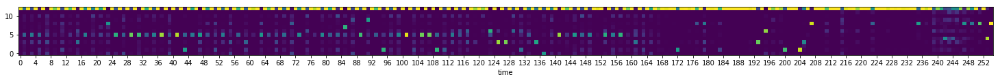

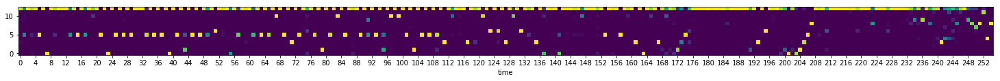

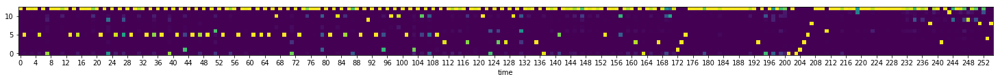

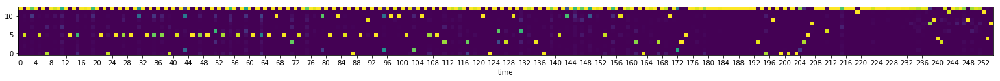

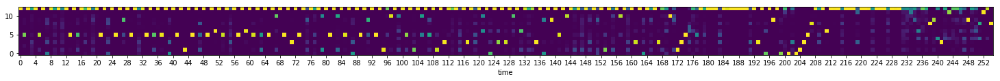

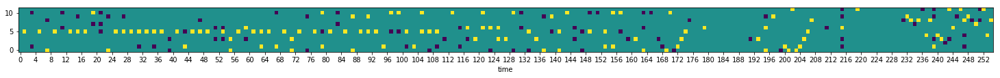

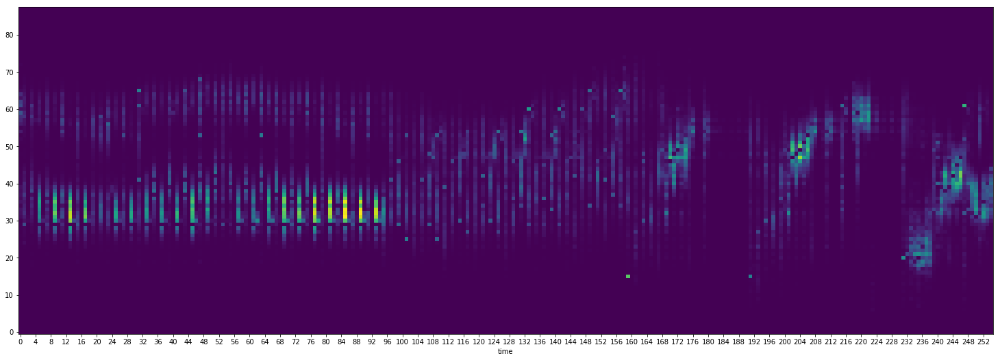

0.105922  mean for last:  0.105652


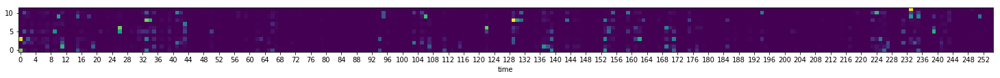

0.111028  mean for last:  0.10763


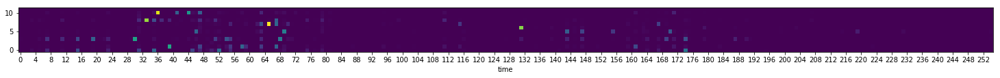

0.101025  mean for last:  0.106377


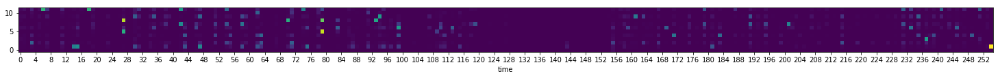

0.115318  mean for last:  0.106313


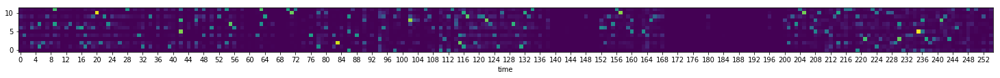

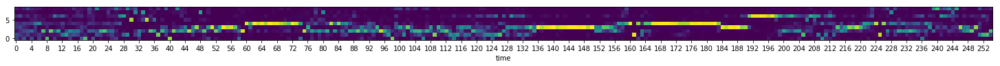

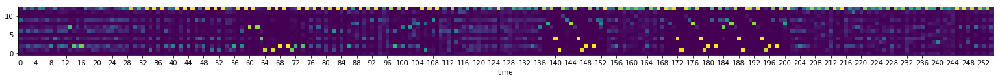

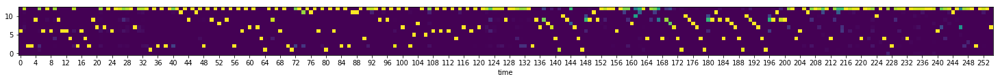

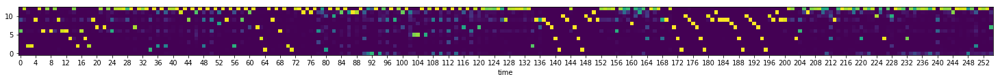

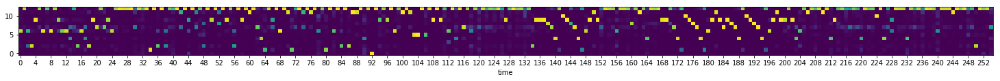

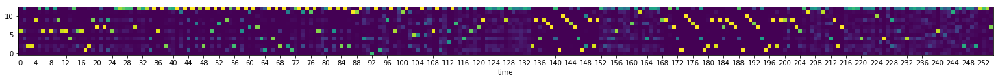

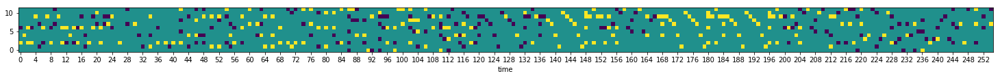

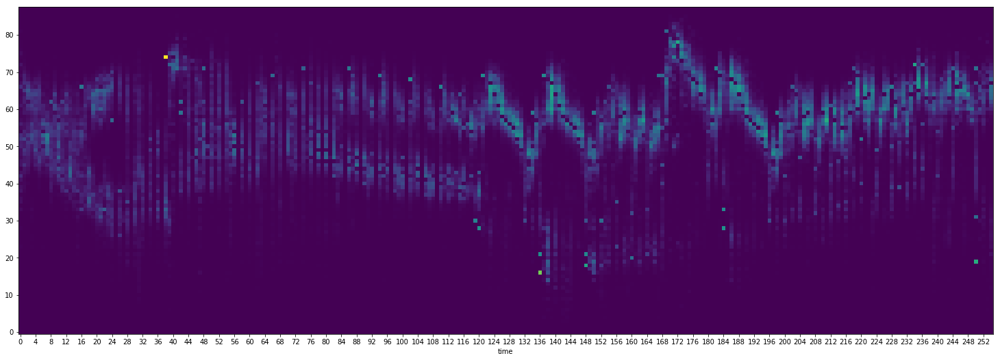

0.105356  mean for last:  0.106106


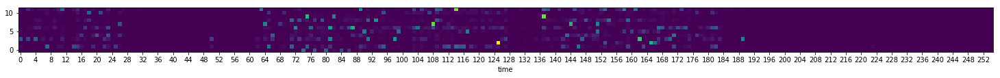

0.109137  mean for last:  0.106078


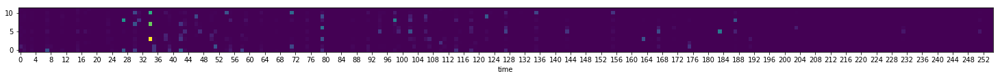

0.104823  mean for last:  0.106522


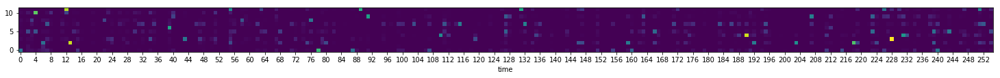

0.104157  mean for last:  0.105235


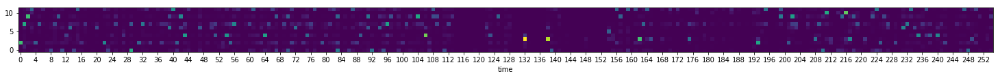

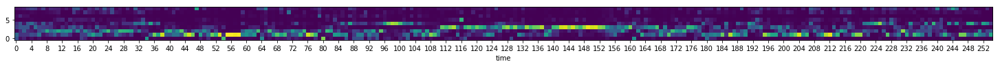

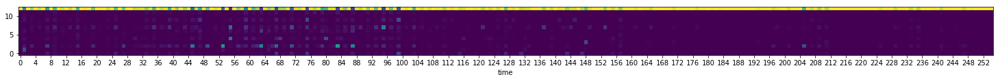

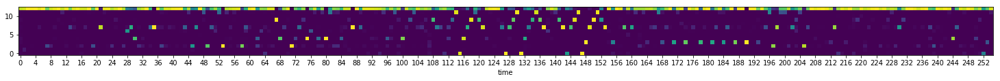

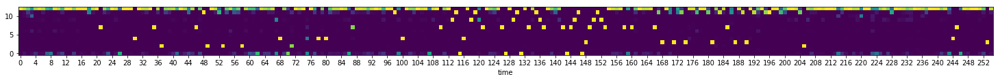

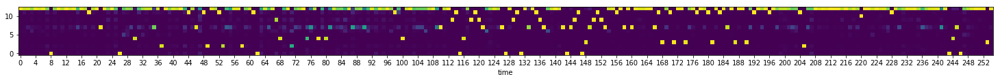

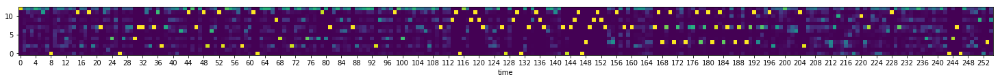

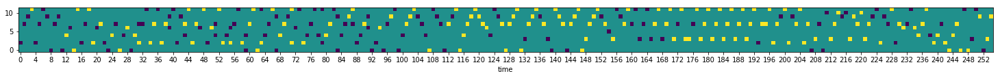

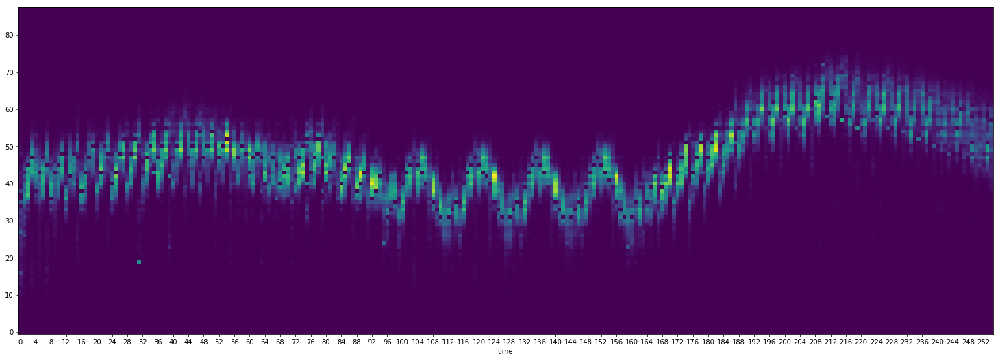

0.108174  mean for last:  0.105275


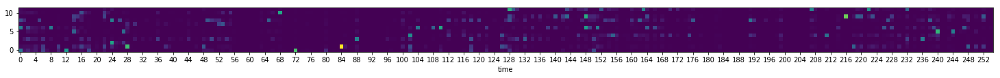

0.108688  mean for last:  0.105281


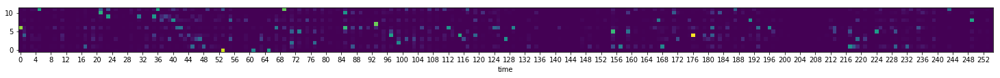

0.111629  mean for last:  0.105098


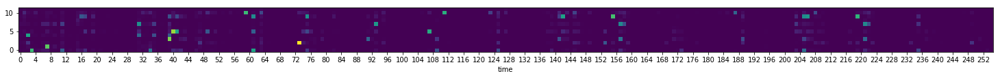

0.103392  mean for last:  0.105101


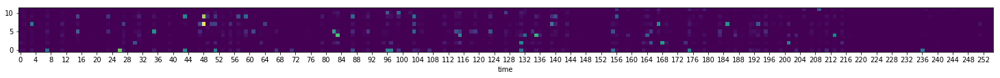

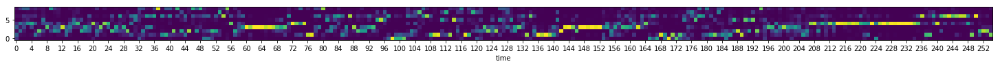

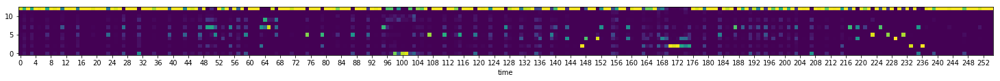

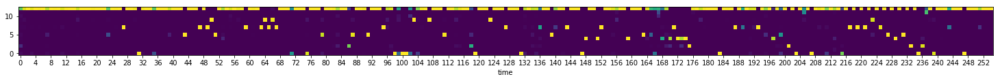

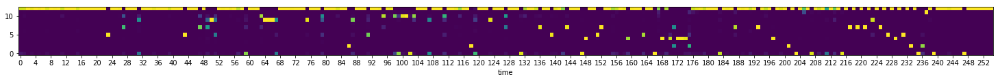

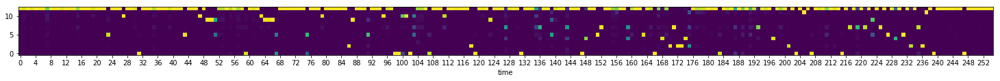

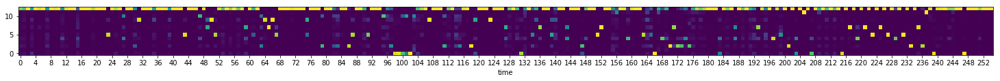

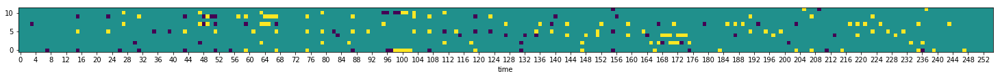

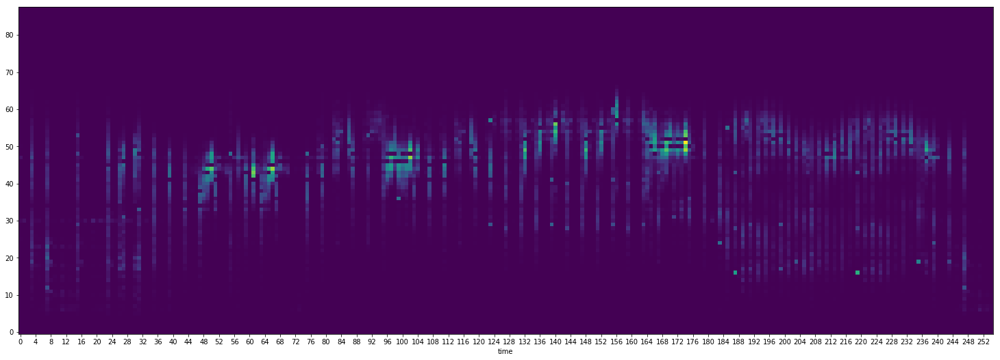

0.105638  mean for last:  0.105067


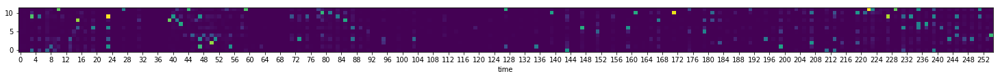

0.0998871  mean for last:  0.104524


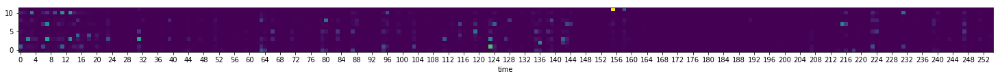

0.111419  mean for last:  0.105905


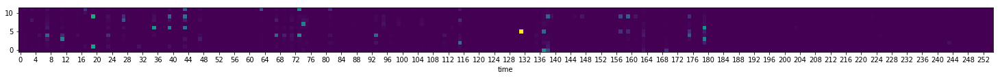

0.117336  mean for last:  0.106127


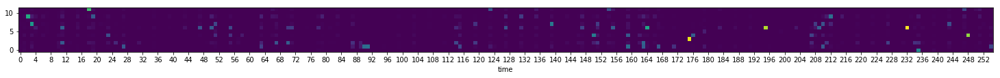

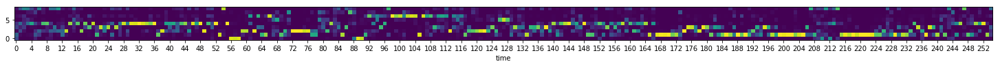

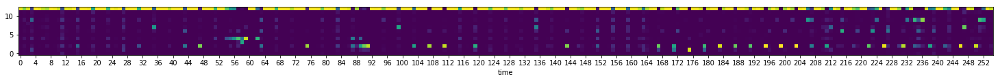

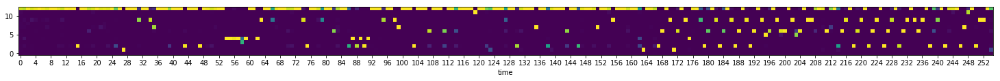

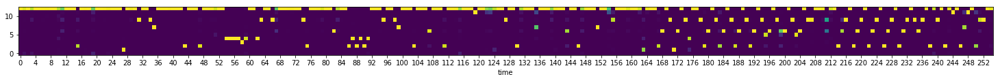

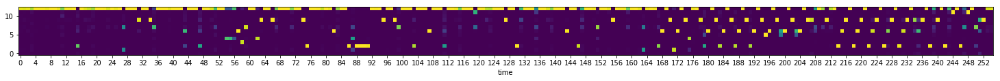

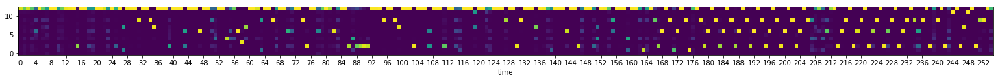

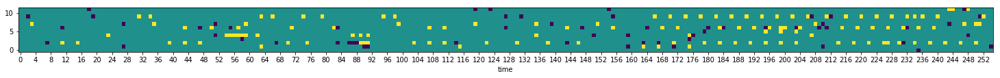

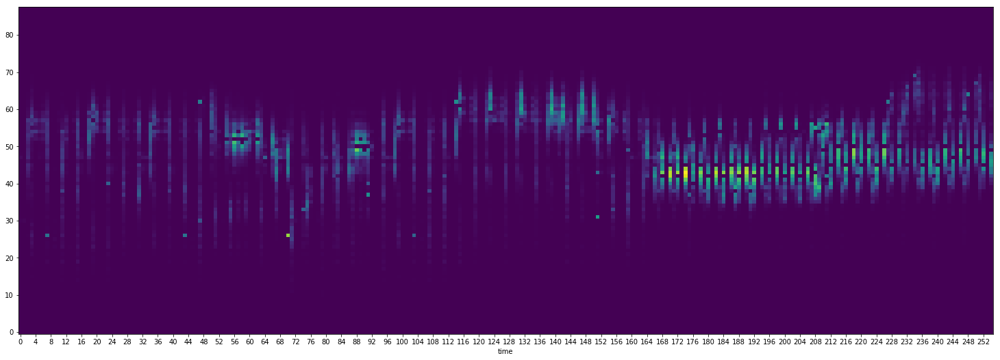

0.0953946  mean for last:  0.105733


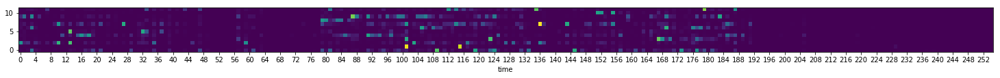

0.106145  mean for last:  0.106085


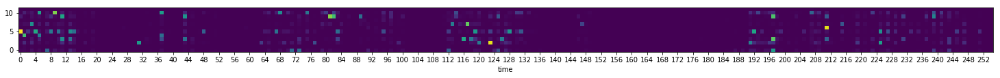

0.102006  mean for last:  0.105356


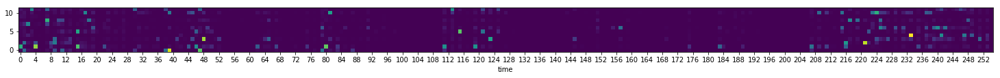

0.106897  mean for last:  0.104412


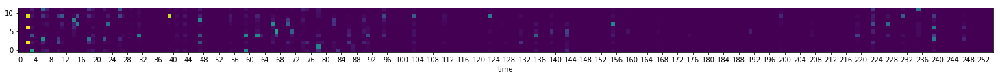

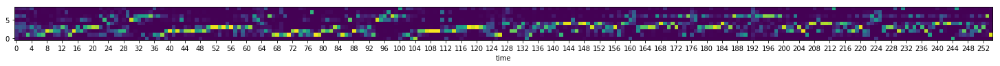

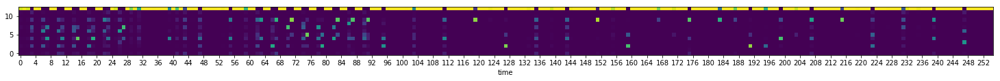

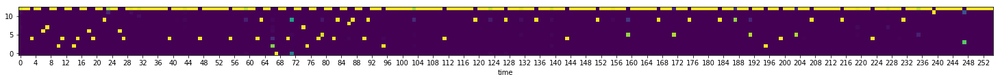

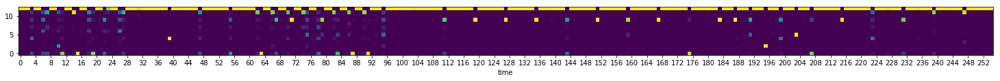

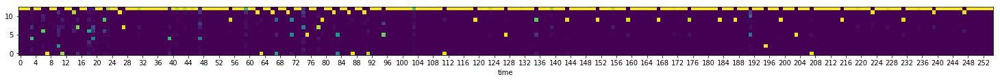

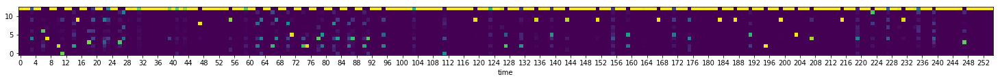

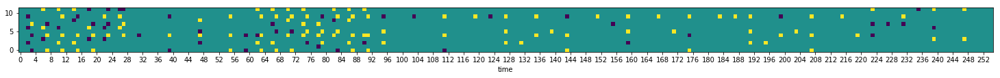

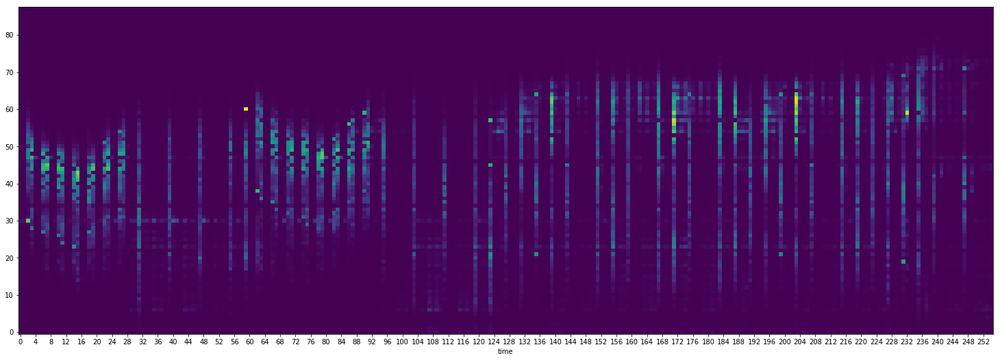

0.106446  mean for last:  0.105318


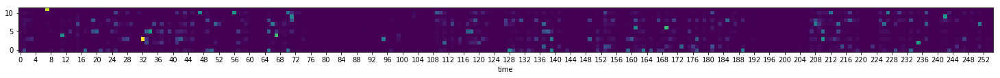

0.1087  mean for last:  0.105016


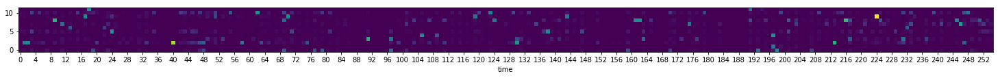

0.105552  mean for last:  0.103878


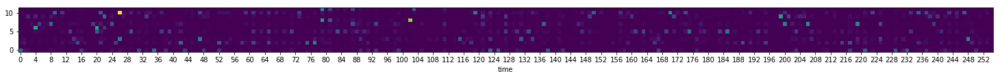

0.108016  mean for last:  0.105463


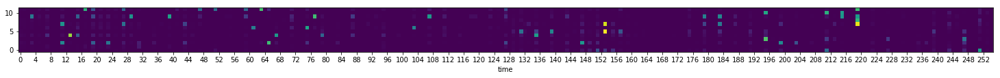

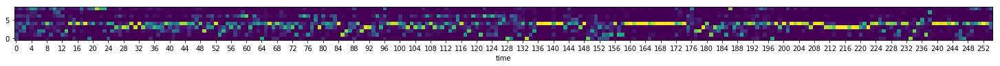

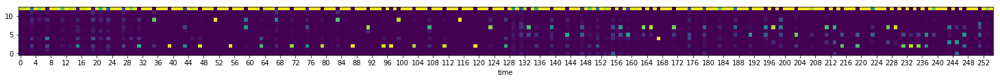

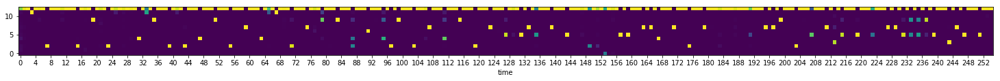

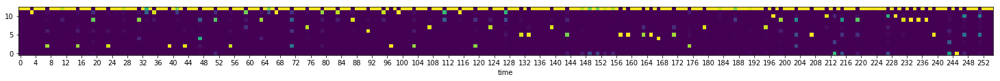

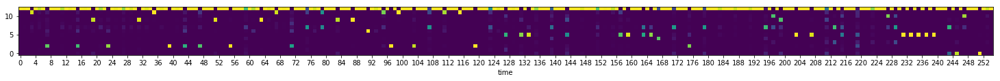

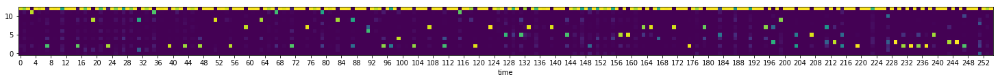

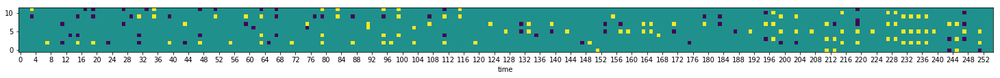

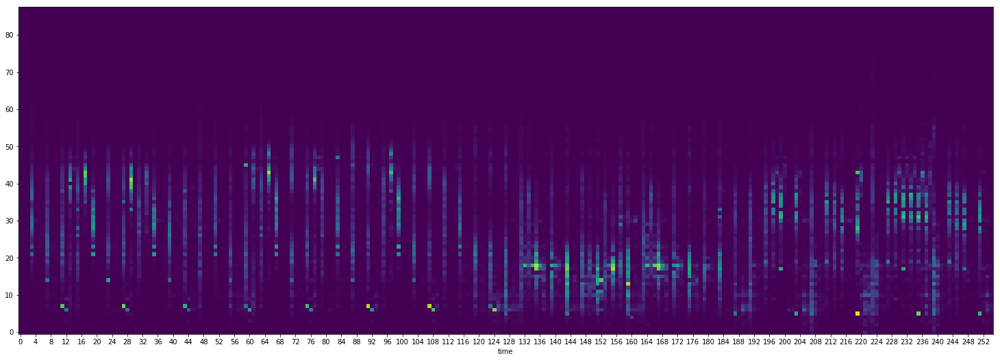

0.117441  mean for last:  0.105452


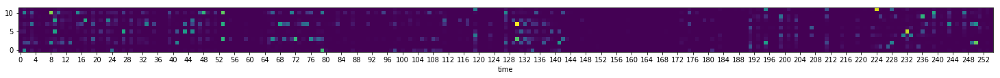

0.100332  mean for last:  0.104421


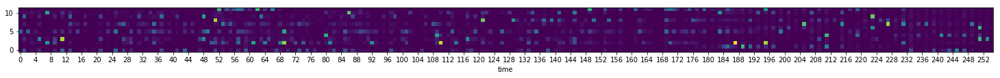

0.104959  mean for last:  0.10499


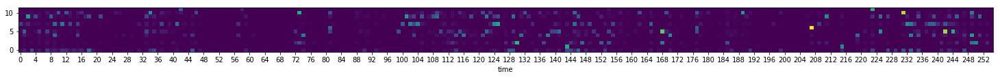

0.0984612  mean for last:  0.104351


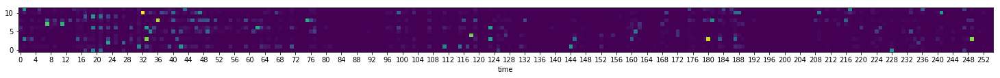

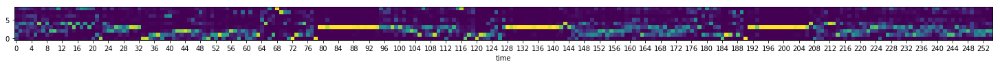

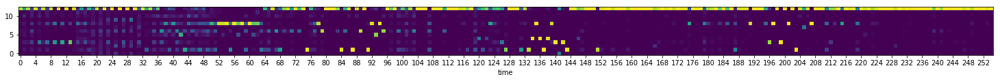

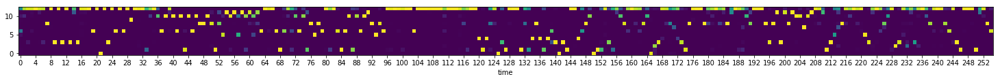

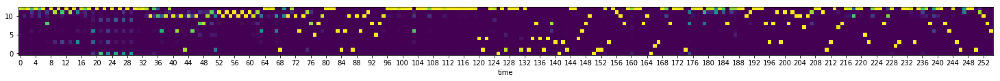

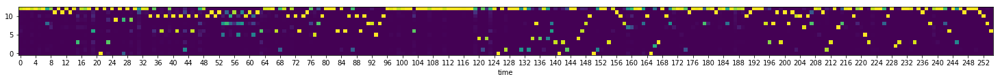

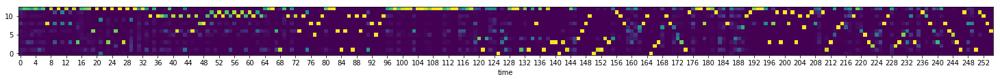

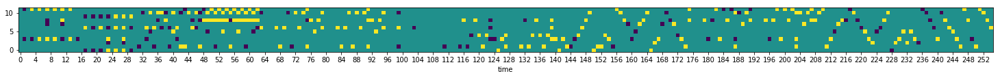

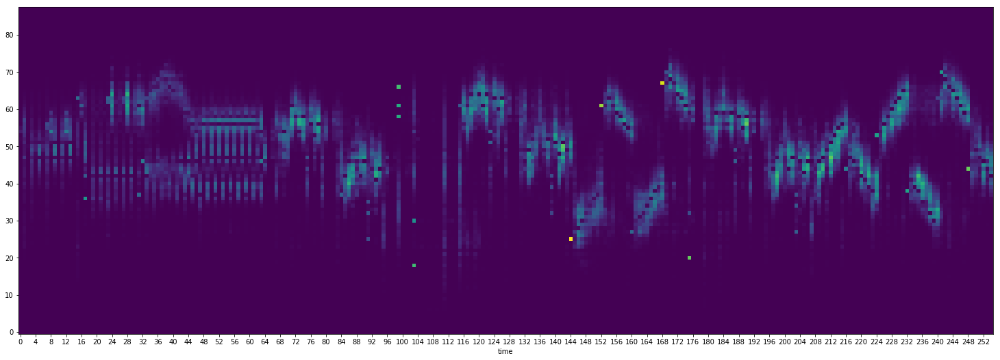

0.0997316  mean for last:  0.104389


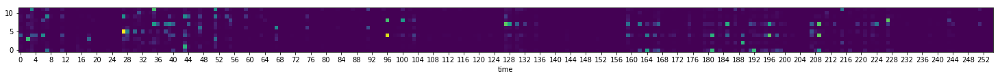

0.103141  mean for last:  0.105493


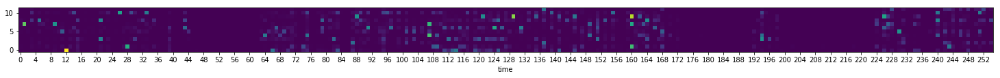

0.0965151  mean for last:  0.103664


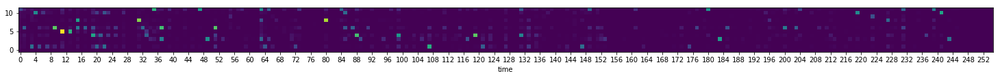

0.100055  mean for last:  0.104091


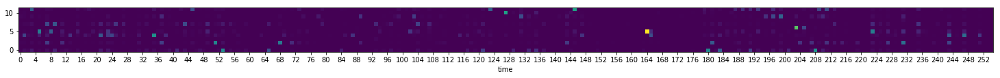

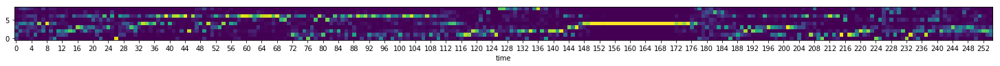

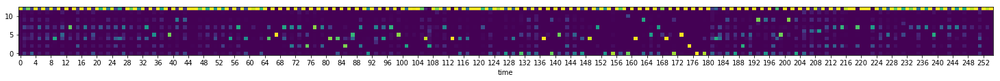

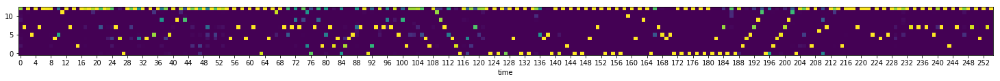

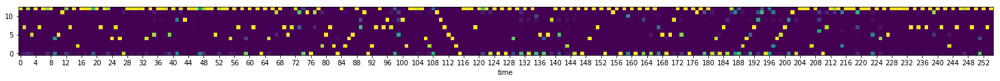

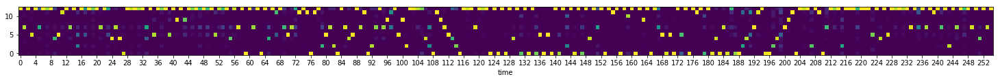

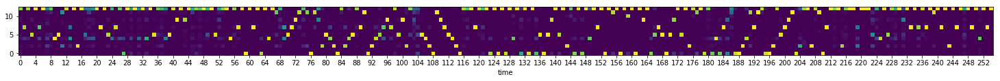

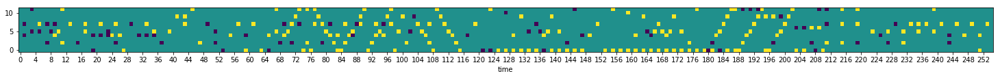

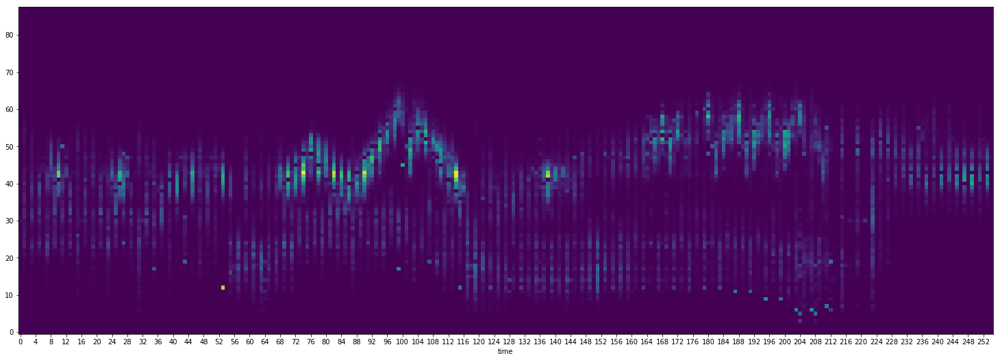

0.108847  mean for last:  0.105168


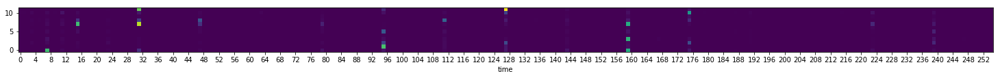

0.106293  mean for last:  0.105132


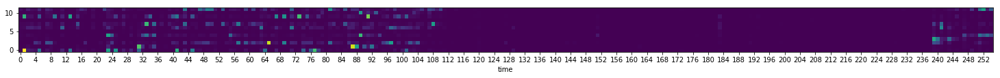

0.100783  mean for last:  0.104212


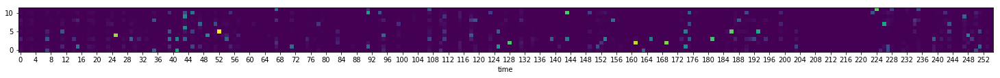

0.1002  mean for last:  0.105793


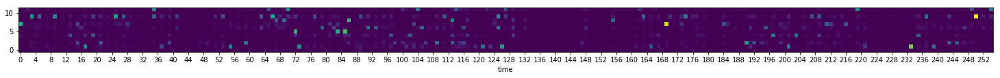

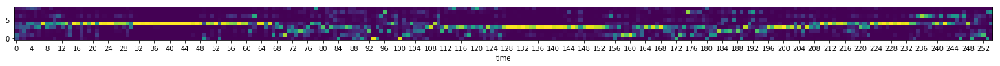

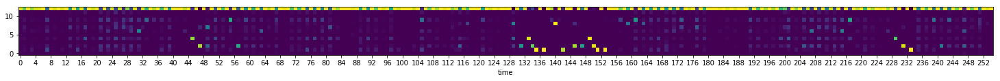

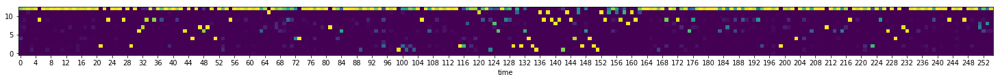

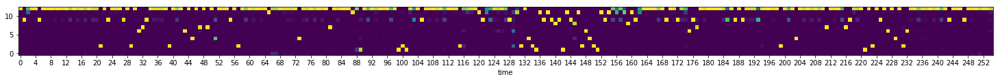

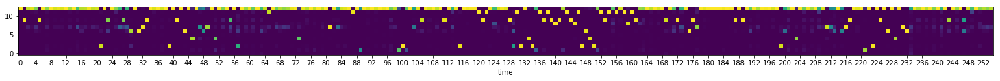

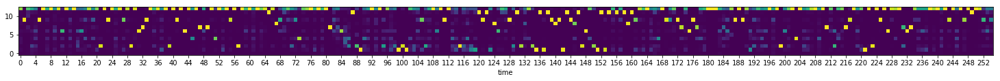

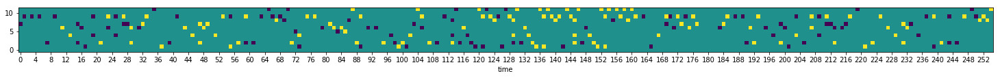

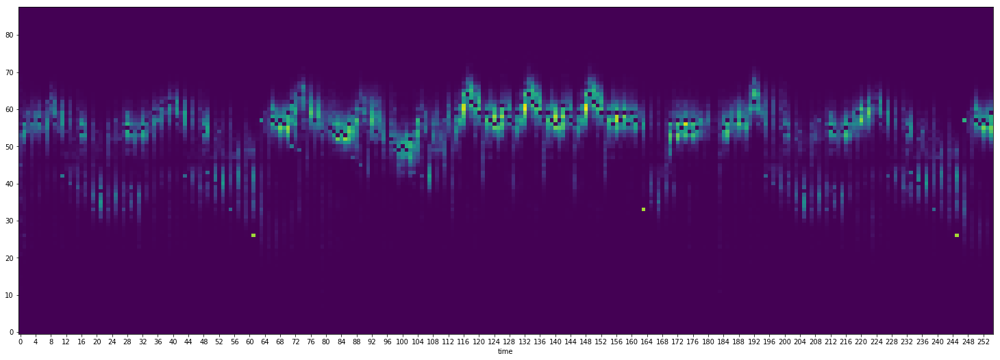

0.100244  mean for last:  0.105187


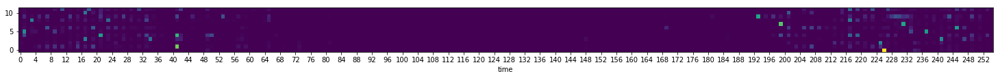

0.109417  mean for last:  0.106042


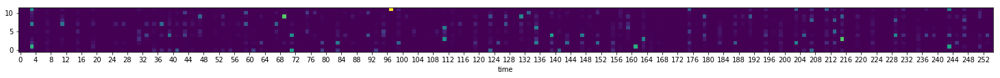

0.098914  mean for last:  0.104641


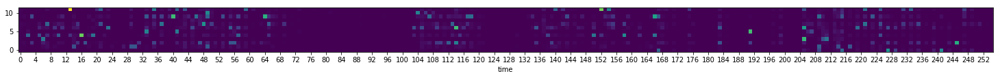

0.120476  mean for last:  0.106556


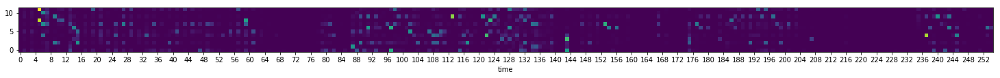

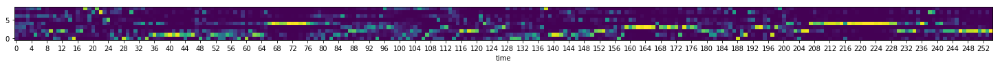

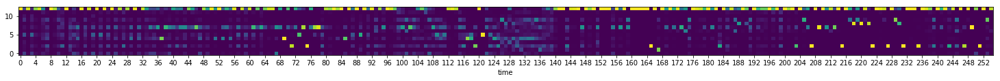

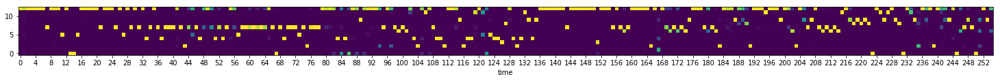

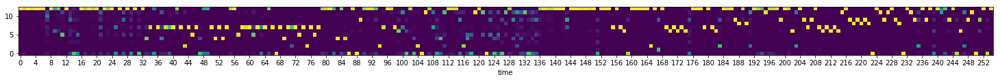

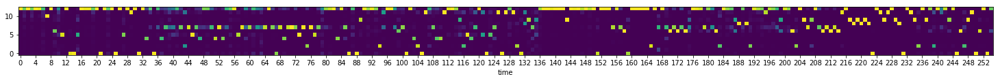

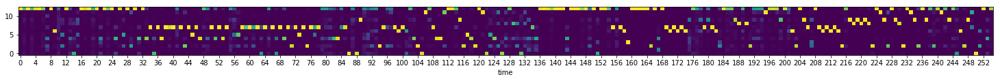

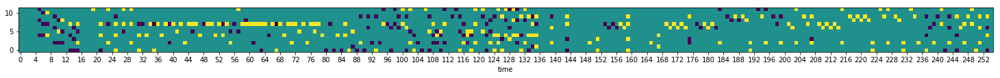

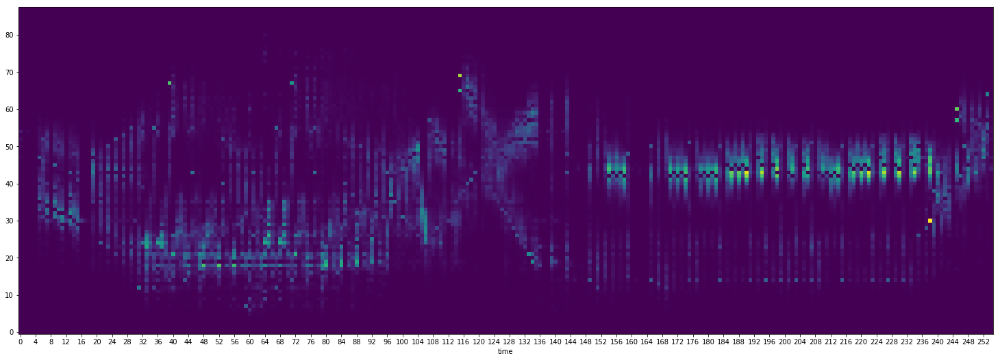

0.103963  mean for last:  0.105851


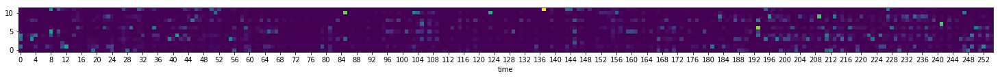

0.100292  mean for last:  0.104326


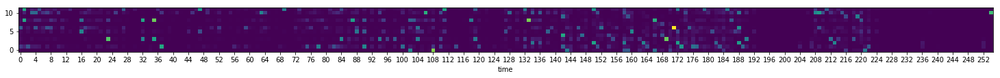

0.0957959  mean for last:  0.104127


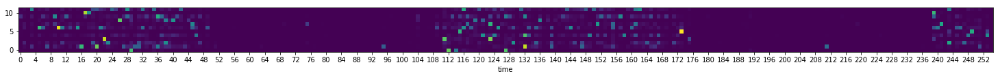

0.110797  mean for last:  0.104882


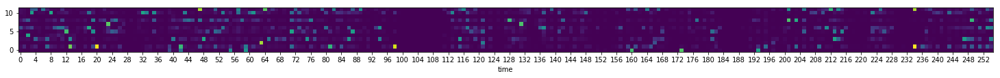

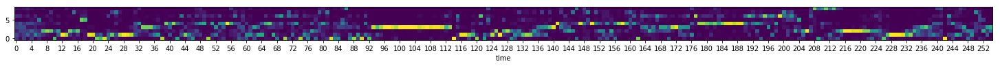

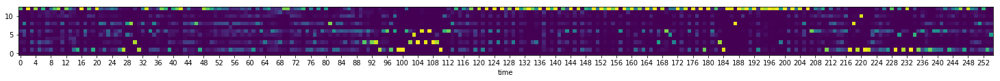

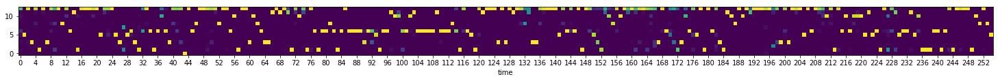

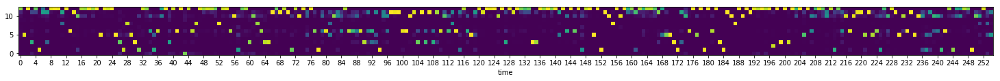

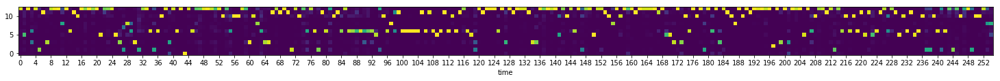

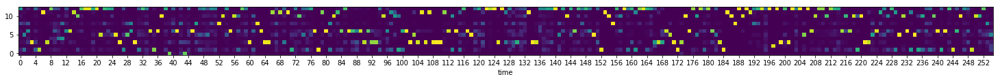

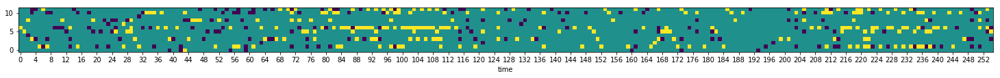

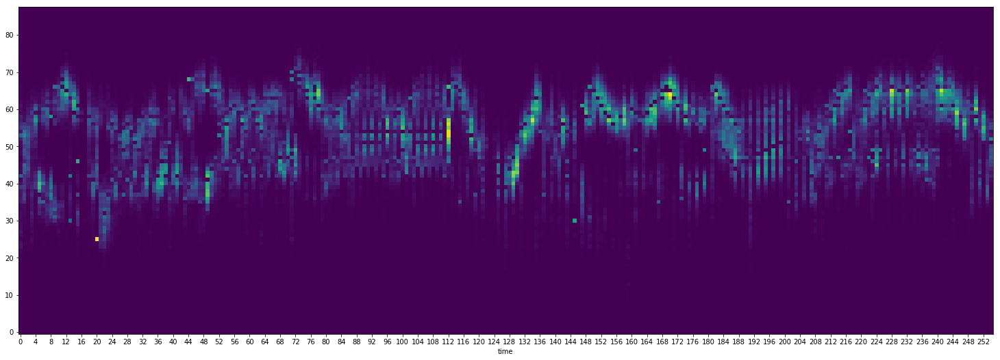

0.107934  mean for last:  0.106806


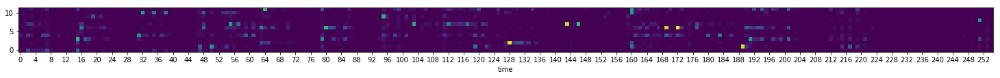

0.0985211  mean for last:  0.105547


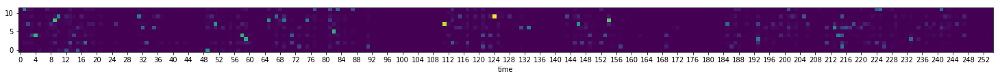

0.105462  mean for last:  0.104603


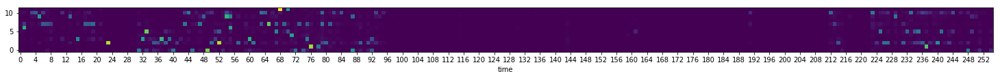

0.109182  mean for last:  0.104263


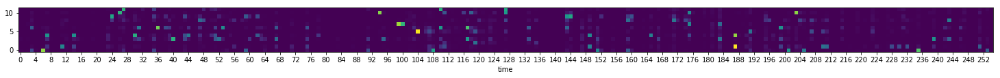

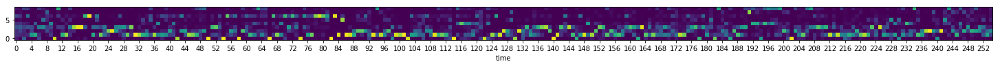

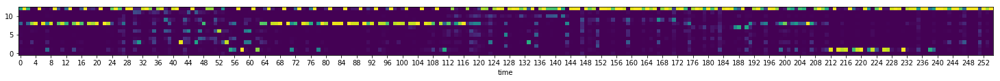

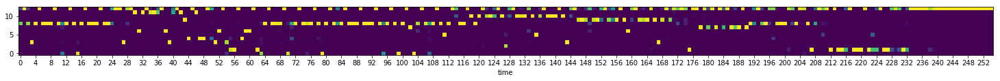

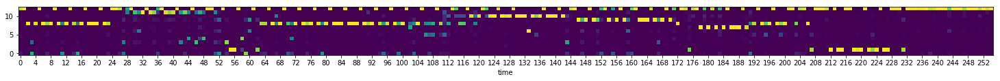

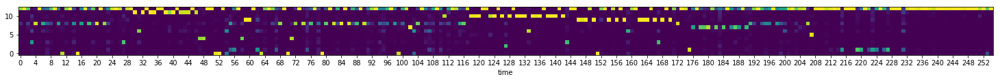

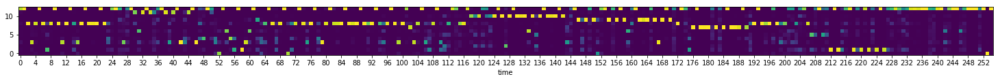

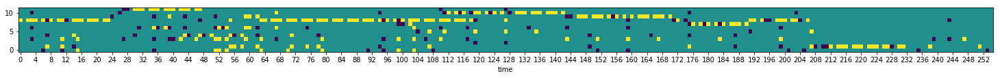

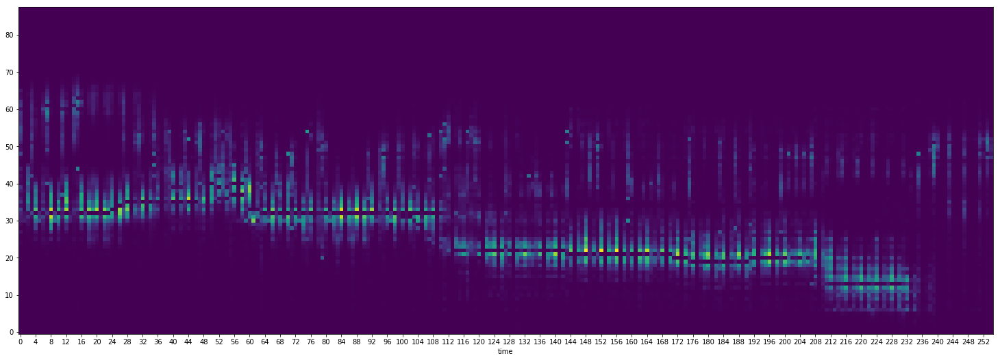

0.106023  mean for last:  0.104723


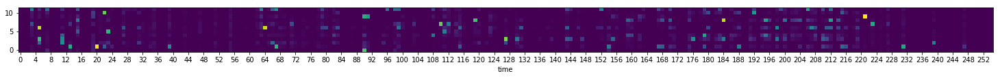

0.106156  mean for last:  0.105534


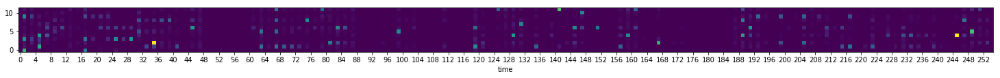

0.0998737  mean for last:  0.103876


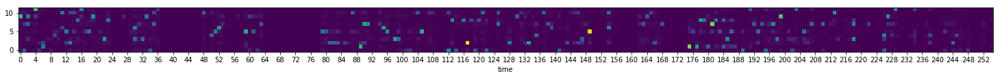

0.10529  mean for last:  0.105405


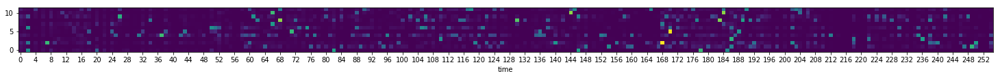

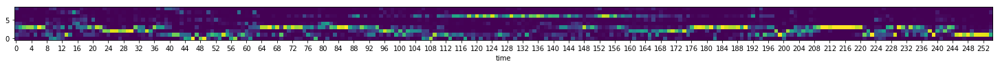

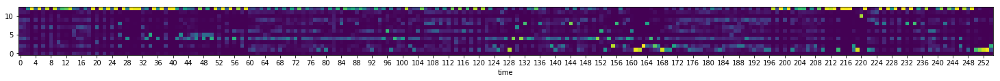

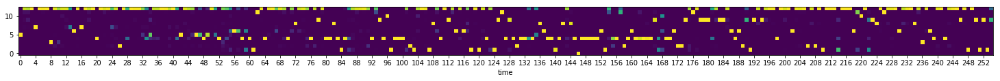

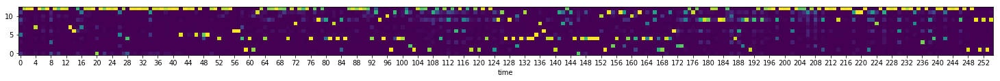

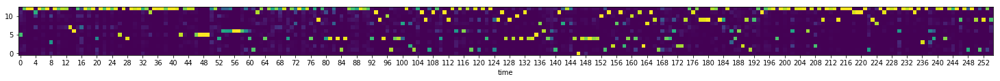

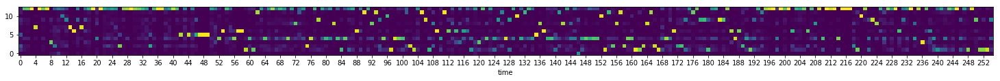

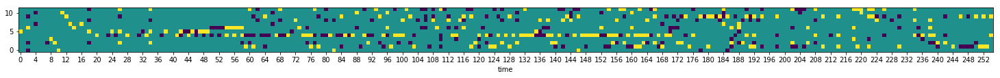

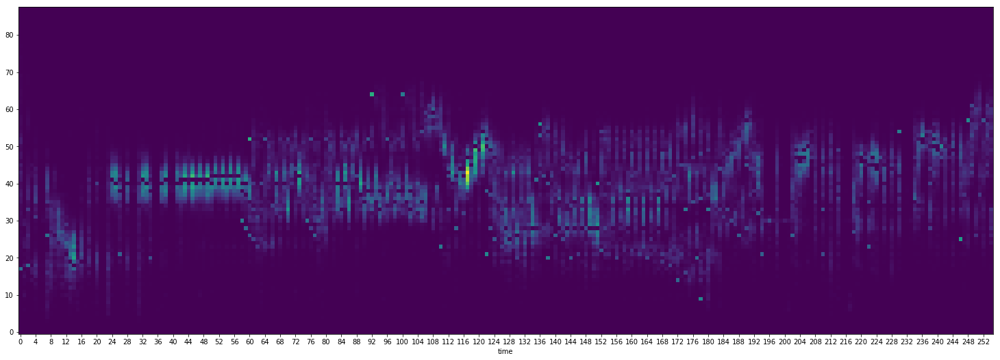

0.102618  mean for last:  0.104781


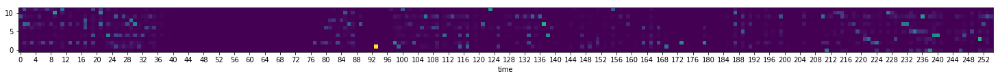

0.106478  mean for last:  0.104252


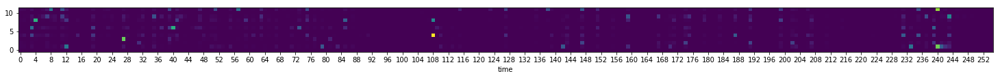

0.102344  mean for last:  0.103887


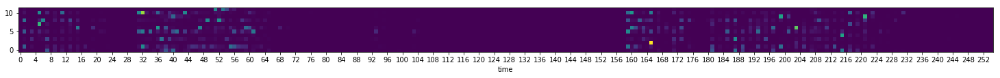

0.0984667  mean for last:  0.105362


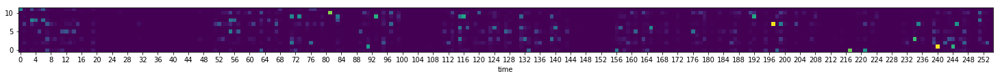

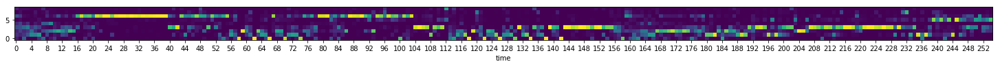

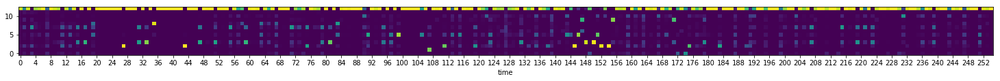

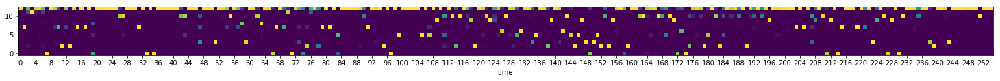

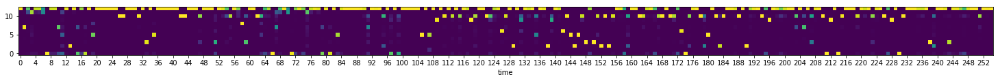

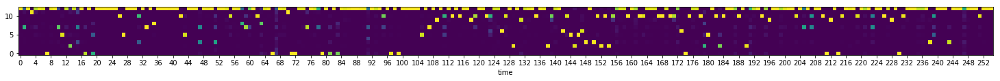

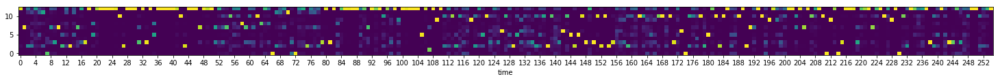

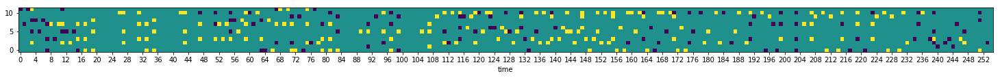

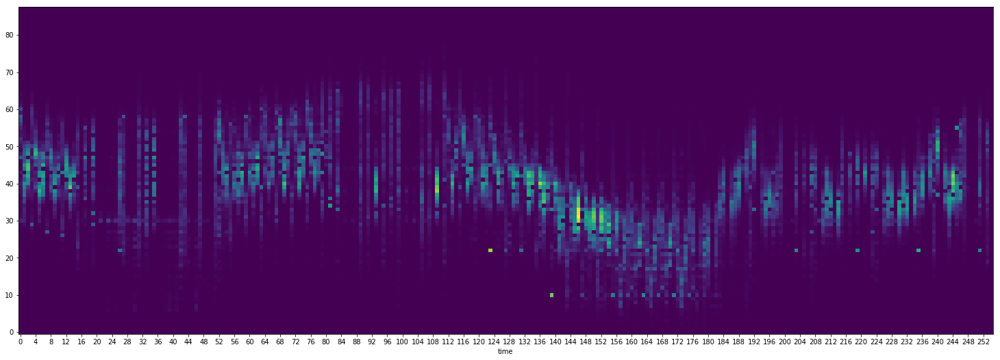

0.100242  mean for last:  0.104208


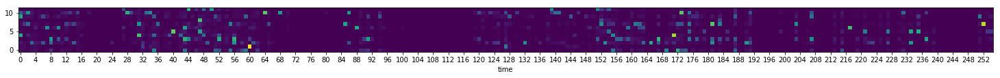

0.0981018  mean for last:  0.104323


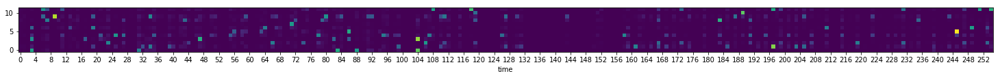

0.0989145  mean for last:  0.104176


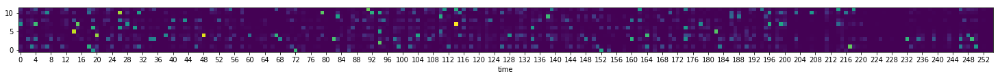

0.0982251  mean for last:  0.103516


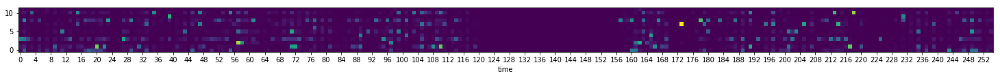

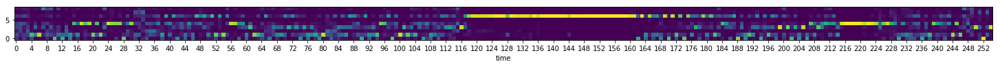

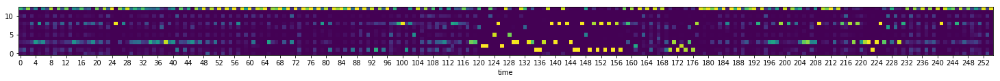

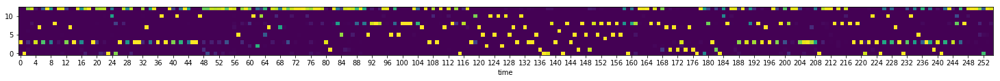

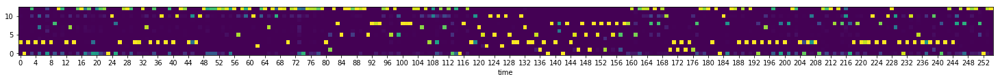

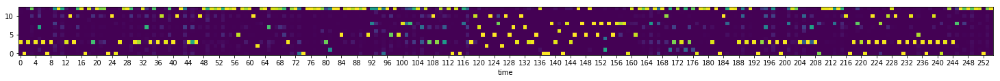

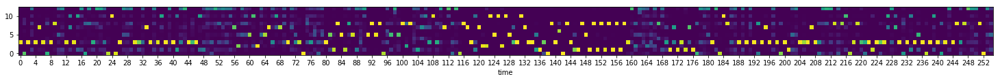

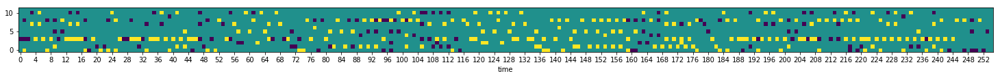

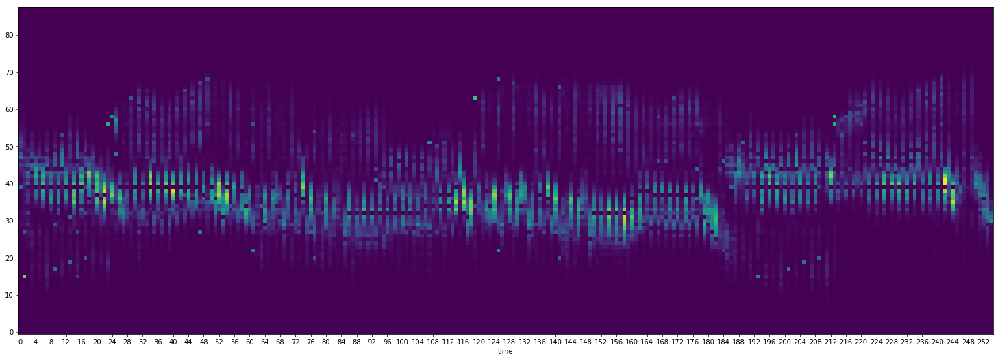

0.107591  mean for last:  0.103711


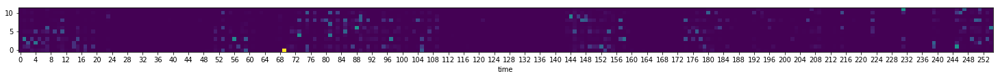

0.098794  mean for last:  0.104578


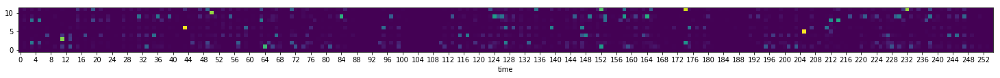

0.102822  mean for last:  0.104574


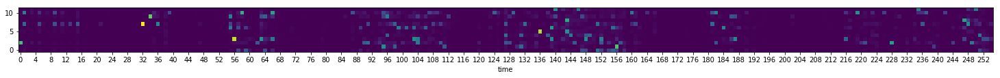

KeyboardInterrupt: 

In [213]:
training_steps = 200000
display_step = 50

#RECORD = 1

#losses = []
for step in range(training_steps + 1):
    # getting data
    batch_x, batch_h, batch_d = generateBatch()
    # Run optimization step
    fd = {X: batch_x, History: batch_h, was_sampled_notes_given: False, DecodedX: batch_d}
    _, L = sess.run([train_op, ce], feed_dict=fd)
    losses.append(L.mean())
    
    if np.isnan(L).any():
        print(" DAMN NAN ERROR")
        break
        
    if step % display_step == 0:
        print(L.mean(), " mean for last: ", np.array(losses)[-display_step:].mean())
        drawNotes(L[0])
        
        if step % 200 == 0:
            r = sess.run(read_index, feed_dict=fd)
            drawNotes(r[0])
            
            sn = sess.run(voices_proba, feed_dict=fd)
            for i in range(5):
                drawNotes(sn[i][0])
            
            sn = sess.run(sampled_notes, feed_dict=fd)
            drawNotes(sn[0] - batch_x[0, 1:, :12]*(1-sn[0]))
                
            sn = sess.run(decoder_ce, feed_dict=fd)
            drawNotes(sn[0])
           
    if len(losses) > display_step and np.array(losses)[-display_step:].mean() < RECORD:
        RECORD = np.array(losses)[-display_step:].mean()
        saver.save(sess, "./tmp/100-100-100 HistoryUserScheme LSTM collapsed CM_dataset songs by fragments 9-history 6-times 5-40LSTMconditionalvoices 100-decoder lr=0.01.ckpt")
        
print("Optimization Finished!")

0.103175


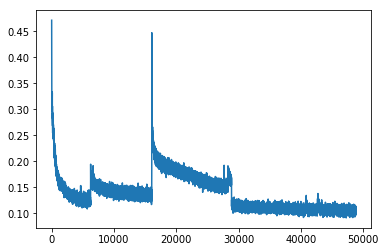

In [214]:
import matplotlib.pyplot as plt
%matplotlib inline

print(RECORD)
plt.plot(losses)  #collapsed trans 100-100-100 40LSTM-condition

0.034971


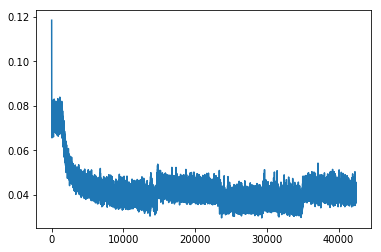

In [45]:
print(RECORD)
plt.plot(losses)  #100-100-100

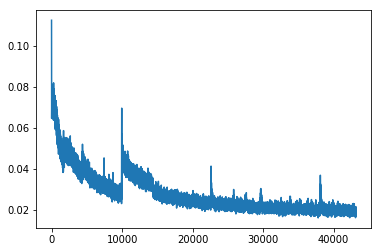

In [38]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.plot(losses)  #Adam

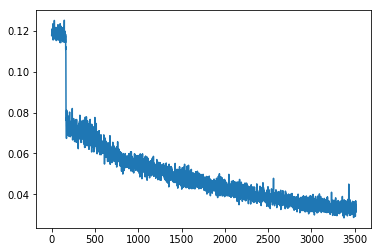

In [86]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.plot(losses)  # BackProp или как там его

In [96]:
#np.save("RSSPropLosses.npy", losses)

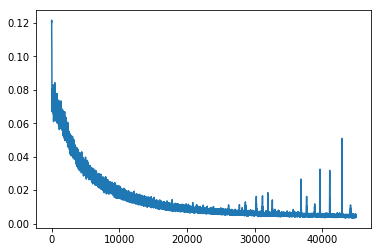

In [13]:
plt.plot(losses)  # 100-100

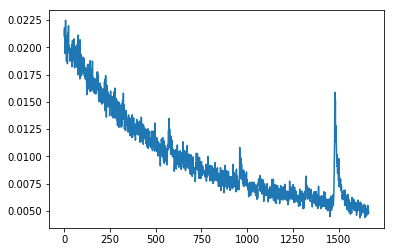

In [11]:
plt.plot(losses)  # one layer, from ~2000 epoch

(0, 0.1)

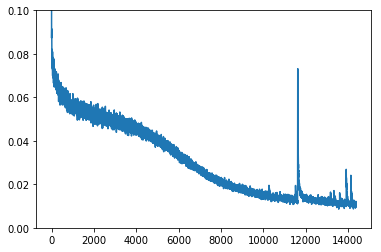

In [38]:
plt.plot(losses)
plt.ylim(0, 0.1)  # no voices mechanizm, one layer

In [1]:
import mido
from mido import MidiFile
import numpy as np
import copy
import math

import matplotlib.pyplot as plt
%matplotlib inline

# для возможности прослушивания midi прямо в ноутбуке
HEARING_PORT = mido.open_output()
# для вывода массивов numpy целиком
np.set_printoptions(threshold=np.nan)

BASE_NOTE = 21
KEYS = 88
FREQ = 4  #ticks for beat

def drawSong(song, scale=(None, None)):
    if scale[0] is None:
        scale = (song.notes.shape[0] / 10, song.notes.shape[1] / 10)
    
    plt.figure(figsize=scale)
    plt.title(song.name)
    plt.imshow(song.notes.T, aspect='auto', origin='lower')
    plt.xlabel("time")
    plt.xticks(np.arange(0, song.notes.shape[0], 4))
    plt.show()

# Класс для создания нового миди файла
class MySong:
    def __init__(self, played_lines=[], finished=False):
        self.name = "Generated song!"
        self.notes = np.zeros((0, 88))

        self.mid = MidiFile(type=0)
        self.track = mido.MidiTrack()
        self.mid.tracks.append(self.track)

        self.time_passed = 0
        self.release = []

        for line in played_lines:
            self.add(line)
           
        if finished:
            self.finish()

    # добавление новых строк в ноты
    def add(self, played):
        self.notes = np.vstack([self.notes, played])

        # "отпуск" нот, сыгранных долю назад
        if played.sum() > 0:
            for i in self.release:
                self.track.append(mido.Message('note_on', note=BASE_NOTE + i, velocity=0, time=self.time_passed))
                self.time_passed = 0
            self.release = []

        # добавление новых нот
        for i, key in enumerate(played):
            if key == 1:
                self.track.append(mido.Message('note_on', note=BASE_NOTE + i, velocity=64, time=self.time_passed))
                self.time_passed = 0
                self.release.append(i)
        self.time_passed += self.mid.ticks_per_beat // FREQ

    # должна быть вызвана в конце создания файла
    def finish(self):
        for i in self.release:
            self.track.append(mido.Message('note_off', note=BASE_NOTE + i, velocity=64, time=self.time_passed))
            self.time_passed = 0
        self.track.append(mido.Message('note_off', note=BASE_NOTE, velocity=0, time=self.time_passed))

    # воспроизведение
    def play(self):
        for msg in self.mid.play():
            HEARING_PORT.send(msg)

    # сохранение
    def save_file(self, name):
        self.mid.save(name + '.mid')

In [13]:
def pers_transform(song, stack_zeros=True):    
    wh = song[:]
    
    temp = wh.copy()
    for t in HISTORY_TIMES:
        h = np.roll(temp, t, axis=0)
        h[:t] = 0
        wh = np.concatenate([wh, h], axis=1)
          
    wh = np.concatenate([wh, times[:song.shape[0]]], axis=1)
            
    return wh

In [14]:
def octave_sample(dec_p, all_sampled):
    ans = (np.random.uniform(0, 1, 88) < 1 / (1 + np.exp(-dec_p))) * np.tile(all_sampled, 8)[:88]
    for i, val in enumerate(all_sampled):
        if val == 1 and ans[i::12].sum() == 0:
             ans[i + dec_p[i::12].argmax()*12] = 1
    return ans

In [46]:
res = []

In [ ]:
LR = 0.00001

for s in range(58):
    saver.restore(sess, "./tmp/100-100-100 HistoryUserScheme LSTM collapsed CM_dataset songs by fragments 9-history 6-times 5-40LSTMconditionalvoices 100-decoder lr=0.01.ckpt")
    
    song = songs[np.random.randint(0, 100)][:16]
    gen = transform(song)[:, :12]
    
    transd = pers_transform(gen)        
    t, h = np.hstack([transd[:, :12], transd[:, -ADDITIONAL_INPUT_SIZE:]]), transd[:, 12:-ADDITIONAL_INPUT_SIZE].reshape(-1, len(HISTORY_TIMES), 12) 
    
    for i in range(2, 17):
        sess.run(train_op, feed_dict={learning_rate: LR,
                                      X: np.repeat(t[None, :i], batch_size, axis=0), 
                                      History: np.repeat(h[None, :i], batch_size, axis=0),
                                      DecodedX: np.repeat(song[None, :i], batch_size, axis=0),
                                      was_sampled_notes_given: False})
    
    tsn = np.array(sess.run(sampled_notes_by_voices, feed_dict={X: np.repeat(t[None], batch_size, axis=0), 
                                                       History: np.repeat(h[None], batch_size, axis=0),
                                                       was_sampled_notes_given: False}))[:, 0]

    while len(gen) < 512:
        gen = np.vstack([gen, np.ones((12))])
        song = np.vstack([song, np.zeros((88))])

        transd = pers_transform(gen[-256:])
        t, h = np.hstack([transd[:, :12], transd[:, -ADDITIONAL_INPUT_SIZE:]]), transd[:, 12:-ADDITIONAL_INPUT_SIZE].reshape(-1, len(HISTORY_TIMES), 12)
        fd = {learning_rate: LR, X: np.repeat(t[None], batch_size, axis=0), History: np.repeat(h[None], batch_size, axis=0),
             was_sampled_notes_given: True, truly_sampled_notes: np.repeat(tsn[:, None, -254:], batch_size, axis=1),
             DecodedX: np.repeat(song[None, -256:], batch_size, axis=0)}
        _, sampled, dec_p, all_sampled = sess.run([train_op, sampled_notes_by_voices, decoder_p, sampled_notes], feed_dict=fd)
        
        tsn = np.concatenate([tsn, np.array(sampled)[:, 0, -1:]], axis=1)
        
        song[-1] = octave_sample(dec_p[0, -1], all_sampled[0, -1])
        gen[-1] = all_sampled[0, -1]
        
        print('|', end="")
    print("yeah!", s)
    res.append(song)

INFO:tensorflow:Restoring parameters from ./tmp/100-100-100 HistoryUserScheme LSTM collapsed CM_dataset songs by fragments 9-history 6-times 5-40LSTMconditionalvoices 100-decoder lr=0.01.ckpt
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||yeah! 0
INFO:tensorflow:Restoring parameters from ./tmp/100-100-100 HistoryUserScheme LSTM collapsed CM_dataset songs by fragments 9-history 6-times 5-40LSTMconditionalvoices 100-decoder lr=0.01.ckpt
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||

||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||yeah! 11
INFO:tensorflow:Restoring parameters from ./tmp/100-100-100 HistoryUserScheme LSTM collapsed CM_dataset songs by fragments 9-history 6-times 5-40LSTMconditionalvoices 100-decoder lr=0.01.ckpt
|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||

In [40]:
test = np.zeros((gen.shape[0], 88))
test[:, 42:54] = gen

ms = MySong(test, finished=True)

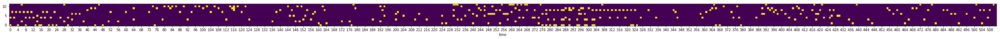

In [41]:
drawNotes(gen)

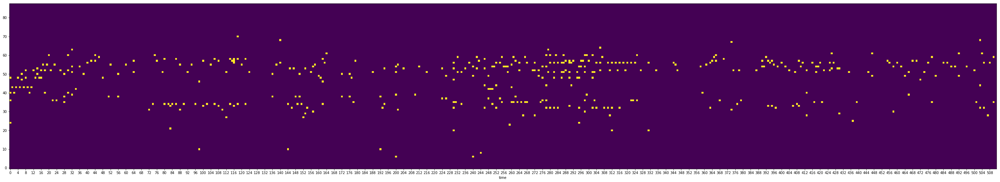

In [42]:
drawNotes(song)

In [43]:
ms.play()

In [44]:
ms = MySong(song, finished=True)

In [45]:
ms.play()

In [ ]:
finale = np.zeros((0, 88))
for r in res:
    finale = np.vstack([finale, np.zeros((8, 88))])
    finale = np.vstack([finale, r[16:]])

In [ ]:
finale.shape

In [ ]:
finale = finale[:28760]

In [ ]:
ms = MySong(finale, finished=True)

In [ ]:
ms.save_file("4. Conditional Voices and HistoryUser and Metalearning 0.00001")